In [4]:
import imp
imp.reload(residual)
imp.reload(clean)
imp.reload(run)

<module 'run' from '/Users/MatthewMan/Desktop/UofA/Attenuation, Absorption, & Scattering/Analysis/run.py'>

# -----------------------------------------------------------
# sDOM1 POSEIDON

In [10]:
filename = '20190426_085558_UTC_SDOM1_FLASH_POSEIDON1_P2_violet_both_2500Hz_20V_60s_19116085608.hld_up.hdf5'
a = clean.clean(filename)

percentage of high jumps in the file - 3.029756650211889


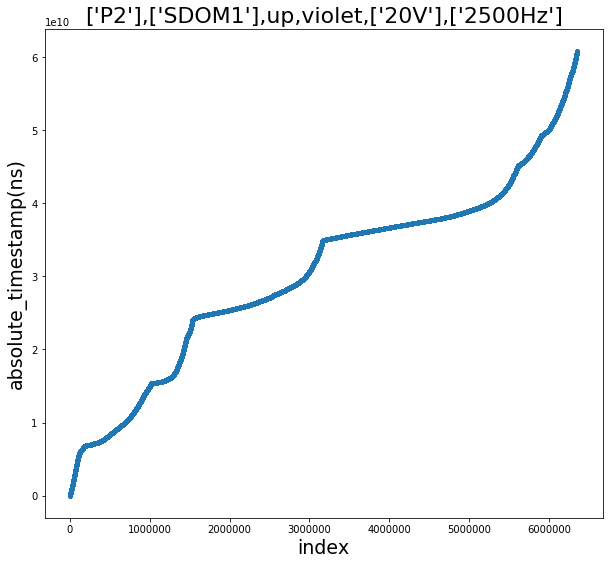

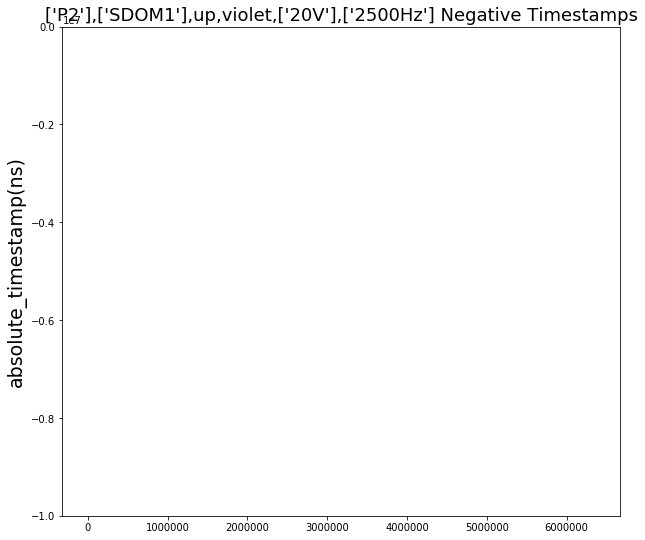

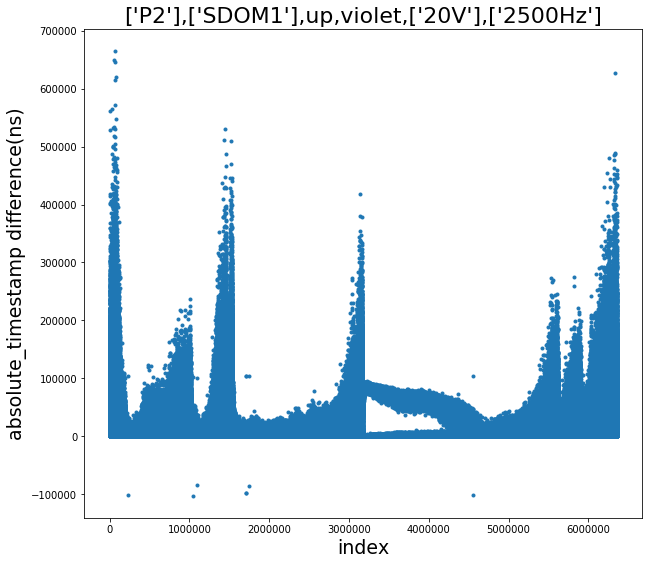

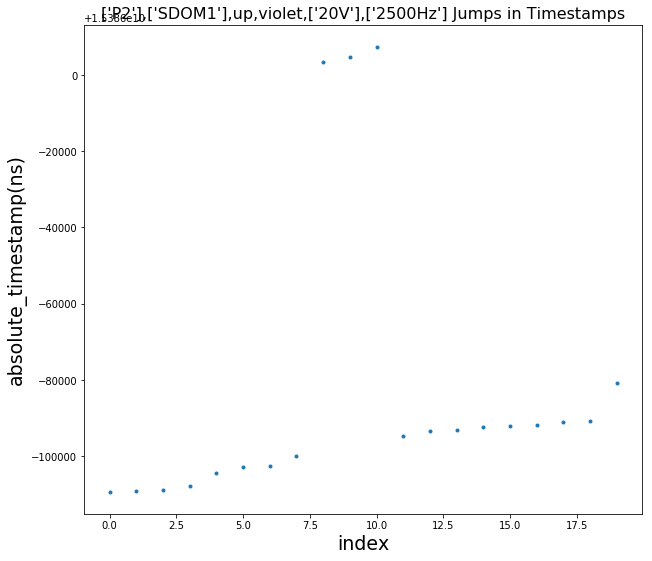

[ 230103.  230104. 1041308. 1041309. 1041310. 1101086. 1708941. 1708942.
 1713839. 1713840. 1749520. 1749521. 4548264. 4548265. 4548266.]


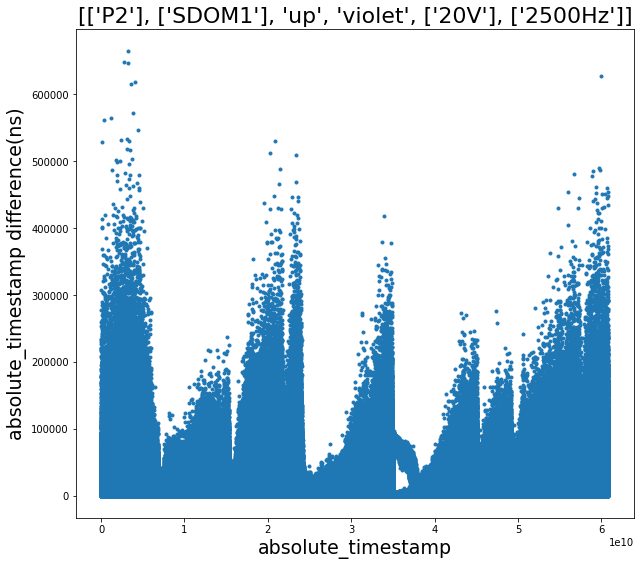

0.138071808682409


In [11]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = a.P_S_used()

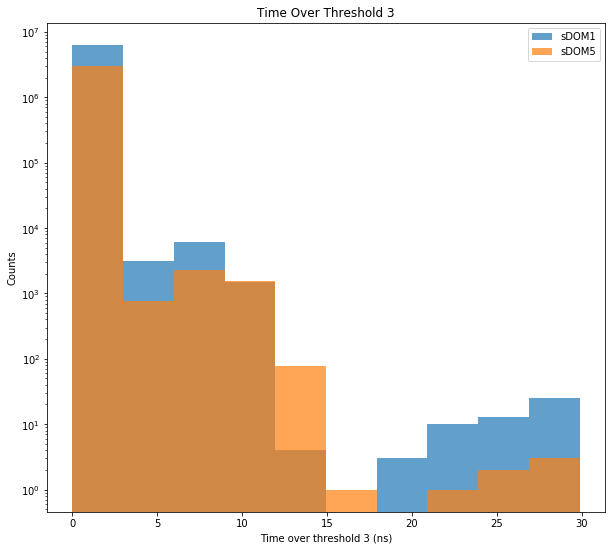

In [15]:
## Testing ToT_3
## Irrelevant to arrival time distribution
ToT_3_sDOM1 = falling_3_elim_3 - rising_3_elim_3

fig, ax = plt.subplots(figsize=(10,9))
ax.hist(ToT_3_sDOM1,alpha=0.7,log=True,label='sDOM1')
ax.hist(ToT_3_sDOM5,alpha=0.7,log=True,label='sDOM5')
ax.set_ylabel('Counts')
ax.set_xlabel('Time over threshold 3 (ns)')
ax.legend()
ax.set_title('Time Over Threshold 3')

plt.savefig('Data/POSEIDON1/violet/testing/ToT_3.png',bbox_inches='tight')

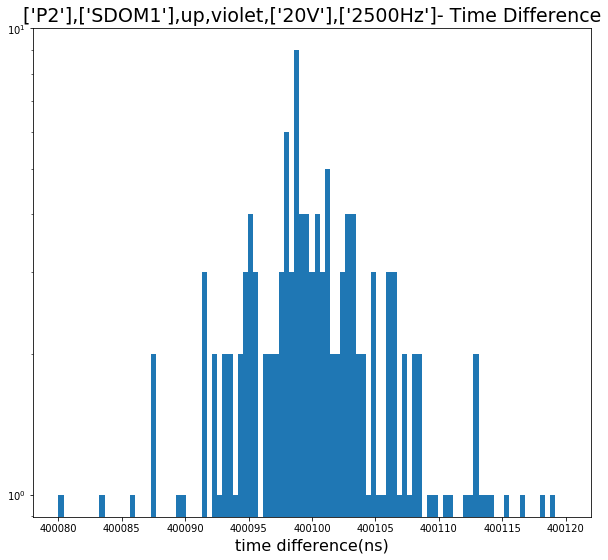

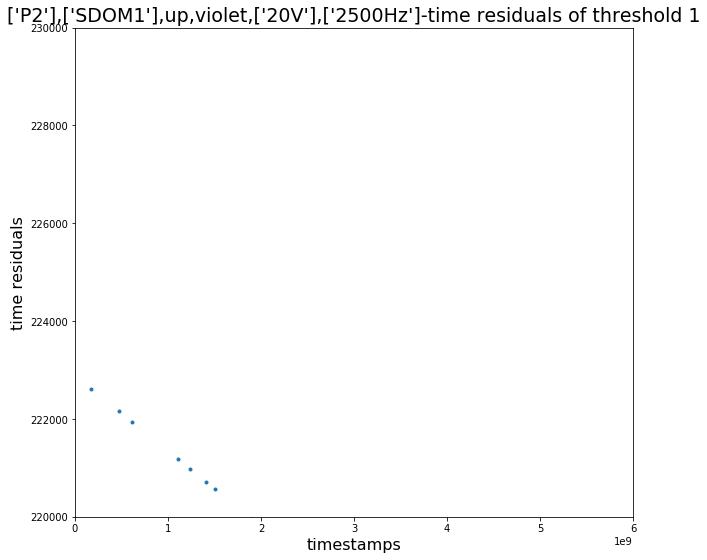

In [27]:
r1 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             0.0e10,0.6e10,220000, 230000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

In [36]:
gaus_peak = r1.minimizer(0.0e10, 0.5e10)

400100.7156722718


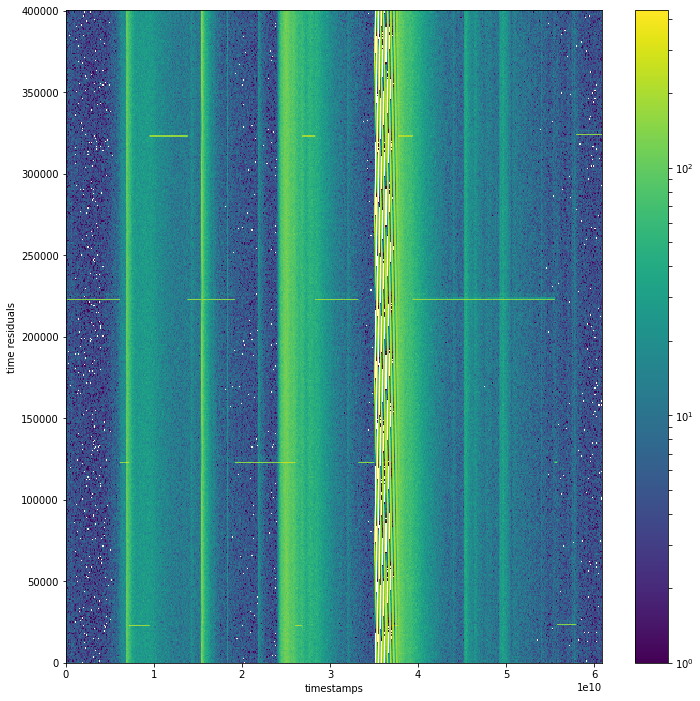

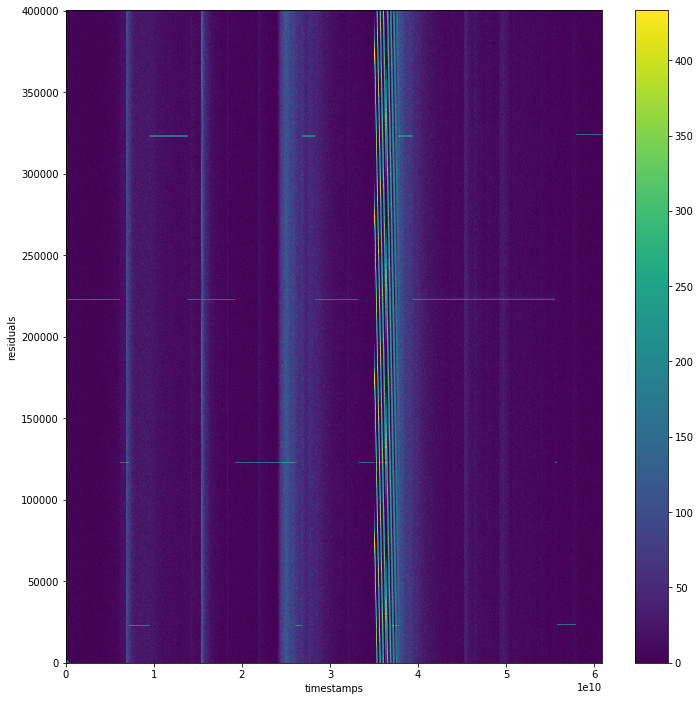

In [28]:
gaus_peak = 400100.7156722718
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r1.HIST2D(500, gaus_peak, SDOM_num)

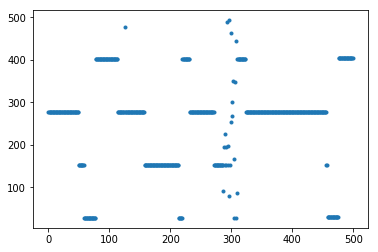

In [258]:
plt.plot(POCAM_bins, '.')

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


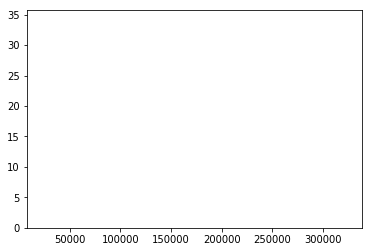

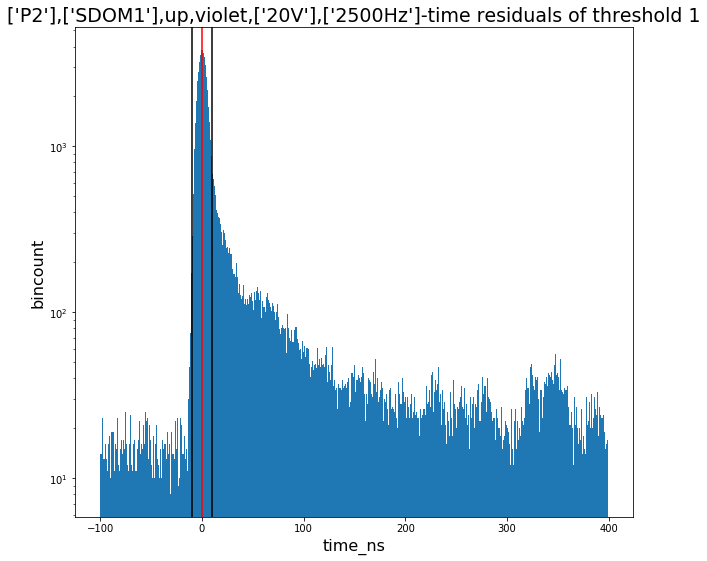

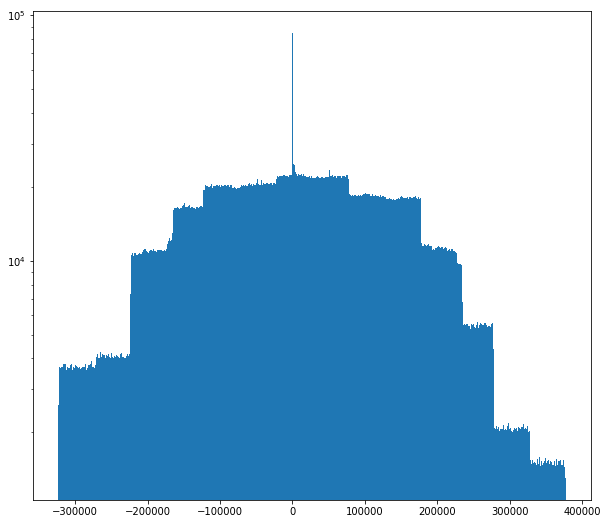

In [33]:
t_res_all1,num_events1, noise_events1 = r1.calc_res(BinsHist, 10, 2, 1,bin_size=1)

83
jump_index [ 0.  1.  3.  7. 12. 17. 25. 33. 34. 35. 36. 37. 38. 39. 40. 42. 45. 47.
 48. 49. 51. 52. 53. 54. 55. 57. 58. 59. 60. 61. 63. 64. 65. 66. 67. 69.
 70. 72. 75. 76.]
jump_index size 40
index_p 0
Jump Indices 0 2
2


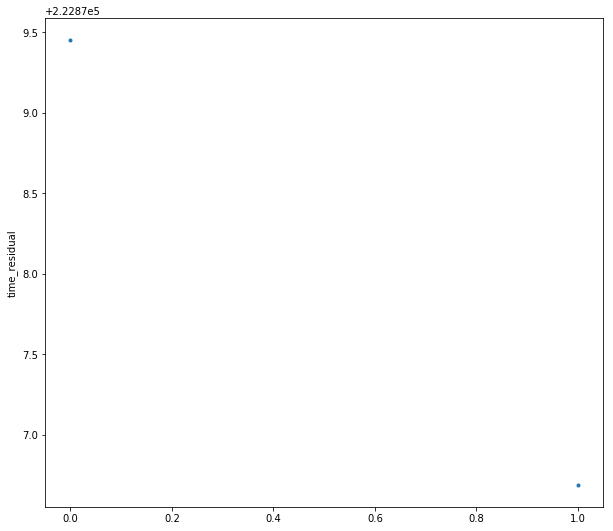

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


index_p 1
Jump Indices 2 4
2


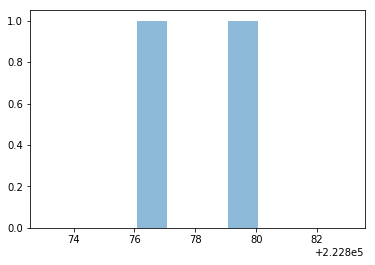

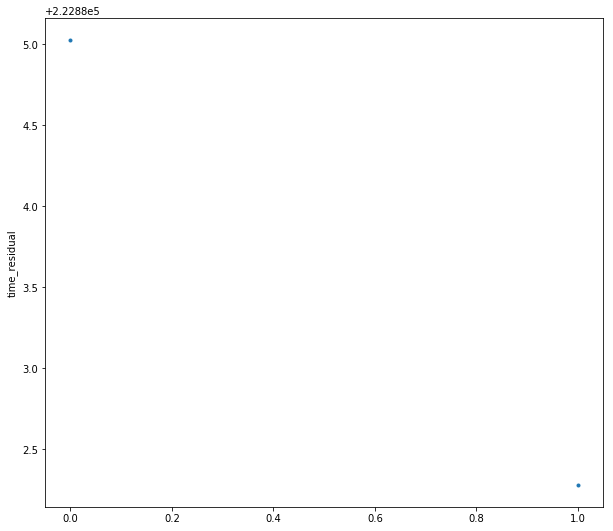

index_p 2
Jump Indices 4 8
4


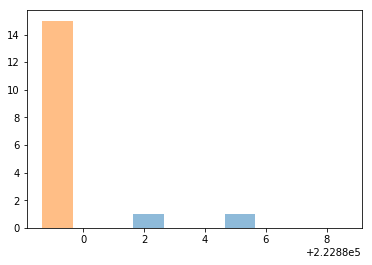

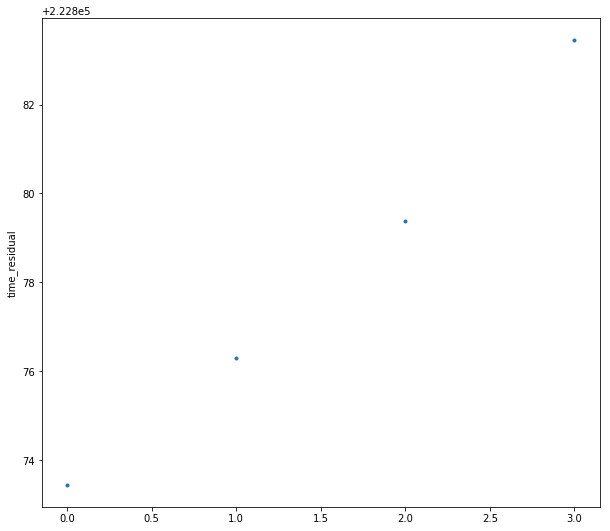

index_p 3
Jump Indices 8 13
5


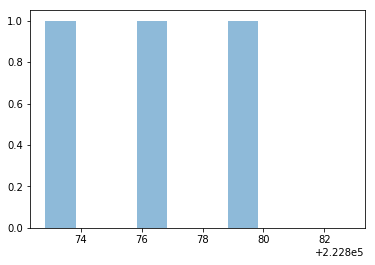

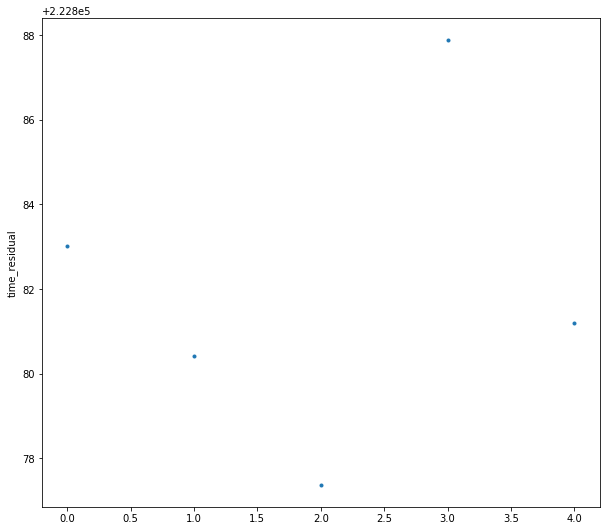

index_p 4
Jump Indices 13 18
5


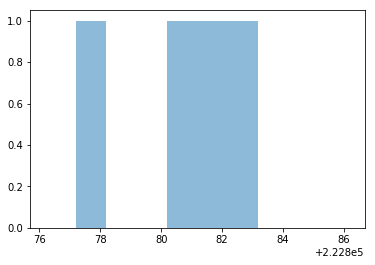

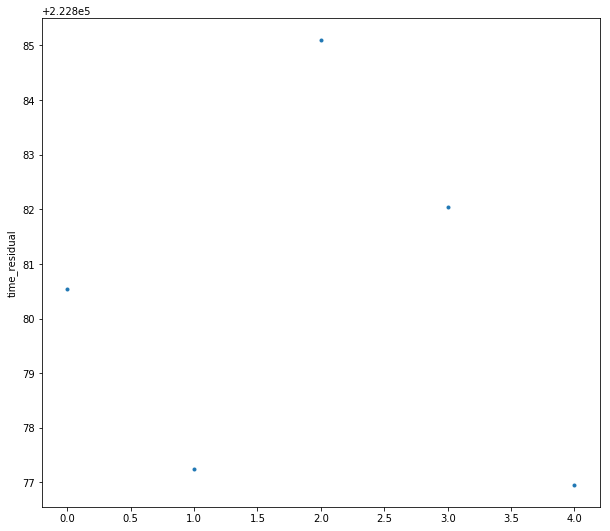

index_p 5
Jump Indices 18 26
8


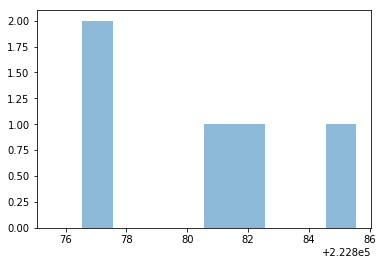

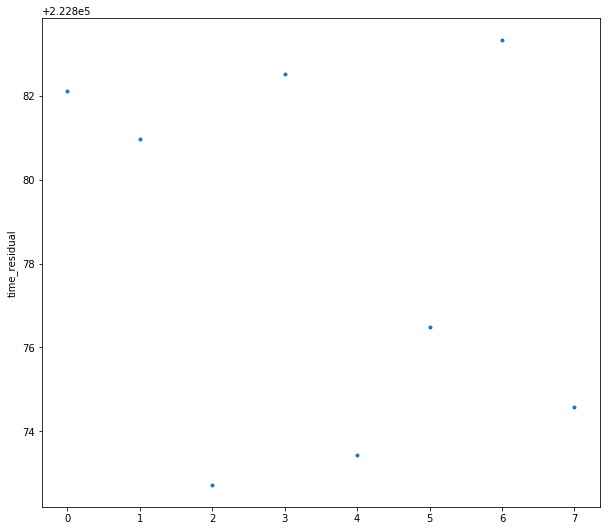

index_p 6
Jump Indices 26 34
8


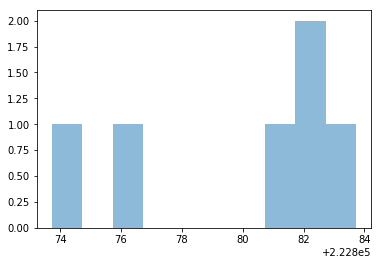

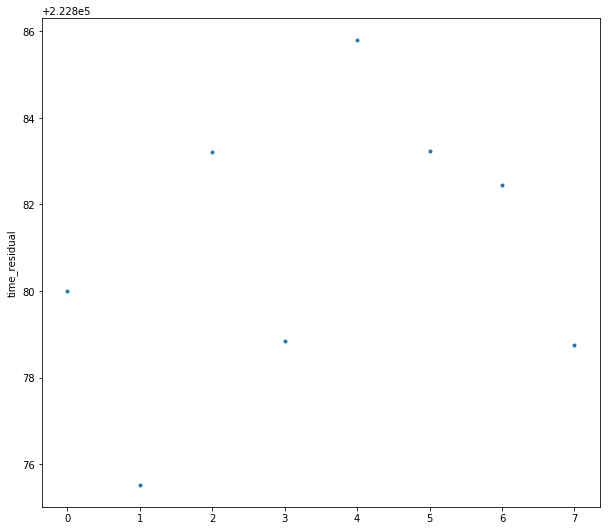

index_p 7
Jump Indices 34 35
1


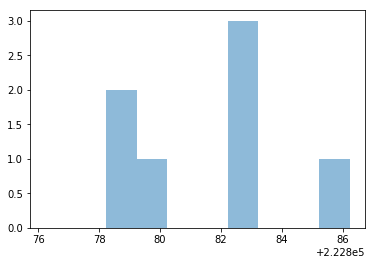

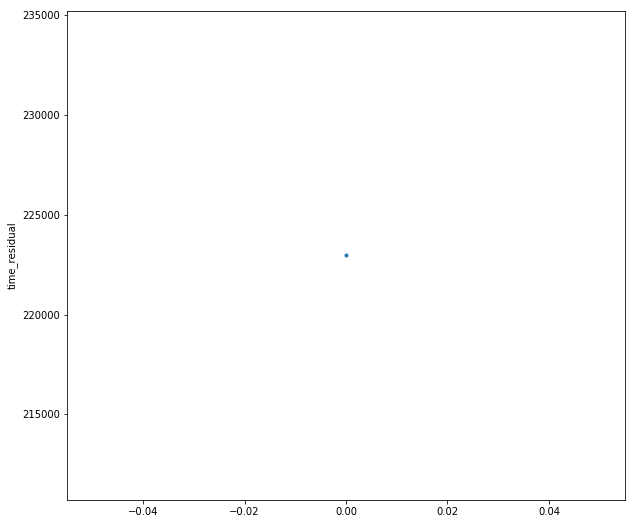

index_p 8
Jump Indices 35 36
1


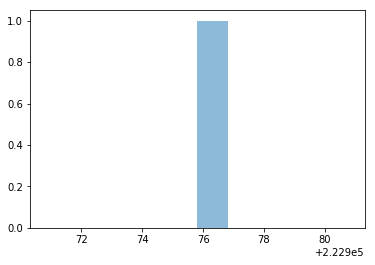

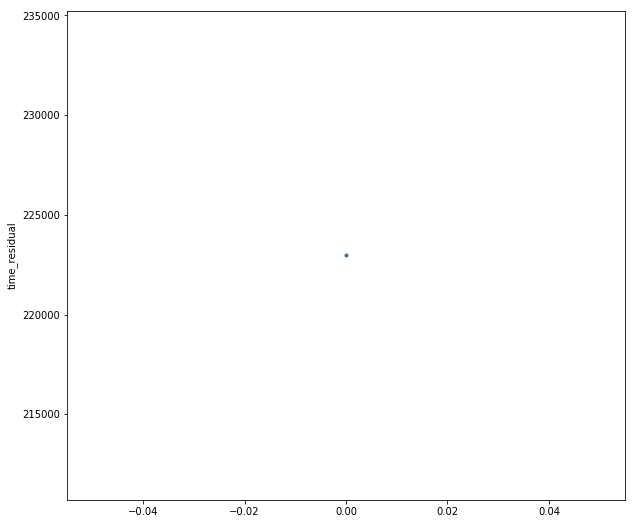

index_p 9
Jump Indices 36 37
1


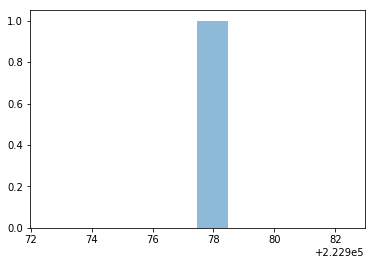

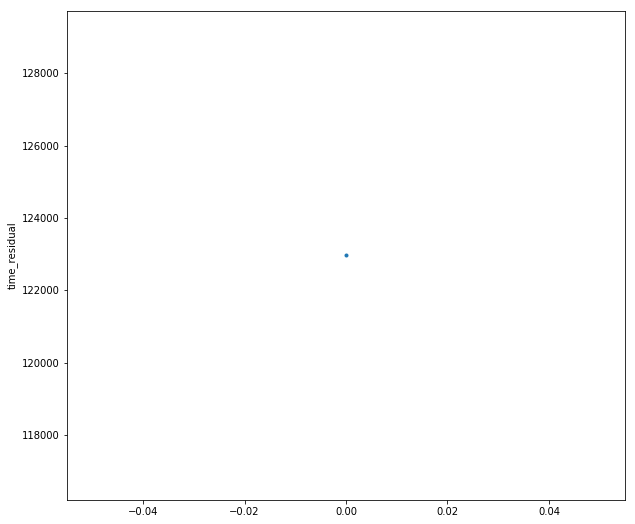

index_p 10
Jump Indices 37 38
1


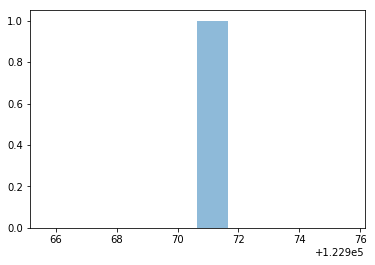

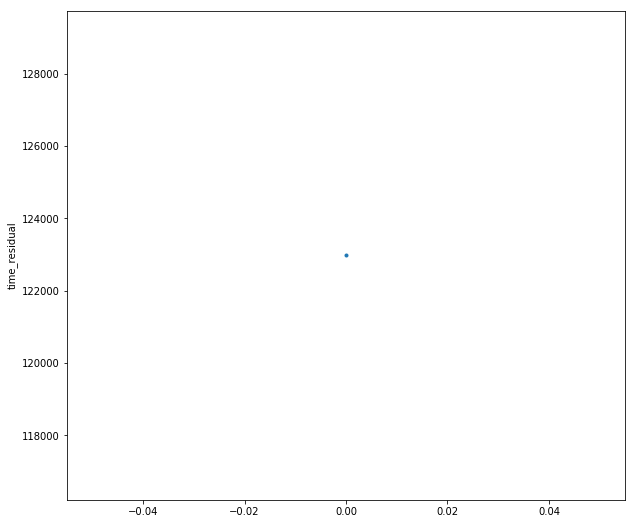

index_p 11
Jump Indices 38 39
1


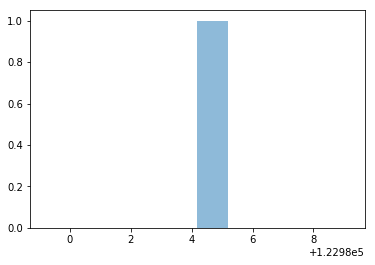

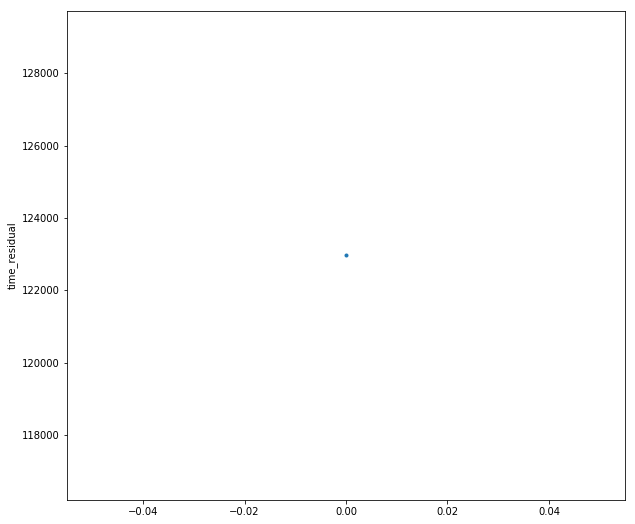

index_p 12
Jump Indices 39 40
1


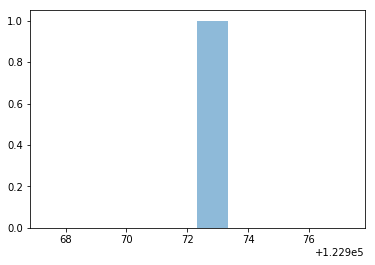

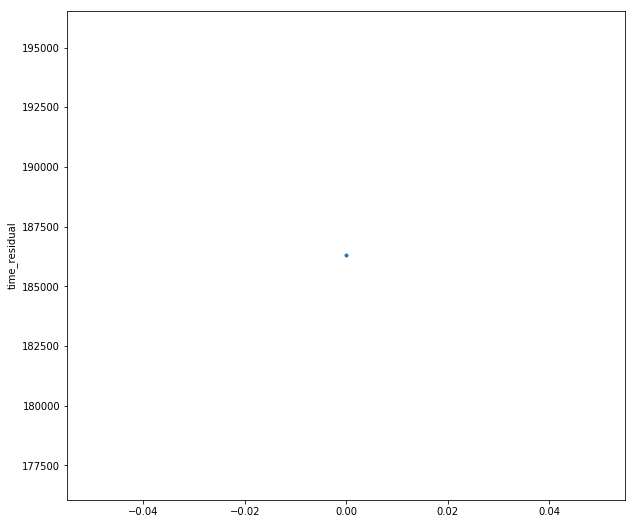

index_p 13
Jump Indices 40 41
1


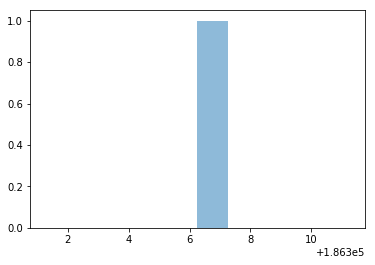

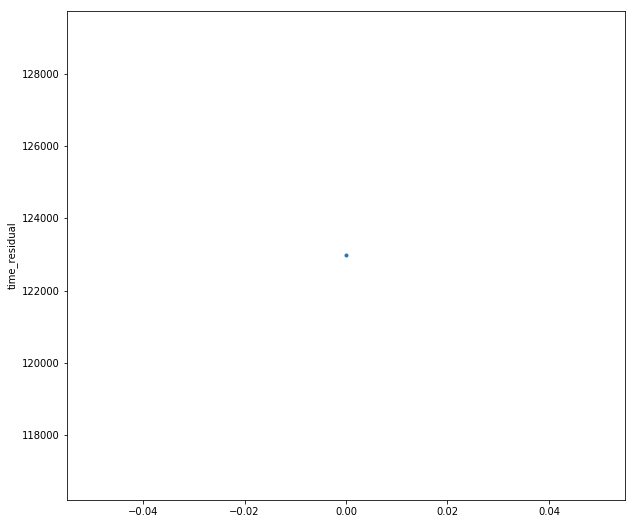

index_p 14
Jump Indices 41 43
2


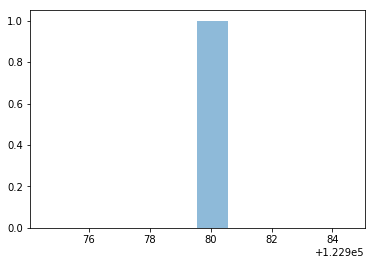

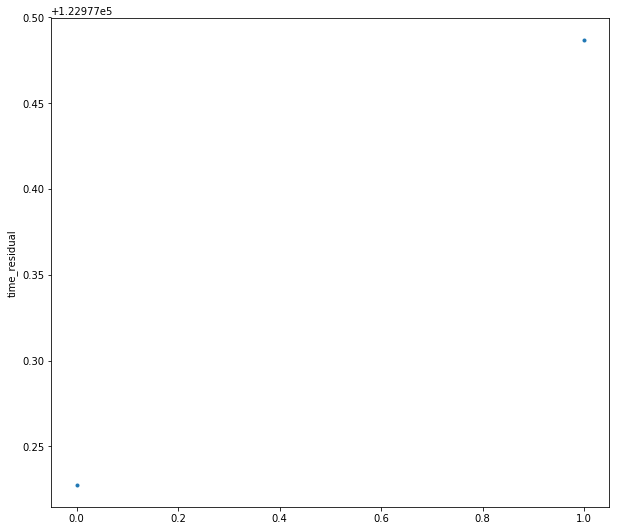

index_p 15
Jump Indices 43 46
3


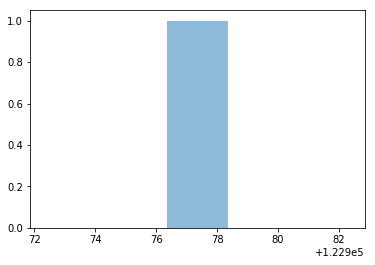

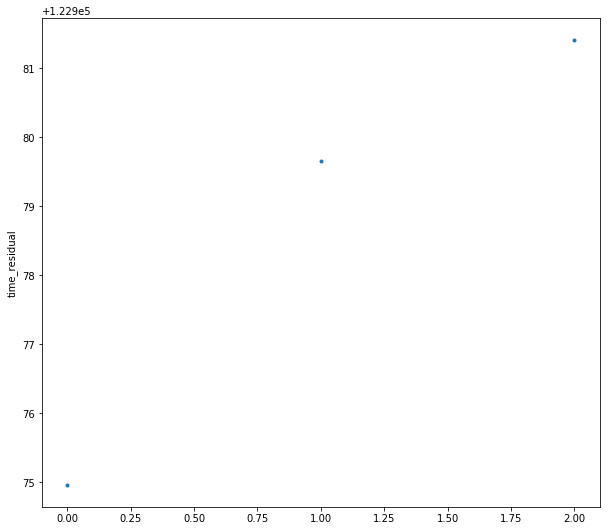

index_p 16
Jump Indices 46 48
2


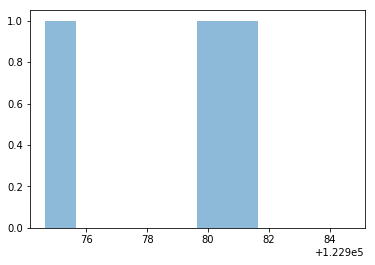

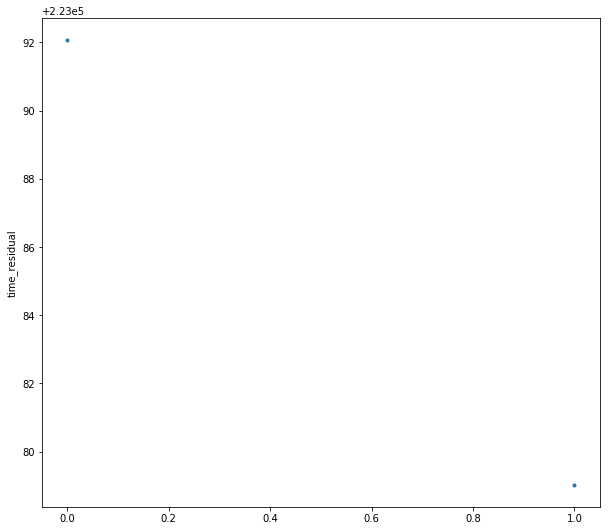

index_p 17
Jump Indices 48 49
1


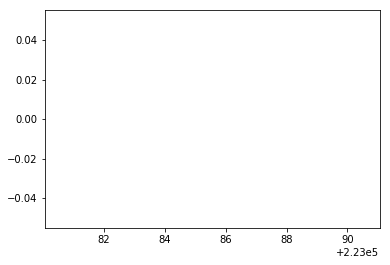

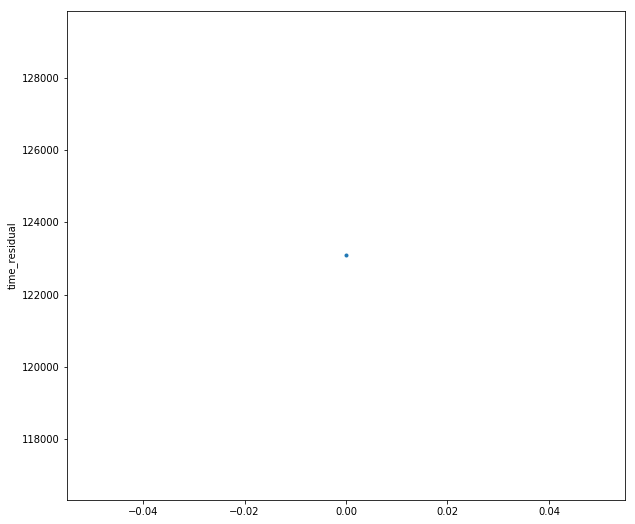

index_p 18
Jump Indices 49 50
1


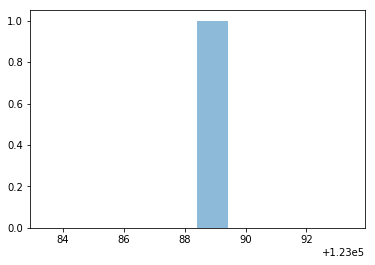

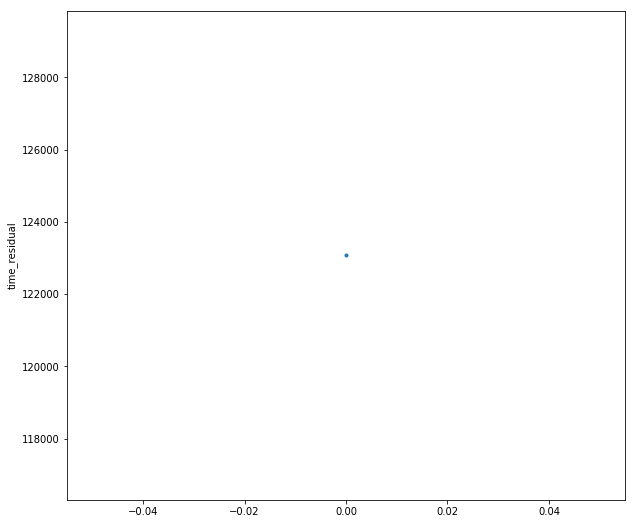

index_p 19
Jump Indices 50 52
2


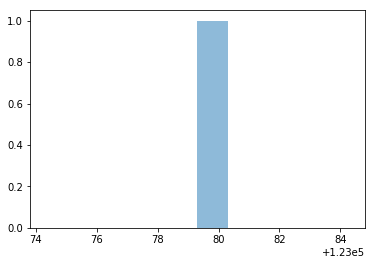

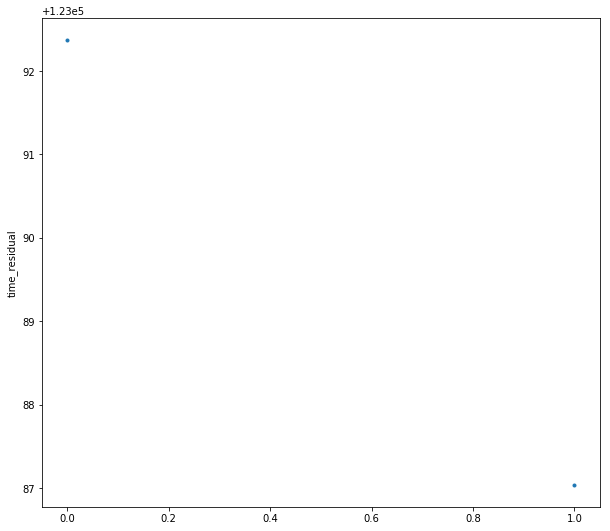

index_p 20
Jump Indices 52 53
1


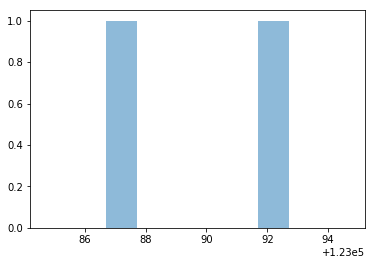

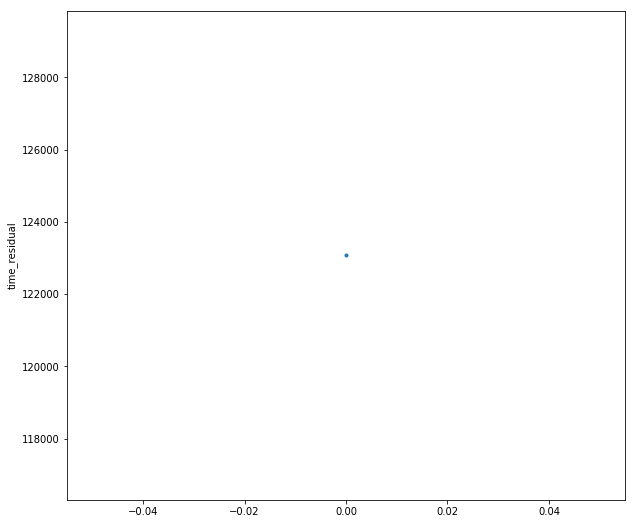

index_p 21
Jump Indices 53 54
1


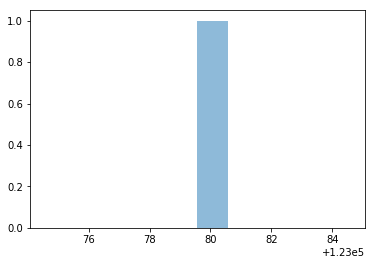

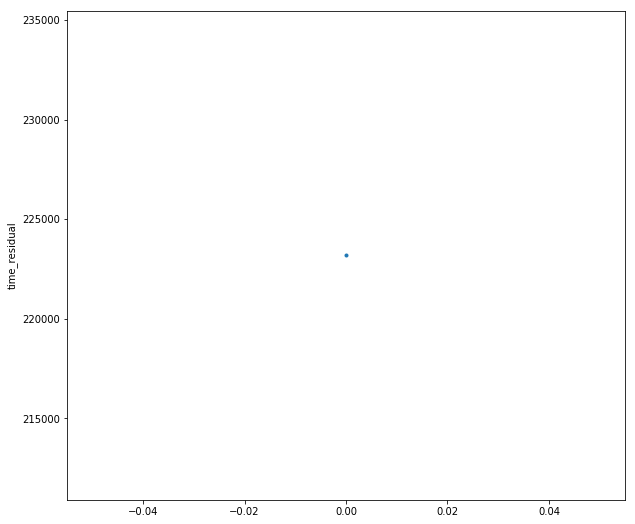

index_p 22
Jump Indices 54 55
1


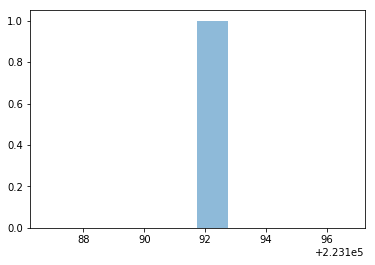

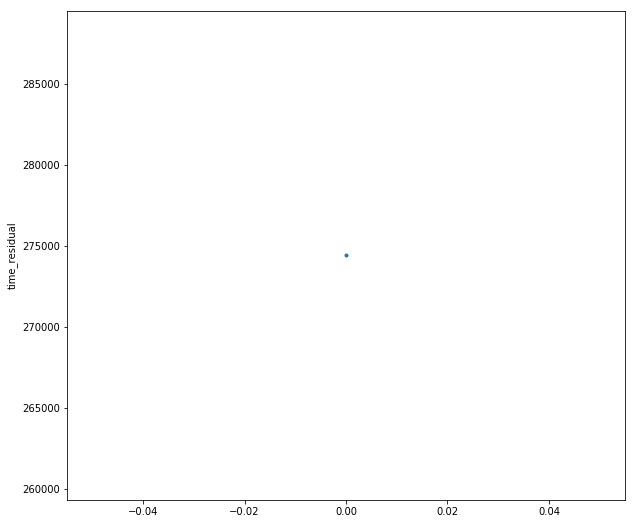

index_p 23
Jump Indices 55 56
1


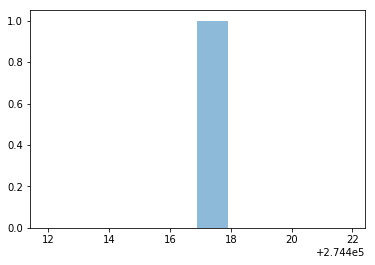

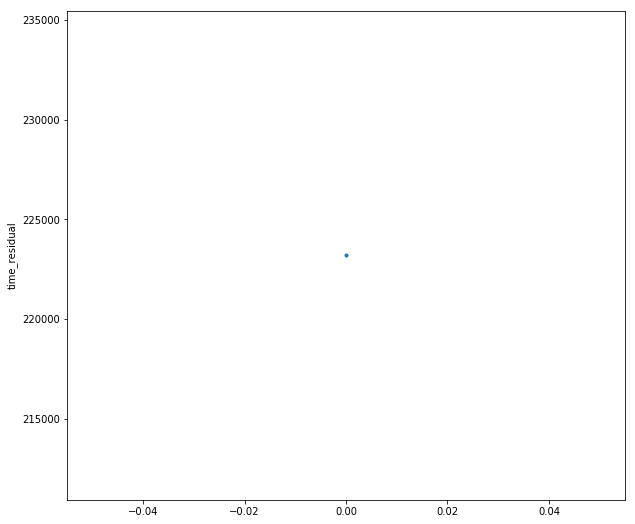

index_p 24
Jump Indices 56 58
2


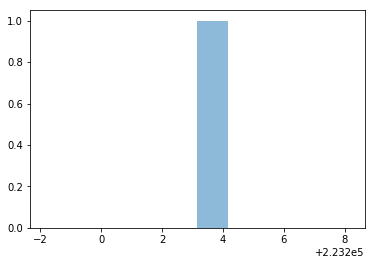

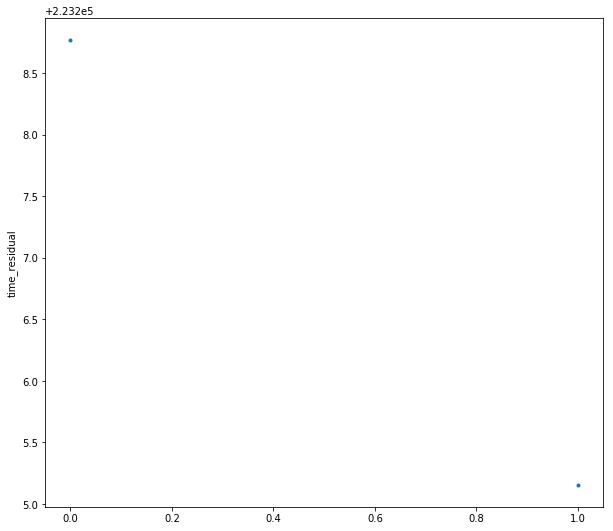

index_p 25
Jump Indices 58 59
1


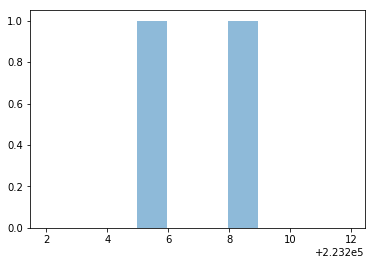

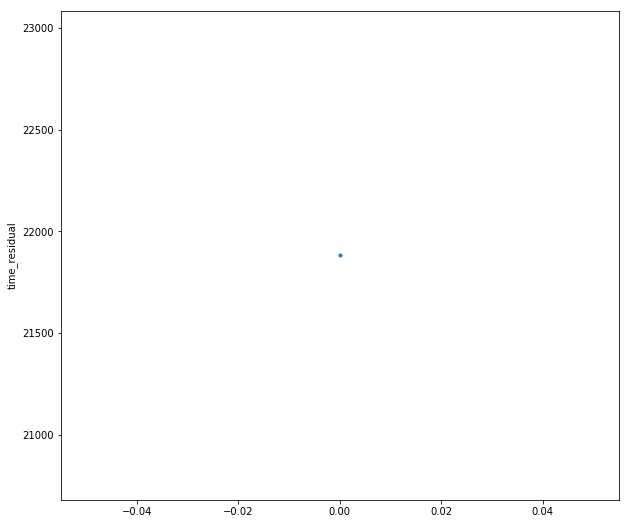

index_p 26
Jump Indices 59 60
1


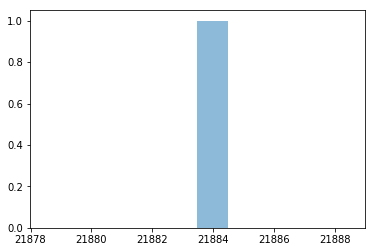

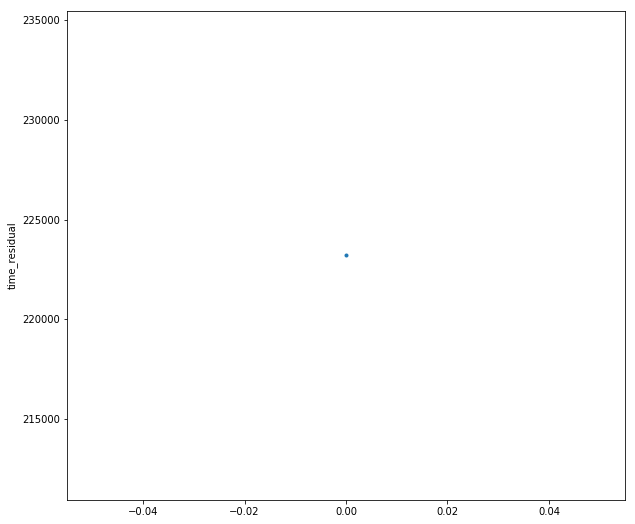

index_p 27
Jump Indices 60 61
1


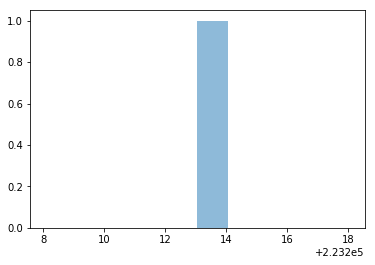

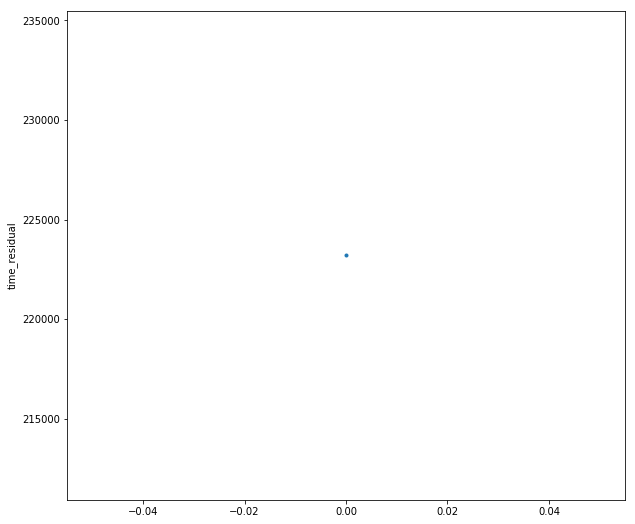

index_p 28
Jump Indices 61 62
1


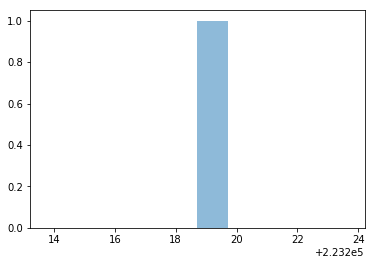

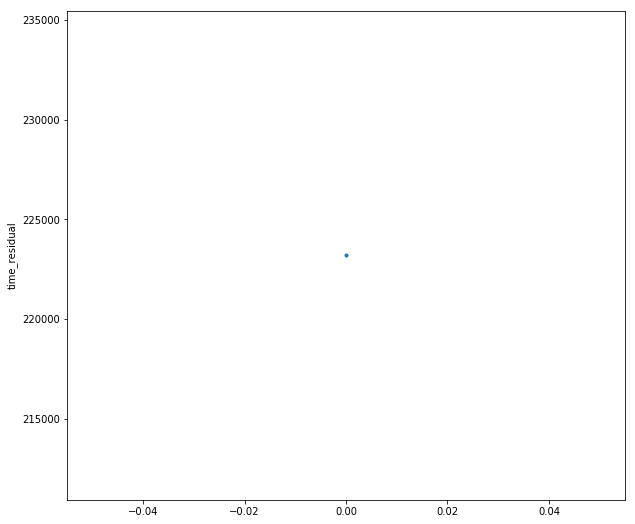

index_p 29
Jump Indices 62 64
2


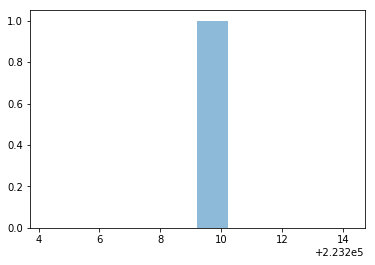

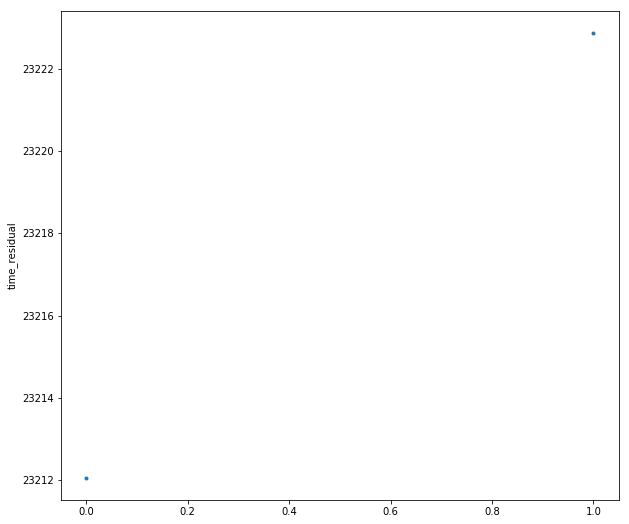

index_p 30
Jump Indices 64 65
1


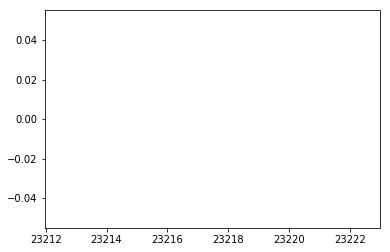

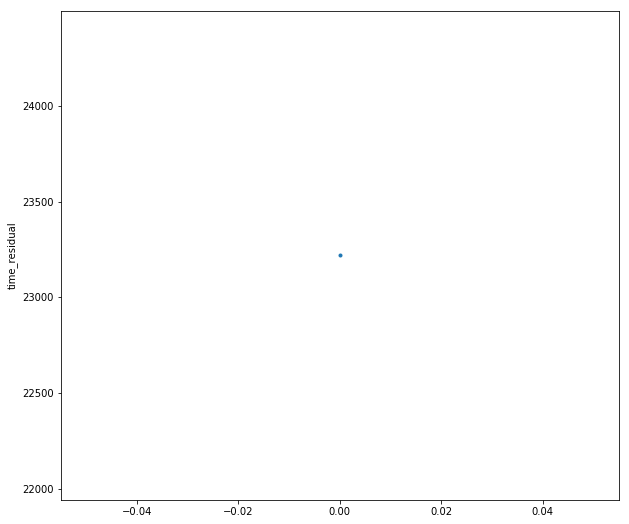

index_p 31
Jump Indices 65 66
1


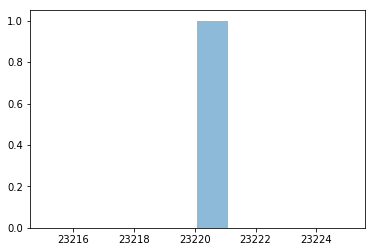

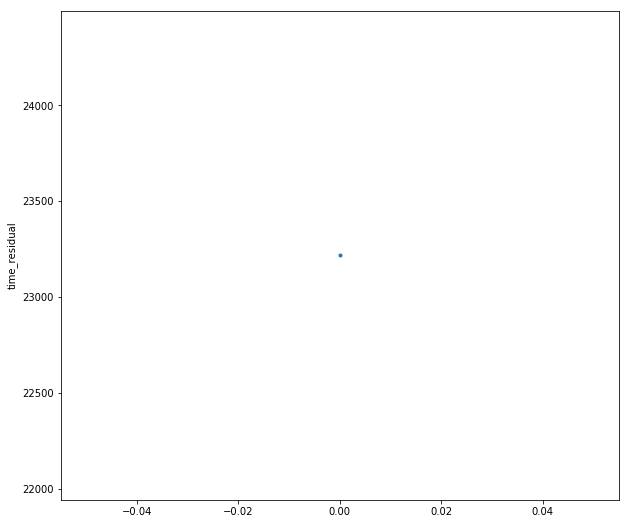

index_p 32
Jump Indices 66 67
1


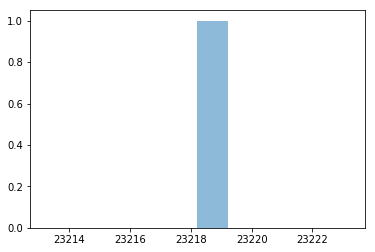

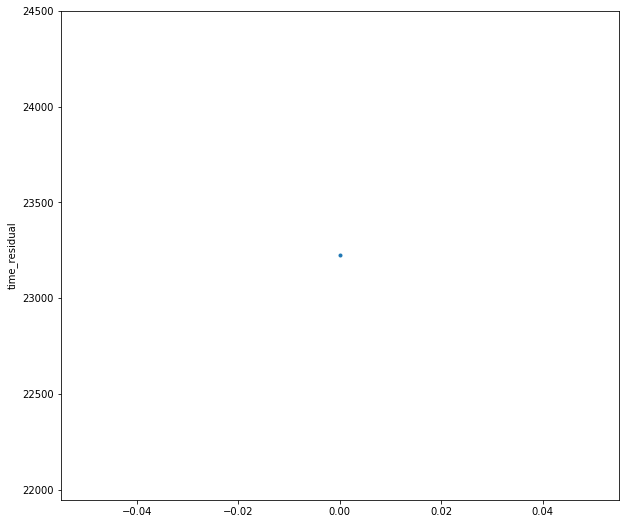

index_p 33
Jump Indices 67 68
1


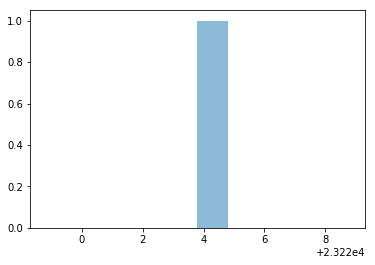

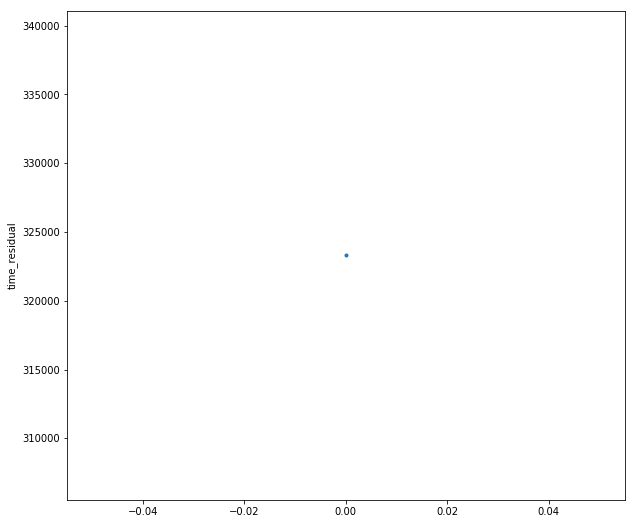

index_p 34
Jump Indices 68 70
2


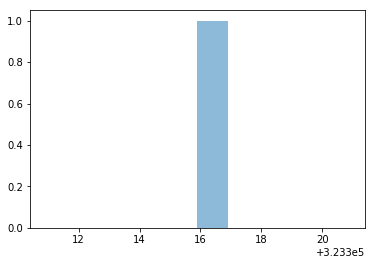

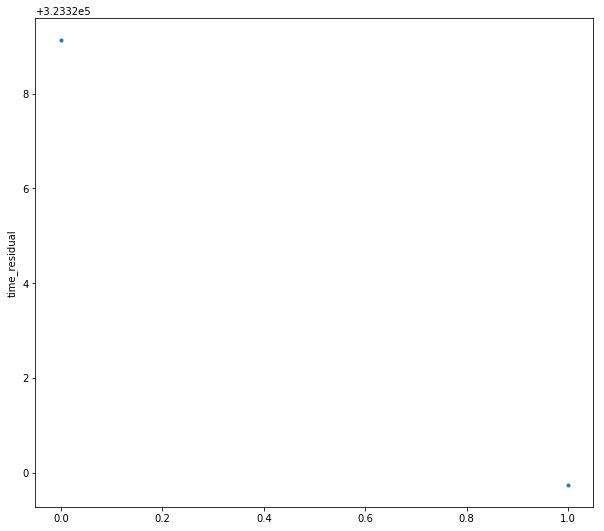

index_p 35
Jump Indices 70 71
1


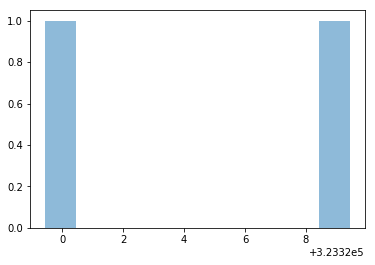

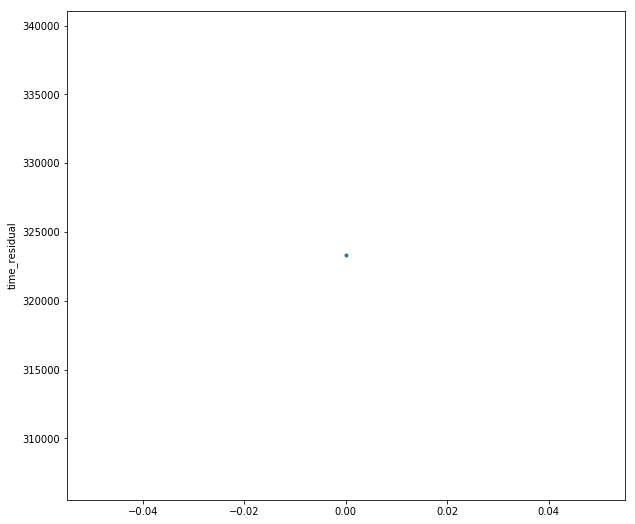

index_p 36
Jump Indices 71 73
2


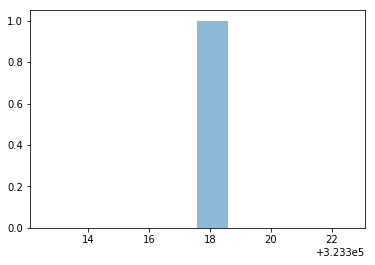

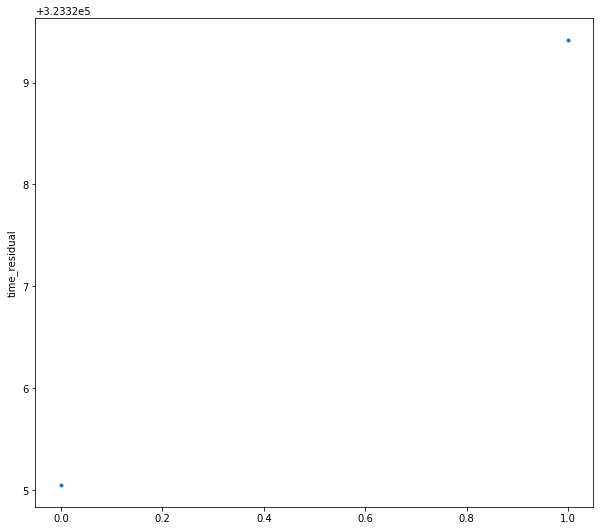

index_p 37
Jump Indices 73 76
3


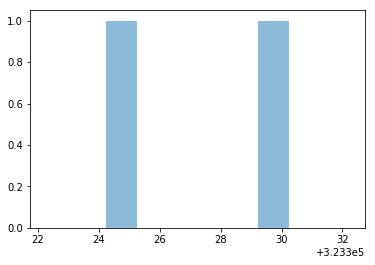

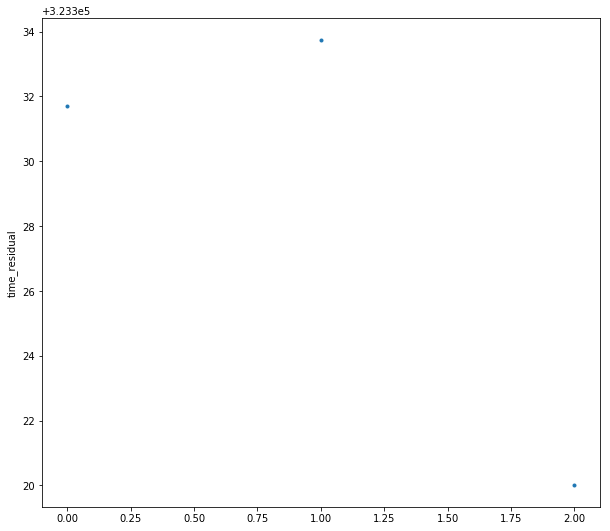

index_p 38
Jump Indices 76 77
1


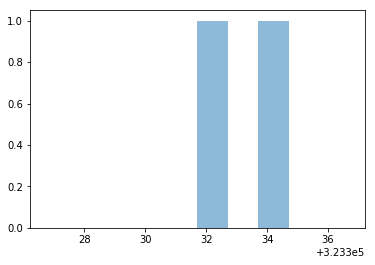

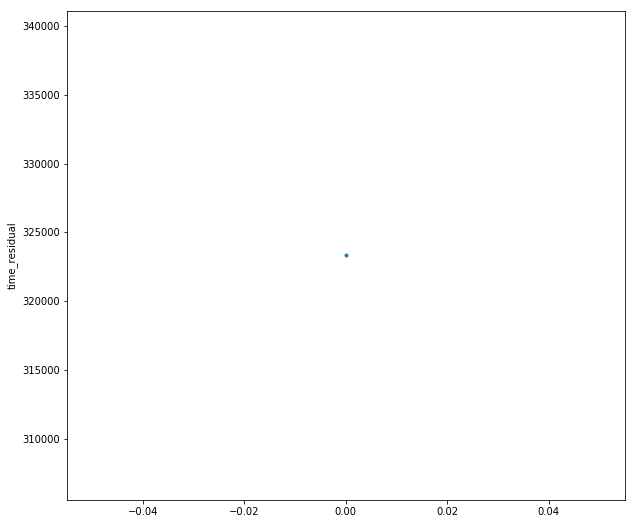

index_p 39
Jump Index size = 40 82
[77]
Jump Indices 77 82


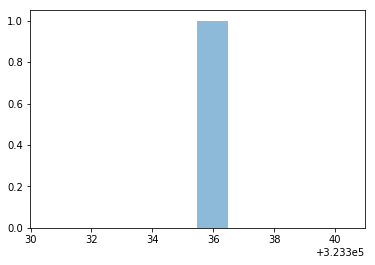

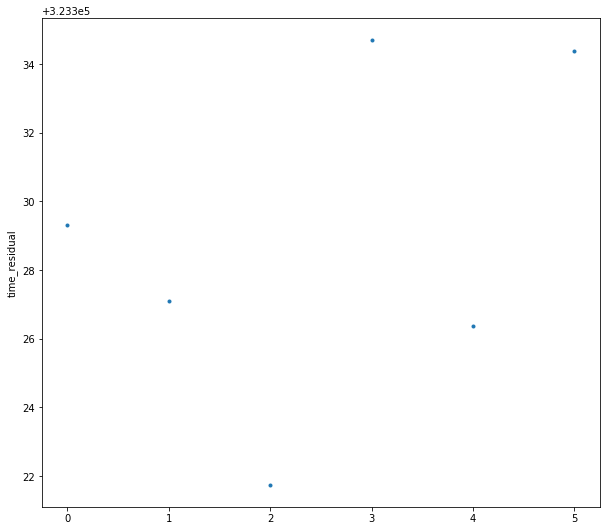

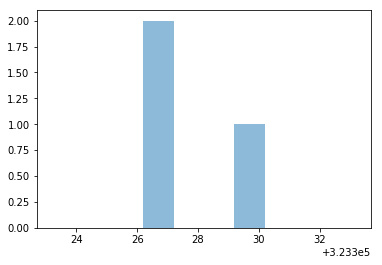

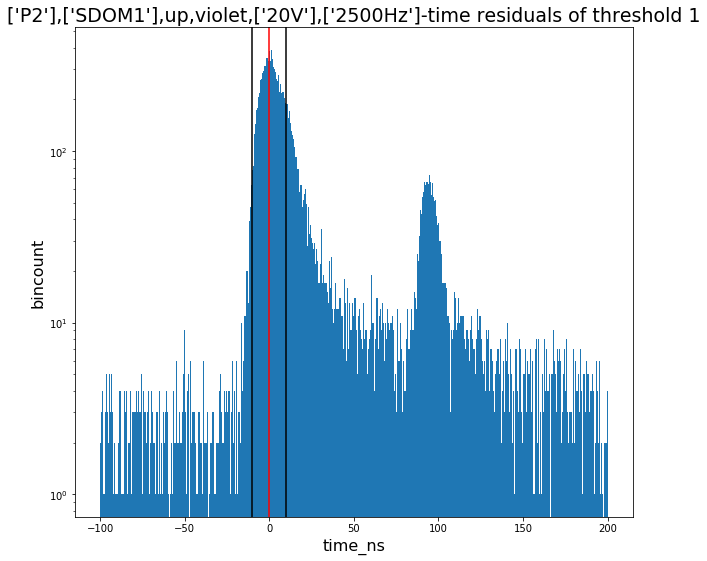

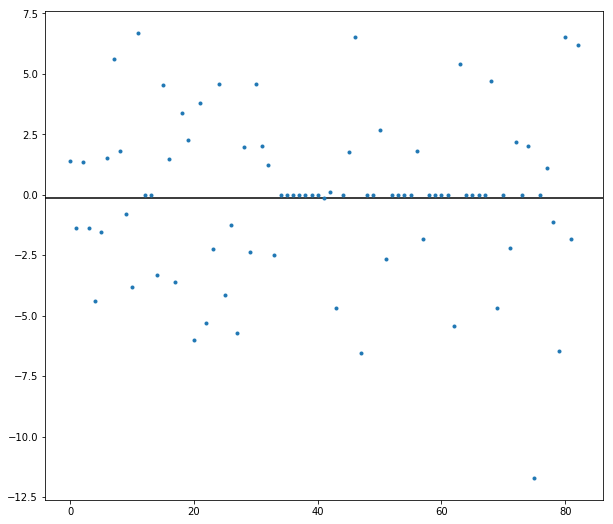

In [88]:
t_res_all1,  num_events1, noise_events1 = r1.res(gaus_peak, 250, 5)

In [238]:
sDOM1_POSEIDON_run = run.run()
run_time, err_run_time, dead_time_uncert = sDOM1_POSEIDON_run.run_time(atstamp, p_jumps, dt_mean, a.f_0,
                                                    a.f_1-a.r_1,
                                                    a.f_2-a.r_2,
                                                    a.f_3-a.r_3)

print('dead_time_uncert: ', dead_time_uncert, '%')

time removed(small jumps) -  62809.62842082977
timestamp of the last event -  60866796569.58253
eliminating high jumps and summing -  59314859136.88932
run time -  59314796327.2609
dead_time_uncert:  0.42392268563089913 %


# -----------------------------------------------------------
# sDOM1 SANTACLAUS


In [36]:
filename = '20181205_092552_UTC_SDOM1_FLASH_SANTACLAUS_P2_violet_both_5000Hz_20V_60s_18339135919.hld_up.hdf5'
a = clean.clean(filename)

percentage of high jumps in the file - 0.4130134600662307


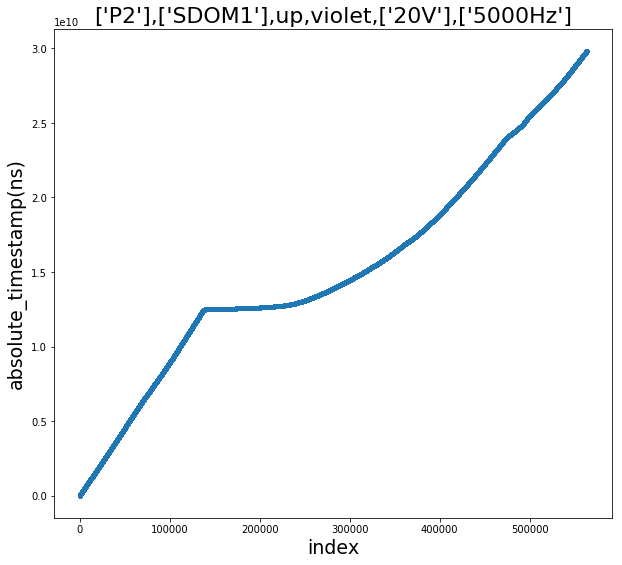

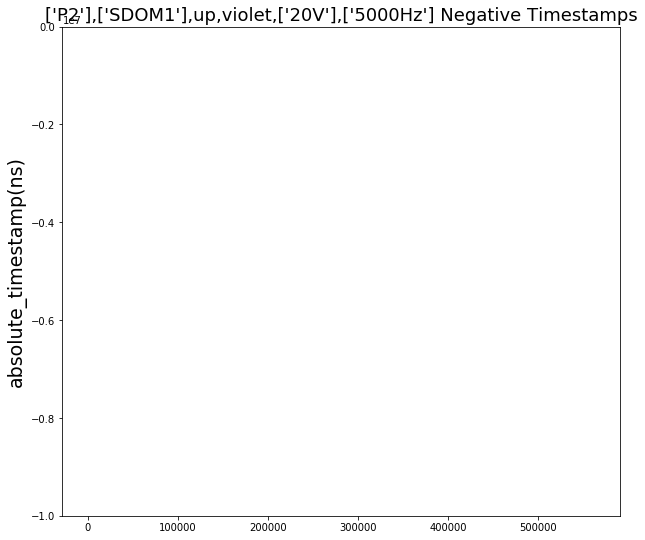

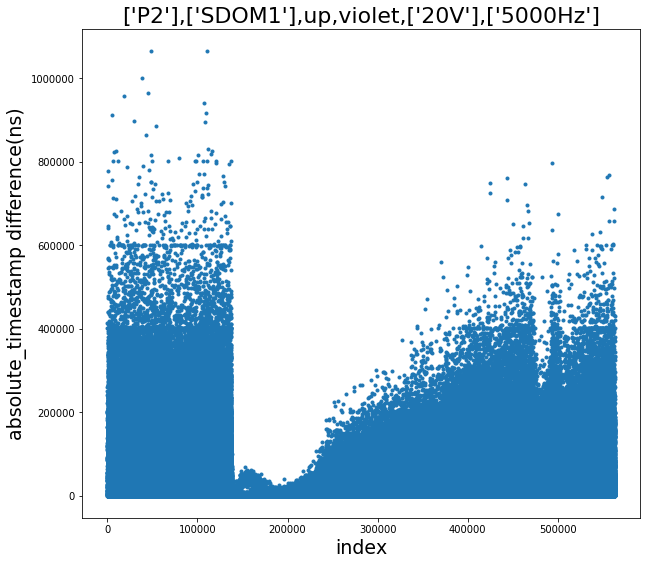

[]


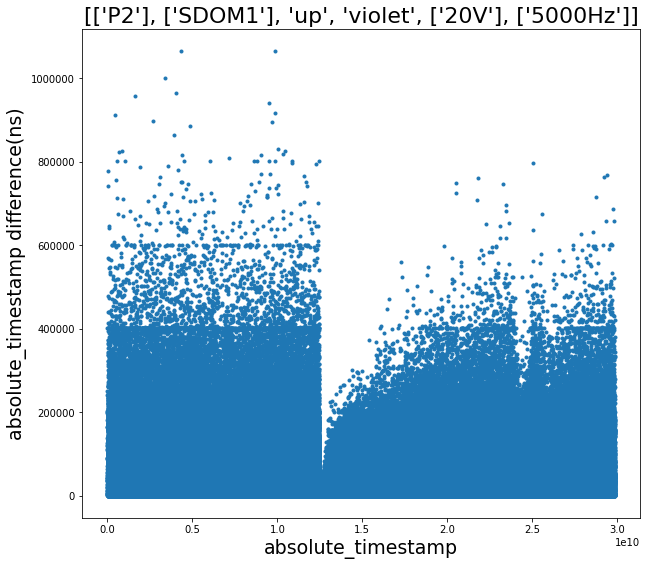

0.17161718519361618


In [38]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = a.P_S_used()

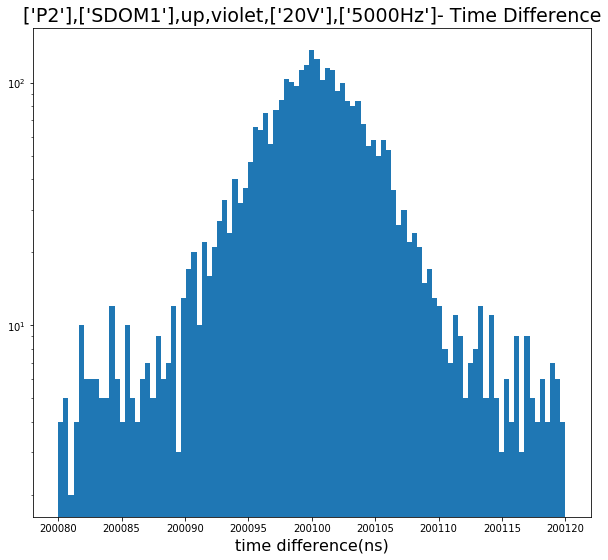

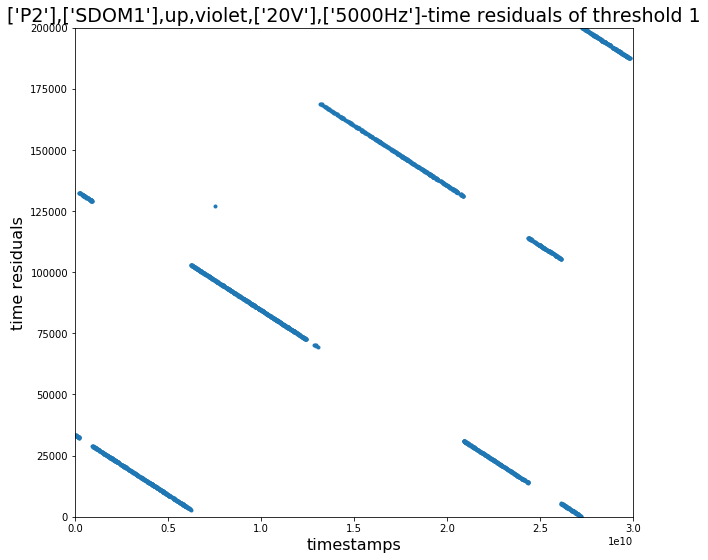

In [48]:
r1 = residual.residual(abs_elim_3,rising_1_elim_3,200080, 200120, 100, 
                                200095, 200105,
             0.0e10,3e10,0, 200000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

In [47]:
#gaus_peak = 400100.7156722718
gaus_peak = r1.minimizer(1.8e10, 2.0e10)

200100.34606112557


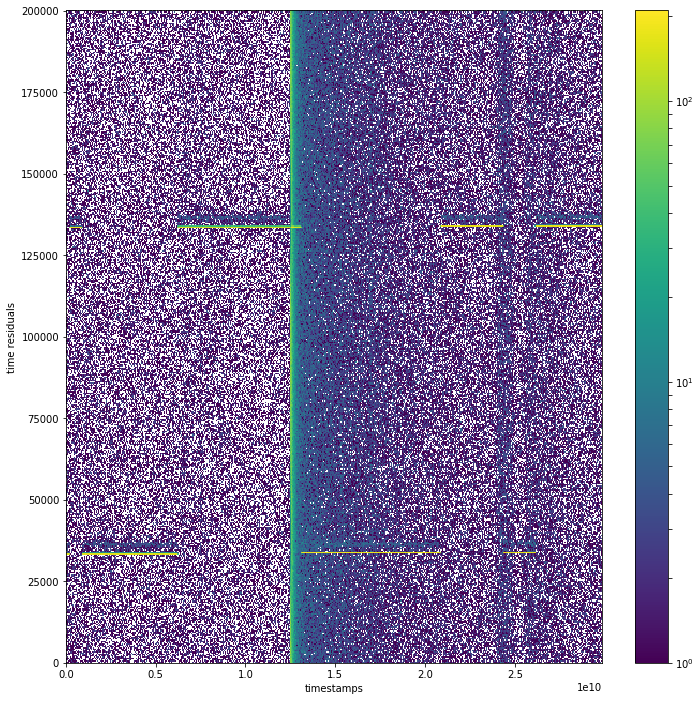

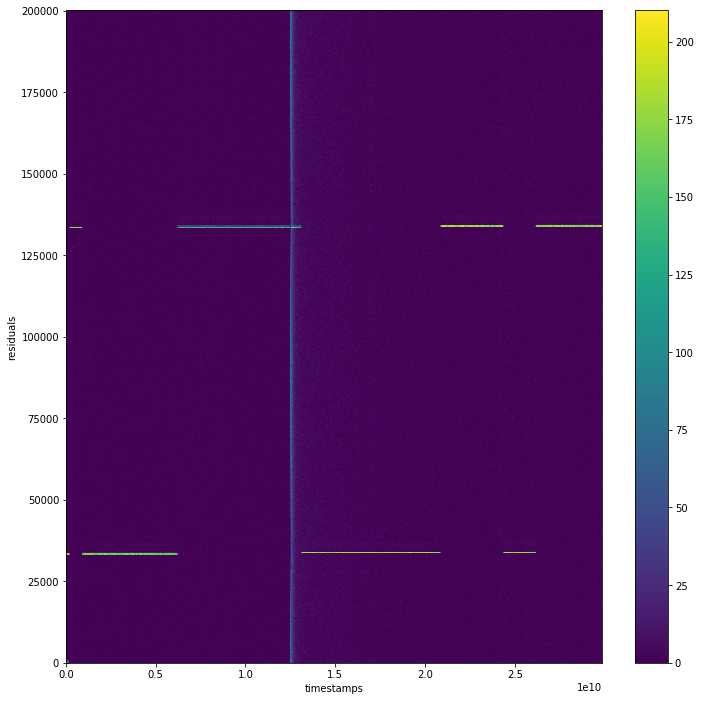

In [49]:
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r1.HIST2D(500, gaus_peak, SDOM_num)

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


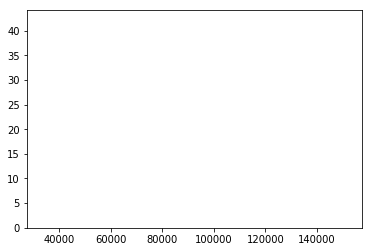

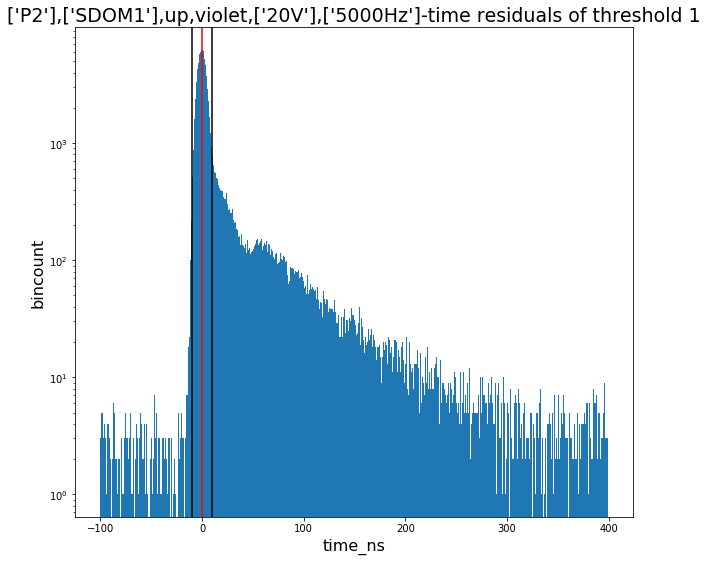

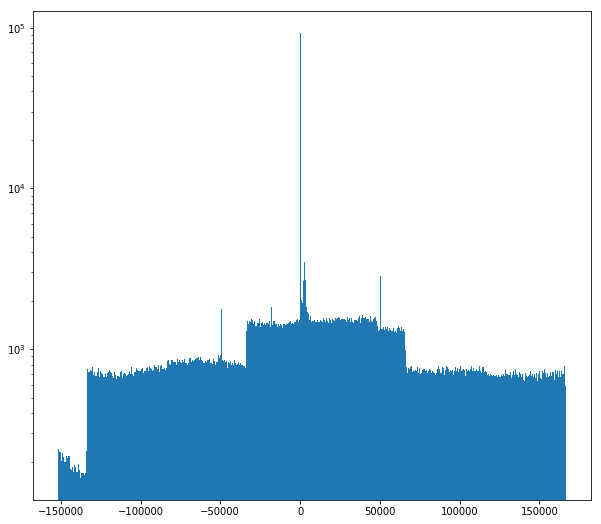

In [51]:
t_res_all1,num_events1, noise_events1 = r1.calc_res(BinsHist, 10, 2, 1)

# -----------------------------------------------------------
# sDOM1 MINOS

In [236]:
filename = '20190313_165313_UTC_SDOM1_FLASH_MINOS1_P2_violet_both_2500Hz_20V_30s_19072165323.hld_up.hdf5'
a = clean.clean(filename)

percentage of high jumps in the file - 3.198600064967045


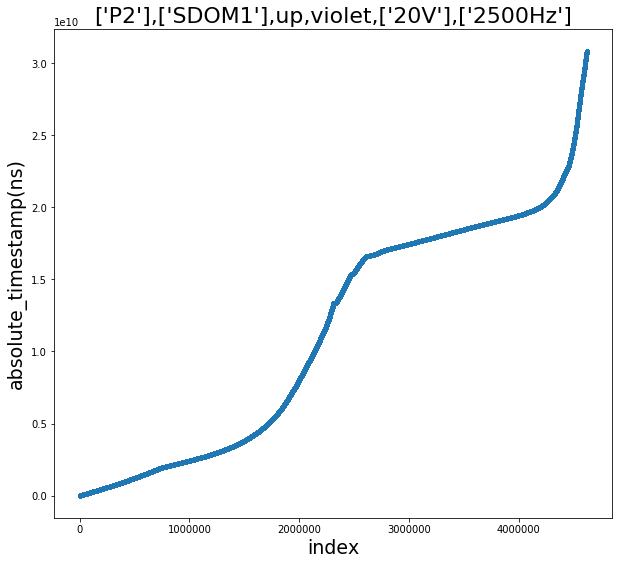

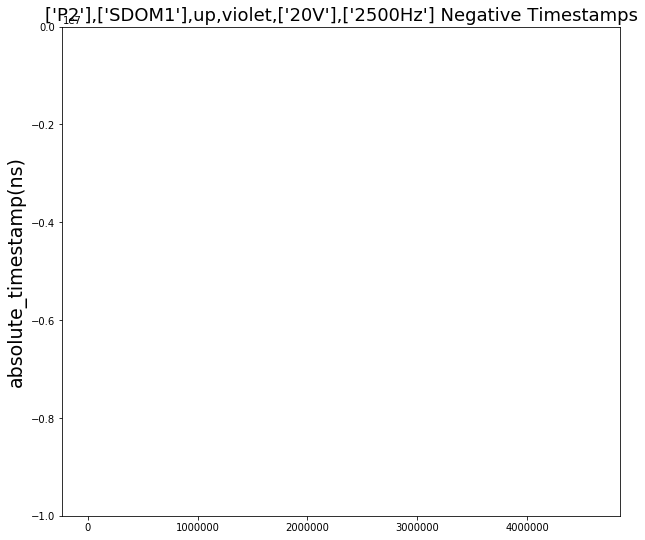

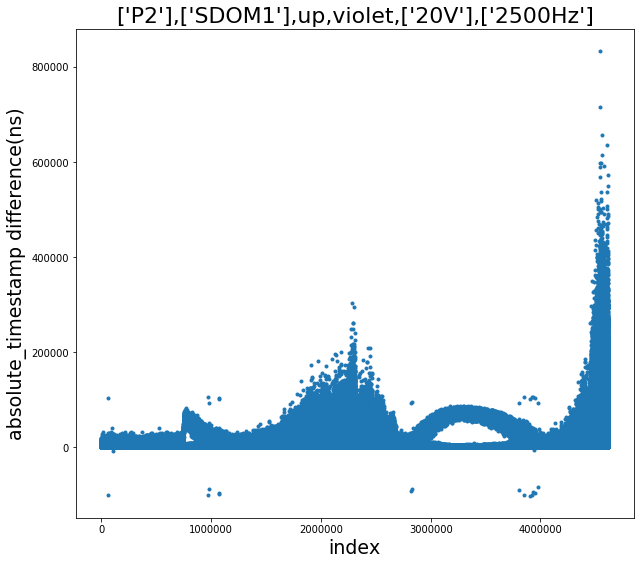

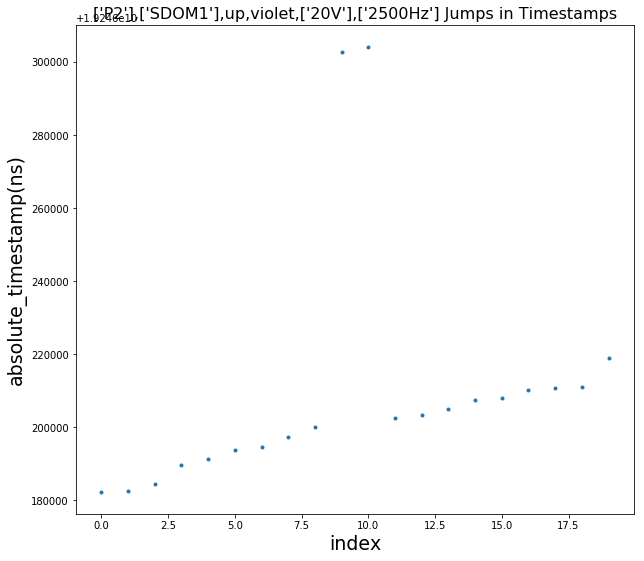

[  59860.   59861.  110122.  110123.  110124.  110125.  110126.  974401.
  974402.  974403.  977828.  977829.  977830.  977831. 1068611. 1068612.
 1068667. 1068668. 1068669. 1068670. 1068671. 2820070. 2820071. 2820072.
 2820073. 2820074. 2820075. 2831908. 2831909. 2831910. 2831911. 2831912.
 2831913. 3804930. 3804931. 3804932. 3804933. 3804934. 3804935. 3804936.
 3847610. 3902946. 3902947. 3924335. 3924336. 3924337. 3929370. 3929371.
 3929372. 3943592. 3943593. 3943594. 3943595. 3943596. 3943597. 3943598.
 3943599. 3943600. 3953378. 3953379. 3953380. 3980811. 3980812. 3980813.
 3980814. 3980815.]


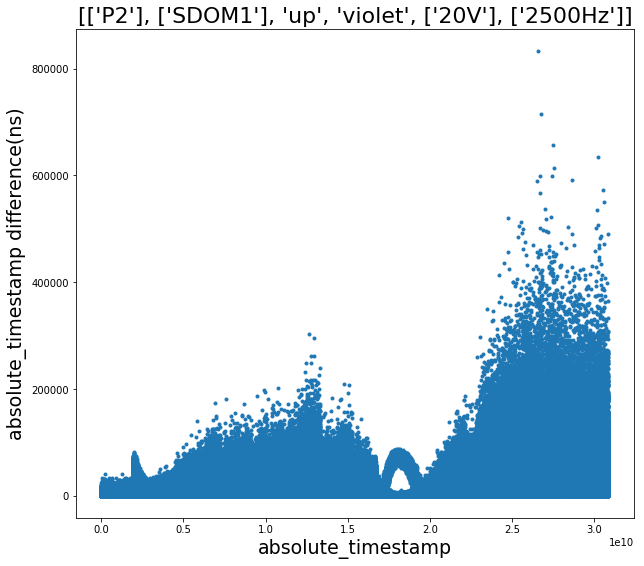

0.14448341757919161


In [237]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = a.P_S_used()

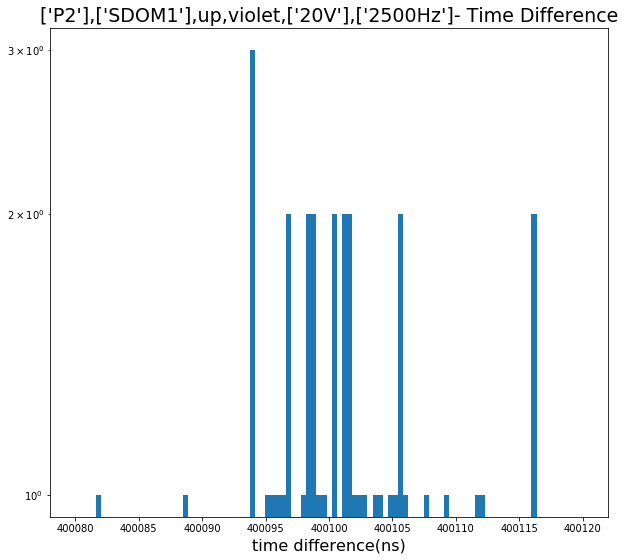

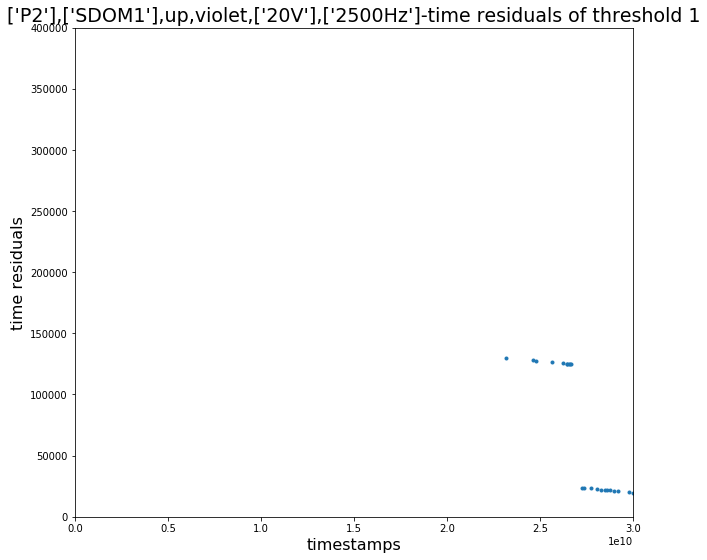

In [238]:
r1 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             0.0e10,3e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

400100.70567003044


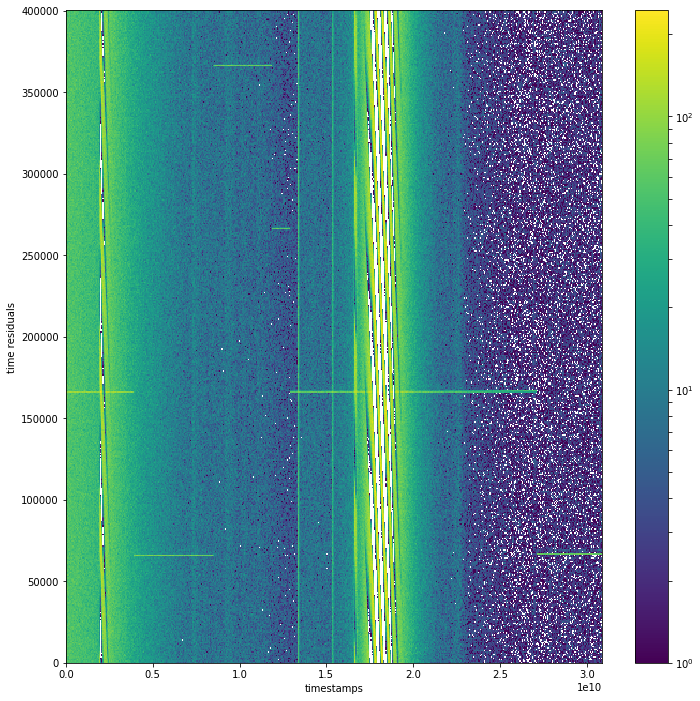

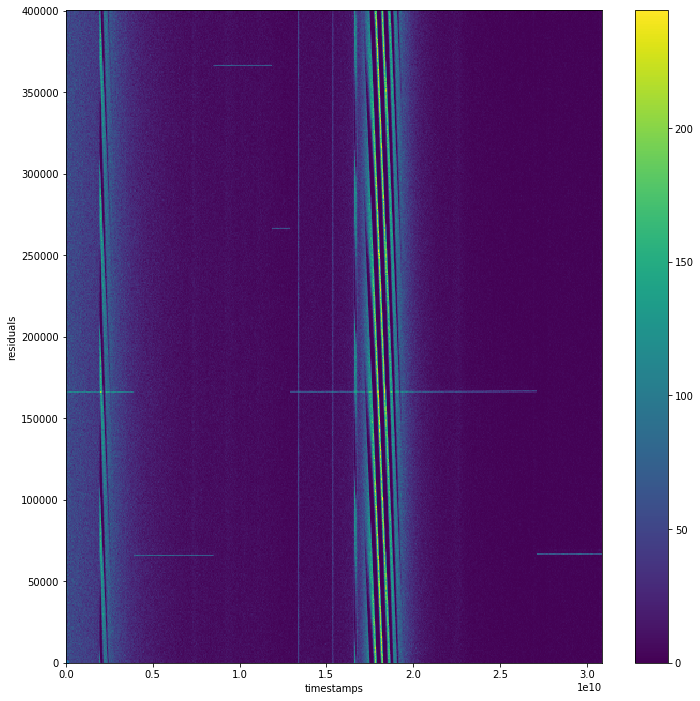

In [239]:
gaus_peak = r1.GetGausPeak([.45e10,.8e10])#400100.7156722718
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r1.HIST2D(500, gaus_peak, SDOM_num)

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


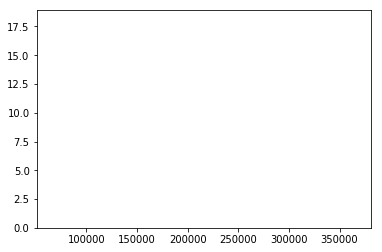

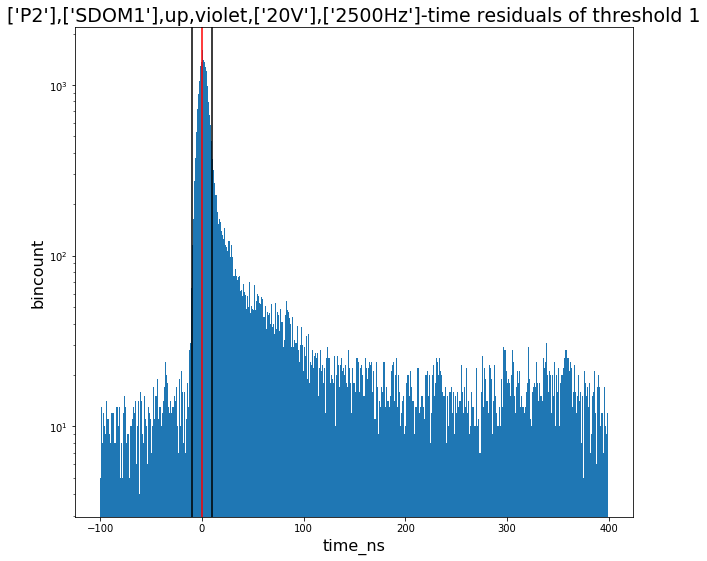

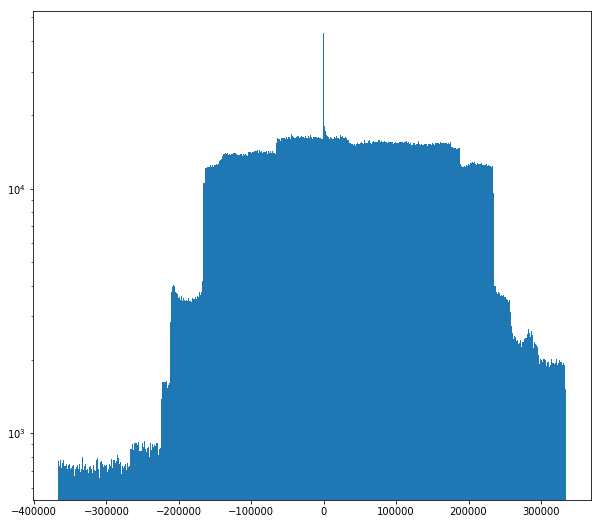

In [156]:
t_res_all1,num_events1, noise_events1 = r1.calc_res(BinsHist, 10, 2, 1)

0.8286509010010416


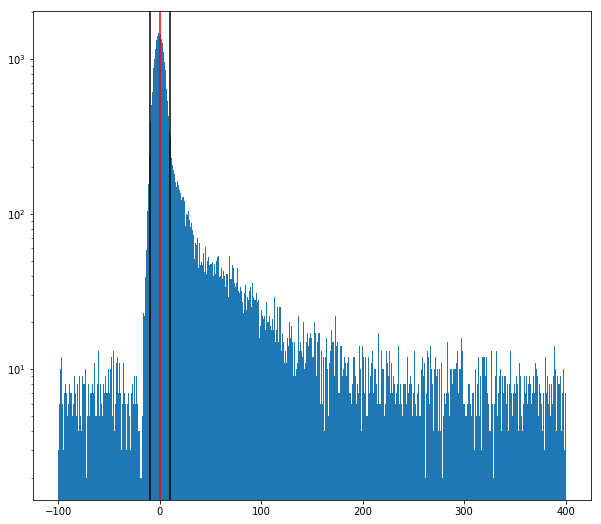

In [272]:
## Plotting POCAM residuals by eye

time_window1 = (abs_elim_3<.4e10)
time_window2 = (abs_elim_3>.4e10) & (abs_elim_3<.8e10)
time_window3 = (abs_elim_3>.85e10) & (abs_elim_3<1.15e10)
time_window4 = (abs_elim_3>1.3e10) & (abs_elim_3<1.6e10)
time_window5 = (abs_elim_3>2.0e10) & (abs_elim_3<2.7e10)
time_window6 = (abs_elim_3>2.7e10)

my_data_all = np.array([])
weights_all = np.array([])

my_slice = (abs_elim_3+rising_1_elim_3)[time_window1] 
weights = r1.weights[time_window1]
my_res = (my_slice%gaus_peak) - 166300+3
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window2]
weights = r1.weights[time_window2]
my_res = (my_slice%gaus_peak) - 66303
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window3] 
weights = r1.weights[time_window3]
my_res = (my_slice%gaus_peak) - 366411.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window4]
weights = r1.weights[time_window4]
my_res = (my_slice%gaus_peak) - 166420
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window5]
weights = r1.weights[time_window5]
my_res = (my_slice%gaus_peak) - 166437.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window6]
weights = r1.weights[time_window6]
my_res = (my_slice%gaus_peak) - 66450+1.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

fig, ax = plt.subplots(figsize=(10,9))
n,bins,patches = ax.hist(my_data_all,bins=500,log=True, weights=weights_all, range=(-100,400))
ax.axvline(color='r')
ax.axvline(-10,color='k')
ax.axvline(10,color='k')

# save to csv
path = 'Data/MINOS1/violet/Measured_arrival_times/'
filename = "['P2'],['SDOM1'],up,violet,['20V'],['2500Hz'].csv"
with open(path+filename, 'w') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(bins[:-1])
    writer.writerow(n)
csvfile.close()

time_used = (.8 + .3 + .3 + .7 + (abs_elim_3[-1]/1e10-2.7))/3
print(time_used)



In [14]:
sDOM1_MINOS_run = run.run()
run_time, err_run_time,dead_time_uncert = sDOM1_MINOS_run.run_time(atstamp, p_jumps, dt_mean, a.f_0,
                                                    a.f_1-a.r_1,
                                                    a.f_2-a.r_2,
                                                    a.f_3-a.r_3)

print('dead_time_uncert: ', err_run_time/run_time*100, '%')

time removed(small jumps) -  158479.79525330663
timestamp of the last event -  30859527030.03125
eliminating high jumps and summing -  29633068714.460735
run time -  29632910234.66548
dead_time_uncert:  0.5537257657080588 %


# -----------------------------------------------------------
# sDOM1 HERA

In [144]:
filename = '20190607_162915_UTC_SDOM1_FLASH_HERA1_P2_violet_both_2500Hz_20V_60s_19158162925.hld_up.hdf5'
a = clean.clean(filename)

percentage of high jumps in the file - 2.249443337350057


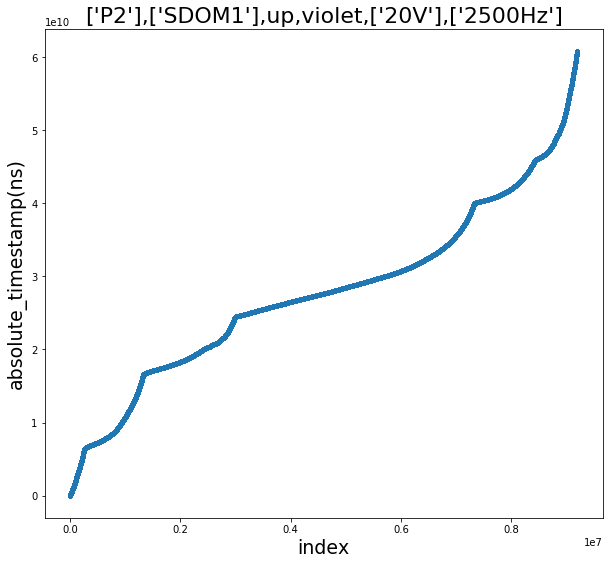

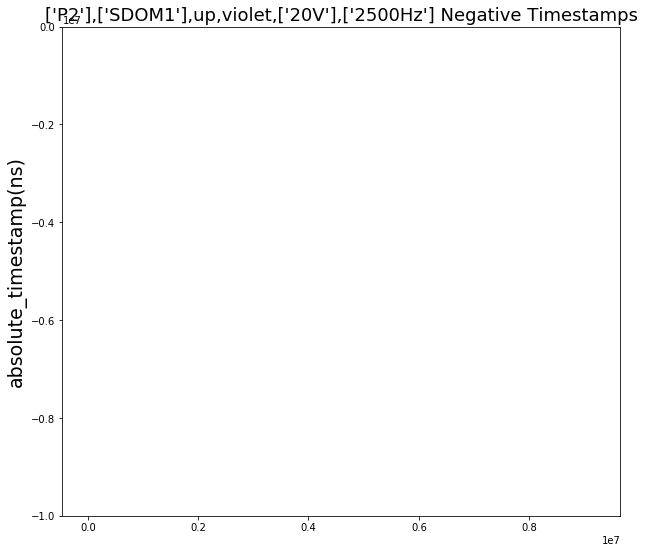

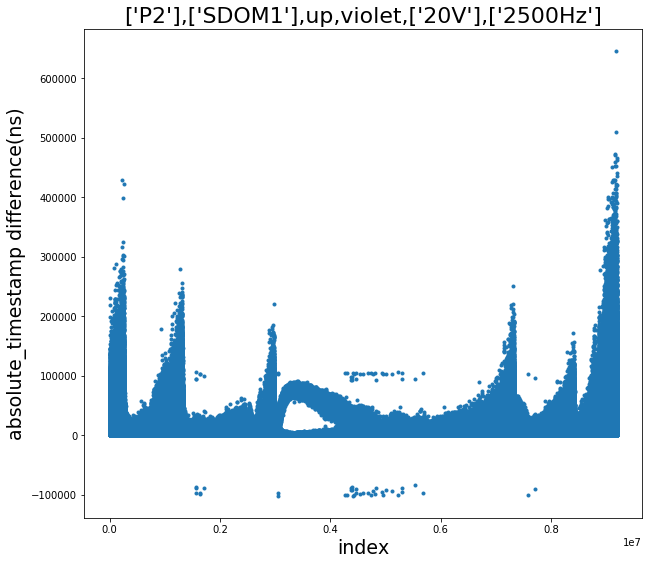

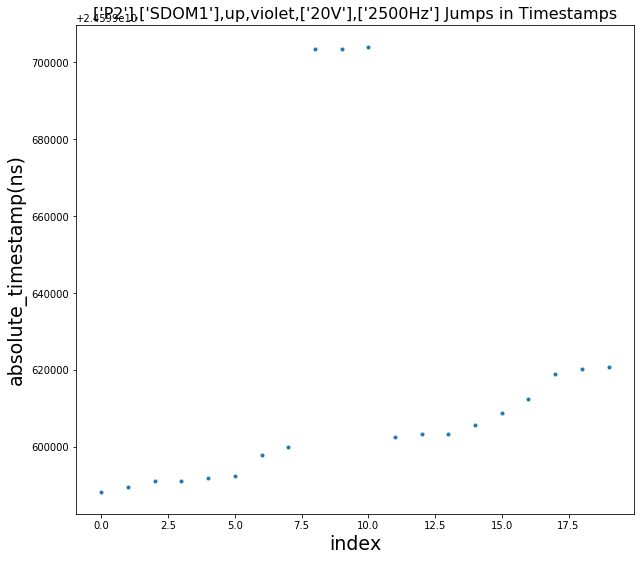

[1568213. 1568214. 1568215. 1570086. 1570087. 1570088. 1570089. 1570090.
 1572997. 1641281. 1641282. 1641283. 1641338. 1641339. 1707520. 3046263.
 3054054. 3054055. 3054056. 4274089. 4274090. 4274091. 4274092. 4274093.
 4309073. 4309074. 4367685. 4367686. 4367687. 4367688. 4367689. 4375244.
 4375245. 4375246. 4375247. 4375248. 4375249. 4375250. 4375251. 4375252.
 4375253. 4390836. 4390837. 4390838. 4390839. 4390840. 4390841. 4402867.
 4402868. 4402869. 4402870. 4402871. 4406721. 4434094. 4434095. 4474239.
 4474240. 4474241. 4474242. 4474296. 4474297. 4474298. 4474299. 4539956.
 4539957. 4602409. 4602410. 4689428. 4689429. 4744120. 4744121. 4744122.
 4780999. 4781000. 4781001. 4807006. 4821403. 4821404. 4821405. 4934849.
 4960991. 4960992. 4960993. 4960994. 4960995. 5006415. 5006416. 5006417.
 5123797. 5123798. 5123799. 5219946. 5219947. 5219948. 5294867. 5294868.
 5294869. 5294870. 5298474. 5298475. 5541923. 5541924. 5541925. 5677183.
 5677184. 7588901. 7588902. 7588903. 7588904. 75889

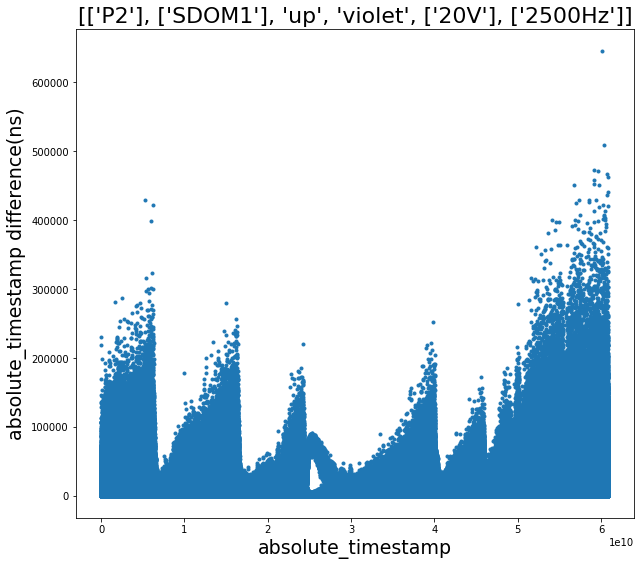

0.13097355155361617


In [145]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = a.P_S_used()

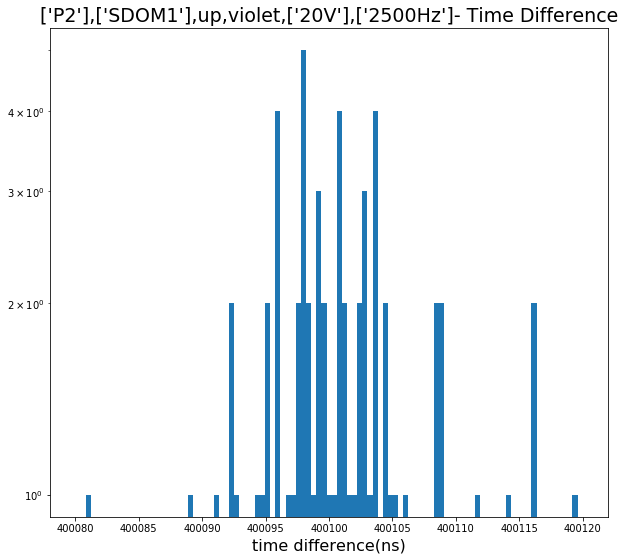

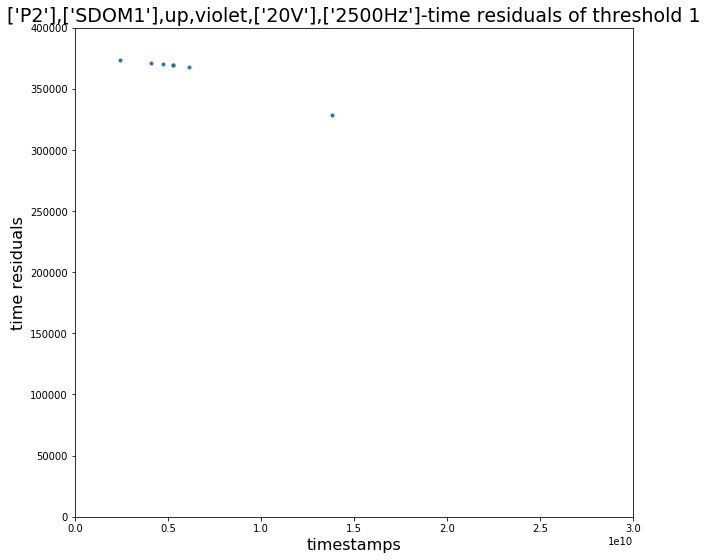

In [146]:
r1 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             0.0e10,3e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

400100.74047396914


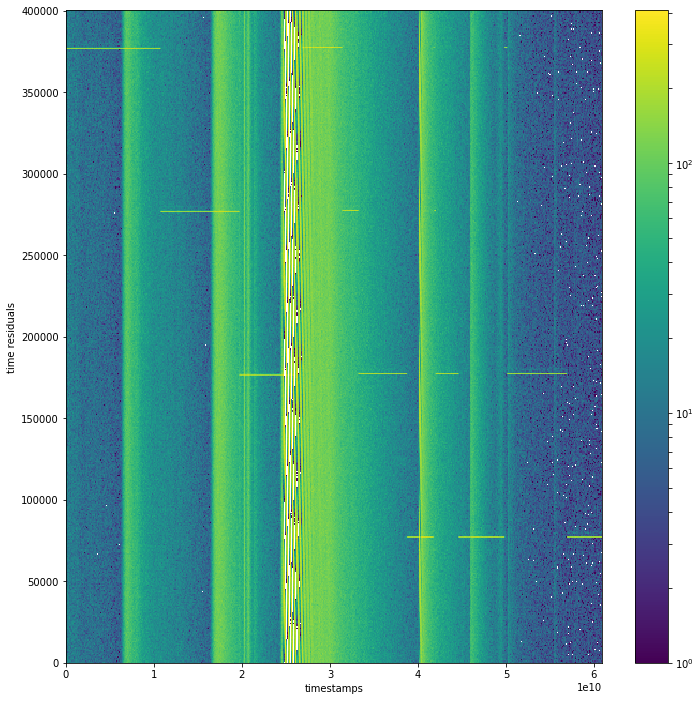

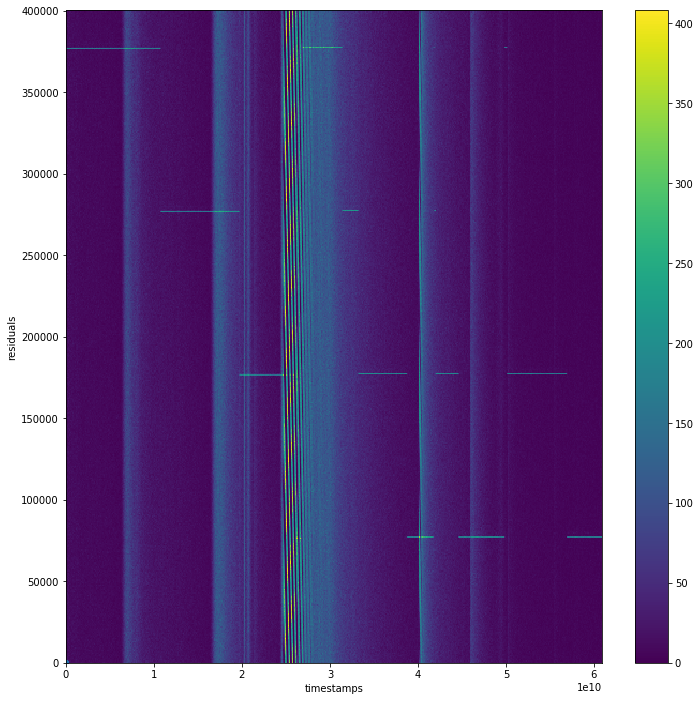

In [148]:
gaus_peak = r1.GetGausPeak([.0e10,1e10])#400100.7156722718
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r1.HIST2D(500, gaus_peak, SDOM_num)

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


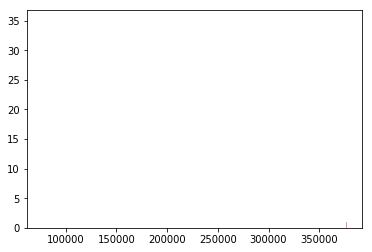

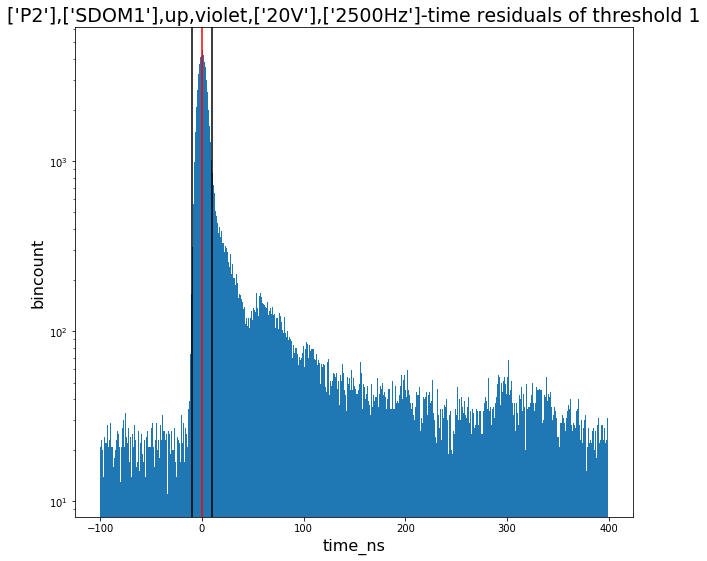

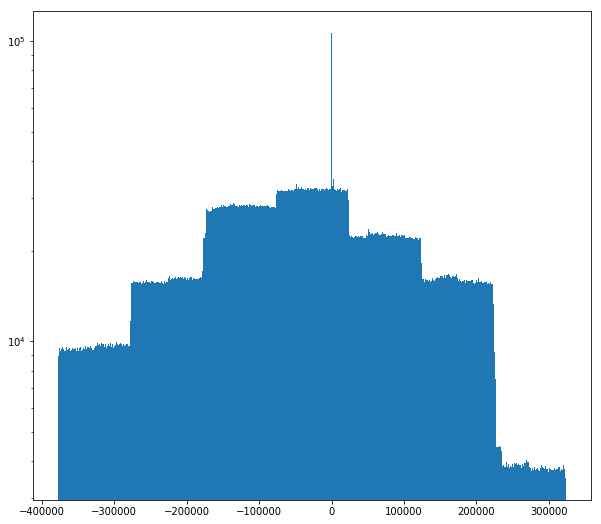

In [149]:
t_res_all1,num_events1, noise_events1 = r1.calc_res(BinsHist, 10, 2, 1)

In [150]:
sDOM1_HERA_run = run.run()
run_time, err_run_time,dead_time_uncert = sDOM1_HERA_run.run_time(atstamp, p_jumps, dt_mean, a.f_0,
                                                    a.f_1-a.r_1,
                                                    a.f_2-a.r_2,
                                                    a.f_3-a.r_3)

print('dead_time_uncert: ', err_run_time/run_time*100, '%')

time removed(small jumps) -  319258.4617385864
timestamp of the last event -  60880606151.67969
eliminating high jumps and summing -  59262417459.039894
run time -  59262098200.578156
dead_time_uncert:  0.3783960654156056 %


# -----------------------------------------------------------
# sDOM5 POSEIDON

In [5]:
filename = '20190426_085600_UTC_SDOM5_FLASH_POSEIDON1_P2_violet_both_2500Hz_20V_60s_19116085610.hld_up.hdf5'
b = clean.clean(filename)

percentage of high jumps in the file - 0.0


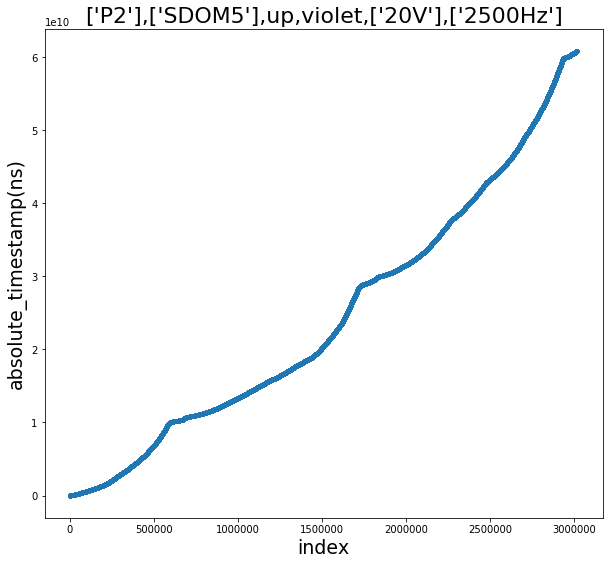

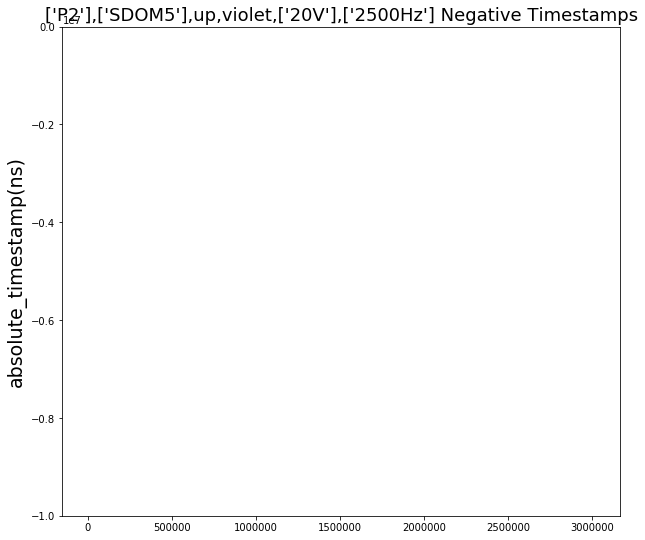

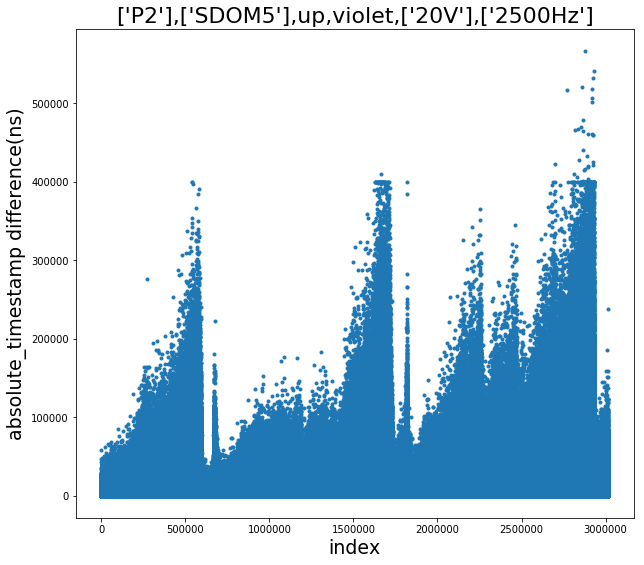

[]


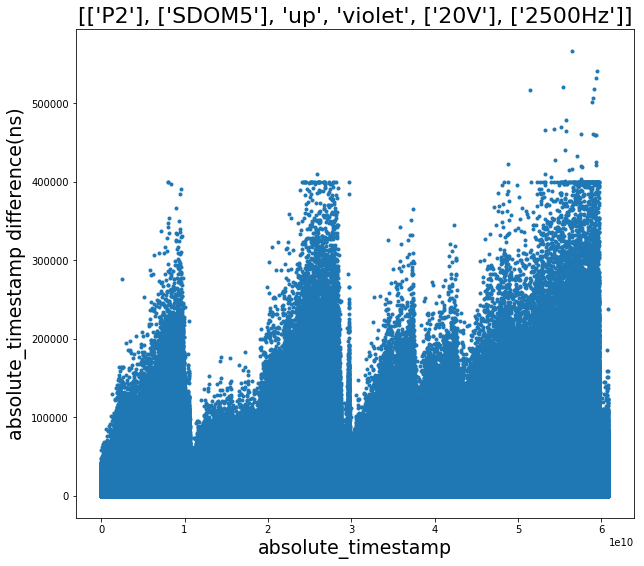

0.4221112954466171


In [6]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = b.P_S_used()

In [9]:
## Testing ToT_3
ToT_3_sDOM5 = falling_3_elim_3 - rising_3_elim_3

#fig, ax = plt.subplots(figsize=(10,9))
#ax.hist(ToT_3,log=True)


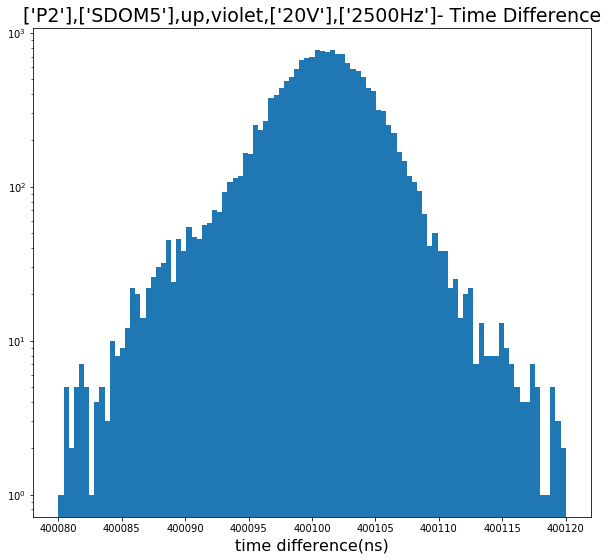

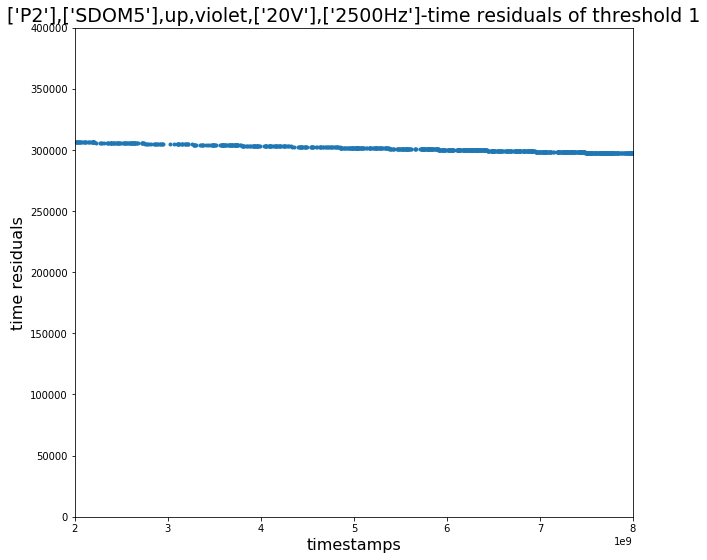

In [305]:
r2 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             0.2e10,.8e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3) 

In [288]:
#gaus_peak = r2.minimizer(2.4e10,2.7e10)
gaus_peak = r2.minimizer(.2e10,.8e10)

400100.7088339038


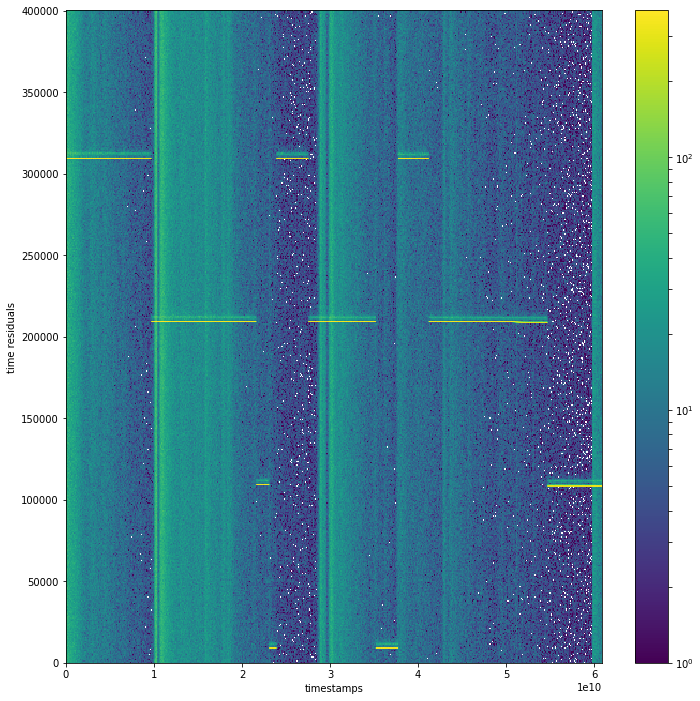

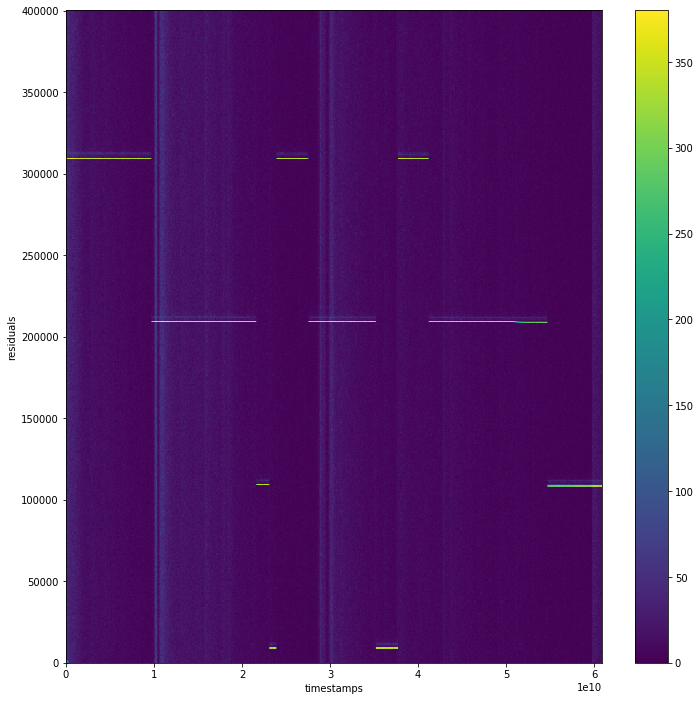

In [306]:
gaus_peak = 400100.7156722718
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r2.HIST2D(500, gaus_peak, SDOM_num)

13317
jump_index [    0.  1461.  1560.  1587.  2459.  2863.  3082.  4506.  5725.  6387.
  7055. 10967.]
jump_index size 12
index_p 0
Jump Indices 0 1462
1462
400100.7088471511


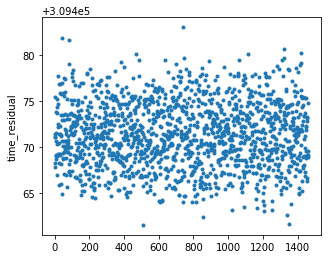

index_p 1
Jump Indices 1462 1561
99
400100.7095098922


/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


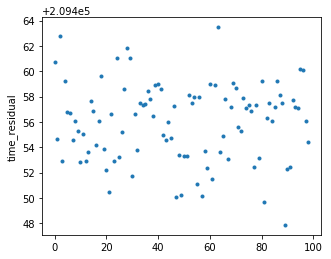

index_p 2
Jump Indices 1561 1588
27
400100.69350592315


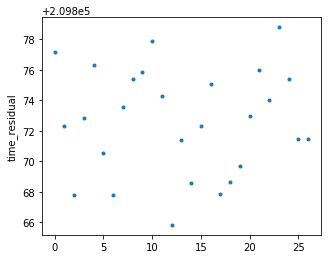

index_p 3
Jump Indices 1588 2460
872
400100.7090920327


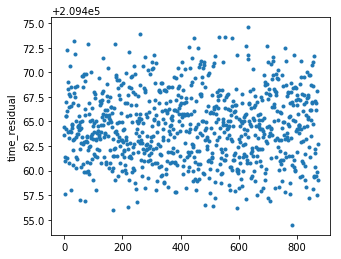

index_p 4
Jump Indices 2460 2864
404
400100.7090275222


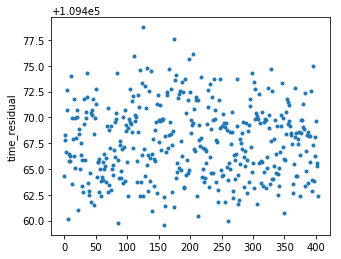

index_p 5
Jump Indices 2864 3083
219
400100.7096469792


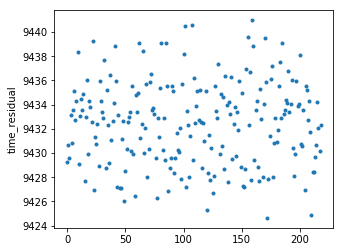

index_p 6
Jump Indices 3083 4507
1424
400100.7092603079


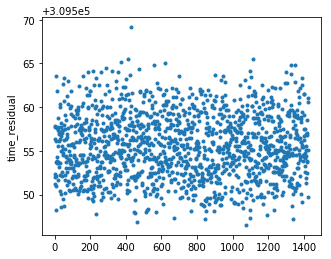

index_p 7
Jump Indices 4507 5726
1219
400100.7093419019


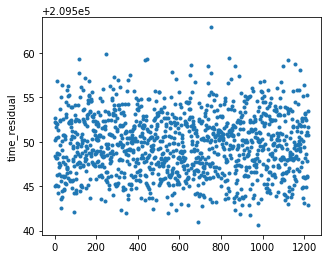

index_p 8
Jump Indices 5726 6388
662
400100.7096670973


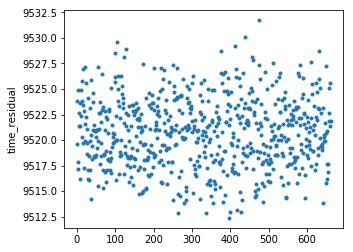

index_p 9
Jump Indices 6388 7056
668
400100.70950942347


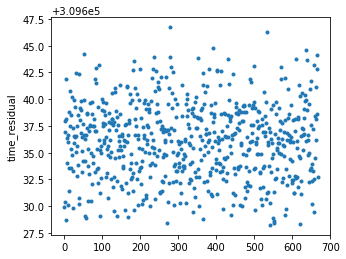

index_p 10
Jump Indices 7056 10968
3912
400100.709774624


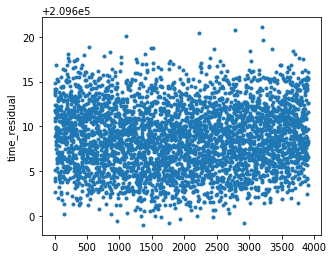

index_p 11
Jump Index size = 12 13316
[10968]
Jump Indices 10968 13316
400100.71000849066


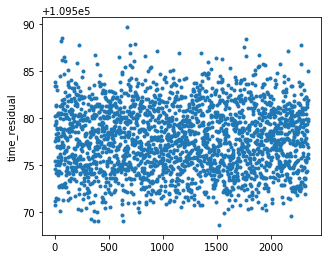

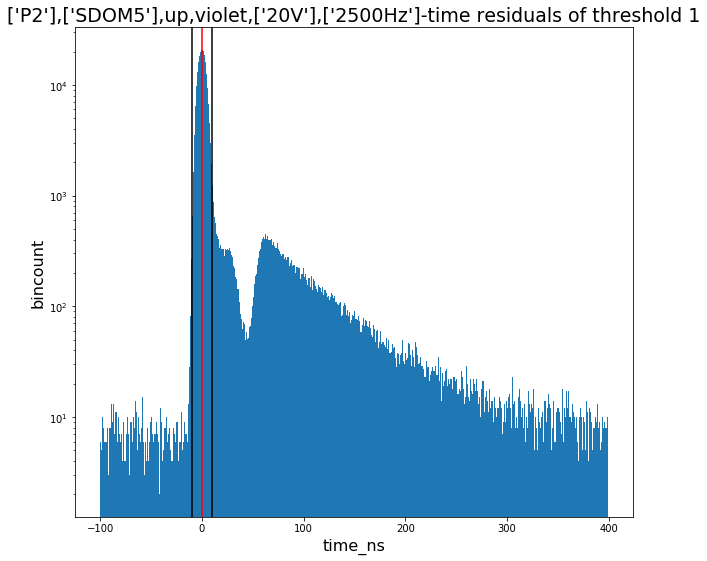

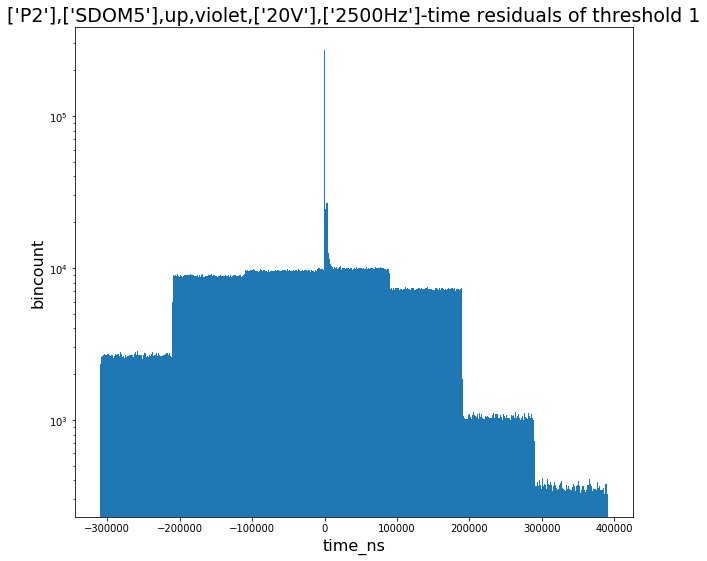

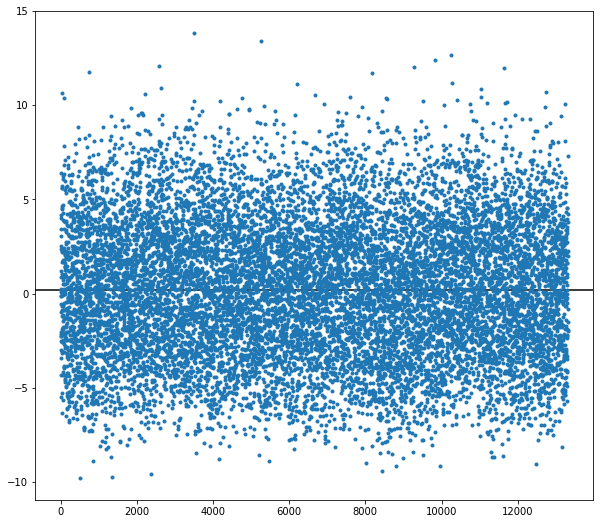

In [298]:
t_res_all2,  num_events2, noise_events2 = r2.res(gaus_peak, 500, 5)

In [182]:
sDOM5_POSEIDON_run = run.run()
run_time, err_run_time = sDOM5_POSEIDON_run.run_time(atstamp, p_jumps, dt_mean, b.f_0,
                                                    b.f_1-b.r_1,
                                                    b.f_2-b.r_2,
                                                    b.f_3-b.r_3)

print('dead_time_uncert: ', err_run_time/run_time*100, '%')

timestamp of the last event -  60866388693.4502
eliminating high jumps and summing -  60865830476.49317
run time -  60865830476.49317
dead_time_uncert:  0.0 \%


# -----------------------------------------------------------
# sDOM5 SANTACLAUS

In [52]:
filename = '20181205_092552_UTC_SDOM5_FLASH_SANTACLAUS_P2_violet_both_5000Hz_20V_60s_18339135919.hld_up.hdf5'
b = clean.clean(filename)

percentage of high jumps in the file - 0.0


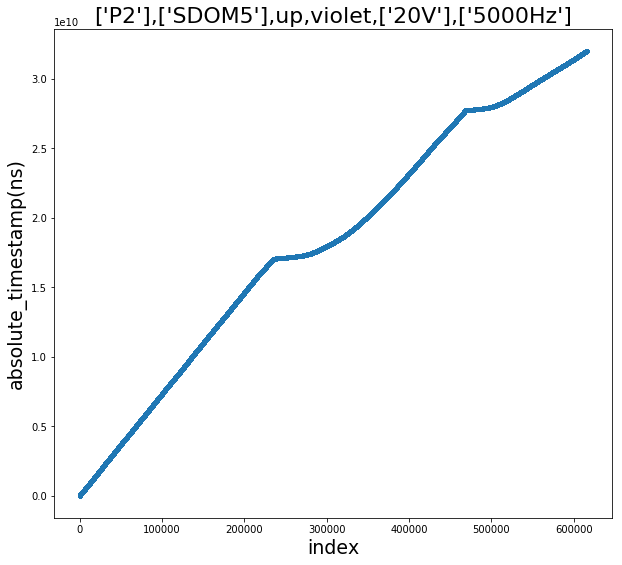

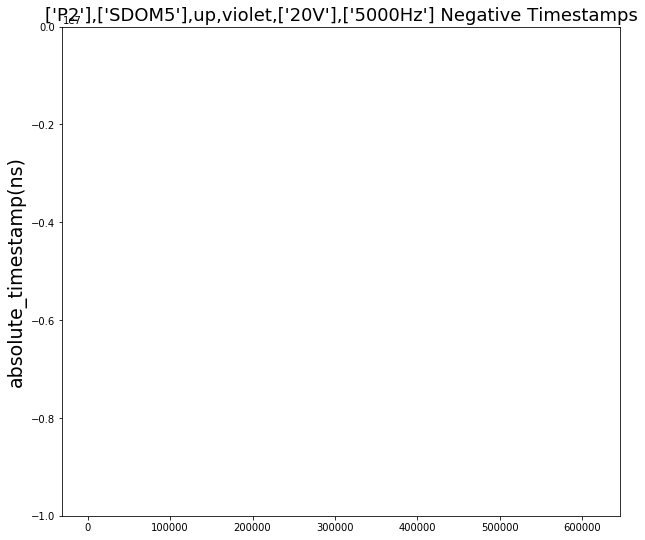

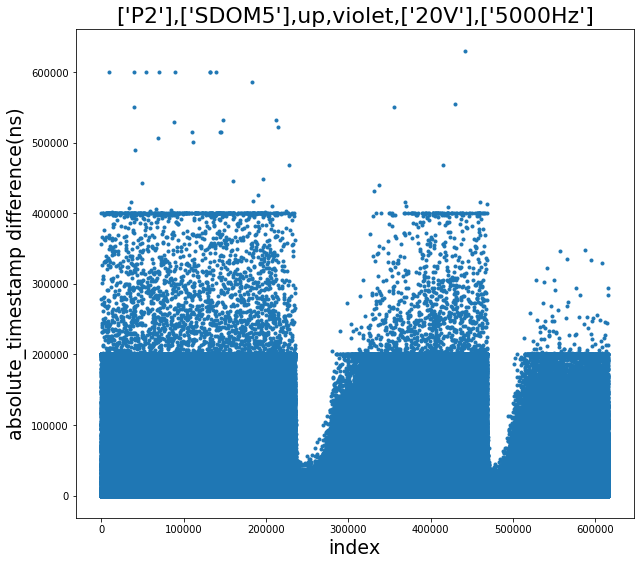

[]


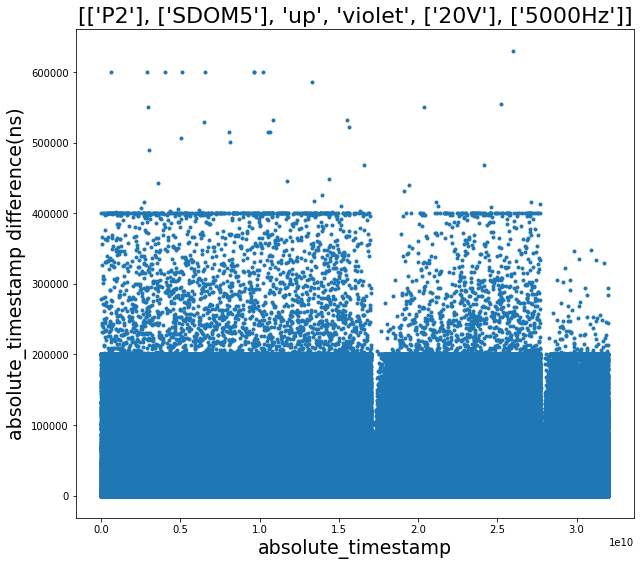

1.6292727992609213


In [53]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = b.P_S_used()

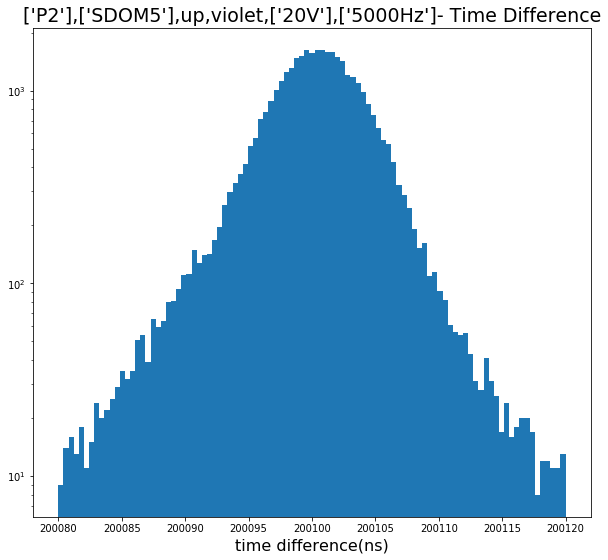

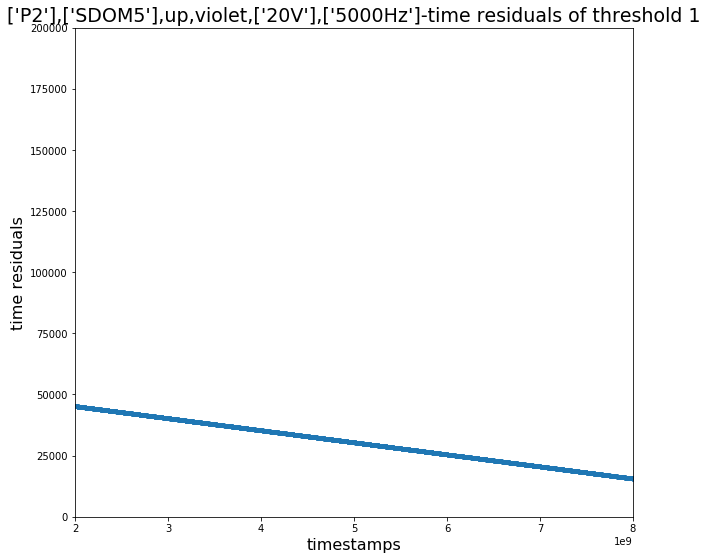

In [54]:
r2 = residual.residual(abs_elim_3,rising_1_elim_3,200080, 200120, 100, 
                                200095, 200105,
             0.2e10,.8e10,0, 200000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

29607
jump_index [    0.  8772. 11864. 12771. 13745. 14180. 16520. 17152. 22198. 23857.
 24891. 24892. 25655.]
jump_index size 13
index_p 0
Jump Indices 0 8773
8773
200100.3434158286


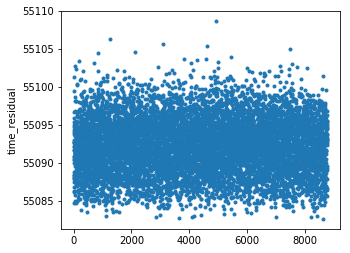

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


index_p 1
Jump Indices 8773 11865
3092
200100.34332879315


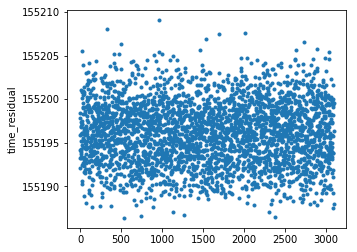

index_p 2
Jump Indices 11865 12772
907
200100.3433273591


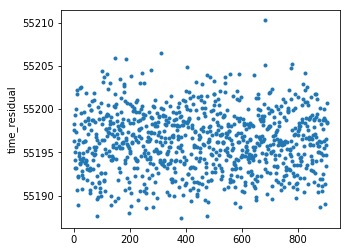

index_p 3
Jump Indices 12772 13746
974
200100.34342829423


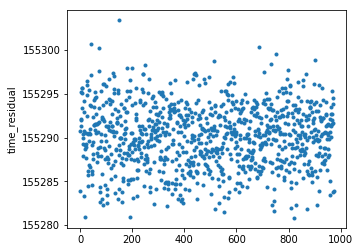

index_p 4
Jump Indices 13746 14181
435
200100.34361150477


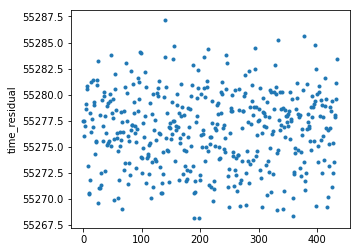

index_p 5
Jump Indices 14181 16521
2340
200100.35546842744


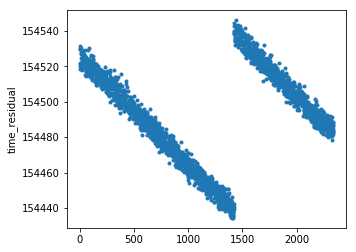

index_p 6
Jump Indices 16521 17153
632
200100.34336718888


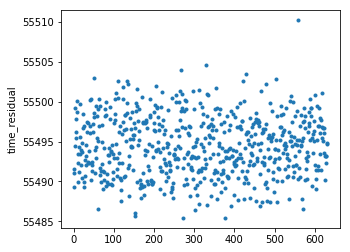

index_p 7
Jump Indices 17153 22199
5046
200100.3433222038


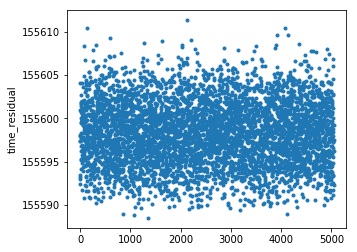

index_p 8
Jump Indices 22199 23858
1659
200100.34329053716


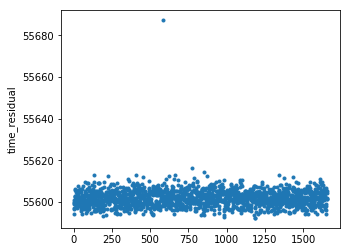

index_p 9
Jump Indices 23858 24892
1034
200100.34328735198


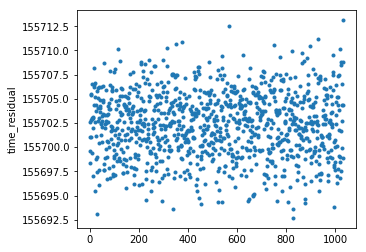

index_p 10
Jump Indices 24892 24893
1
200102.58792896156


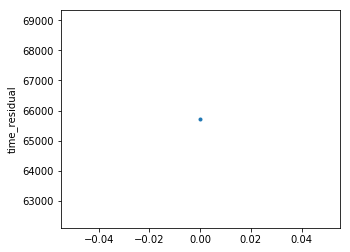

index_p 11
Jump Indices 24893 25656
763
200100.34323548226


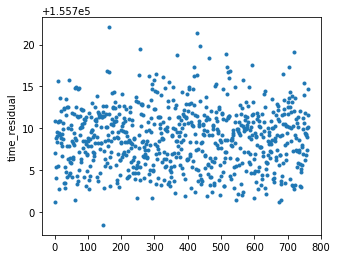

index_p 12
Jump Index size = 13 29606
[25656]
Jump Indices 25656 29606
200100.3432422669


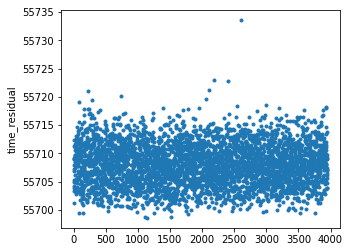

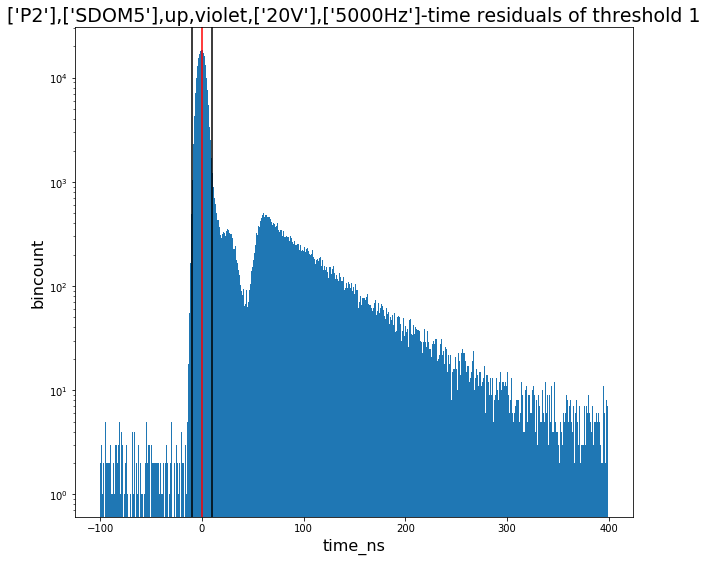

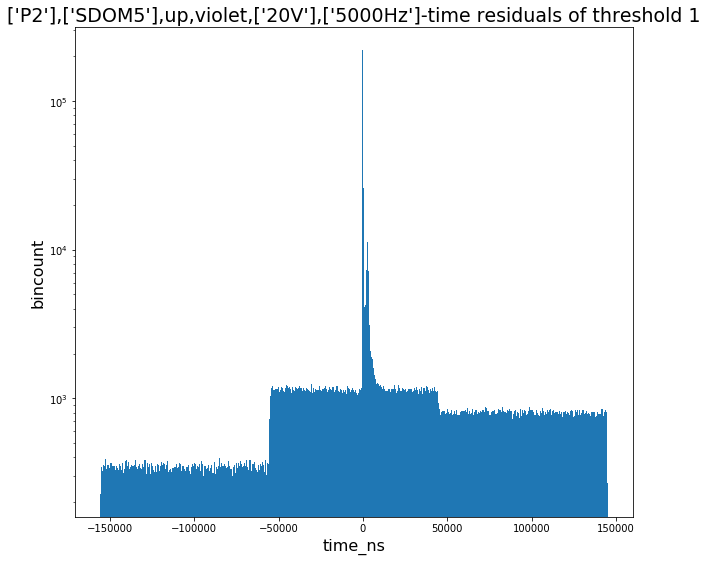

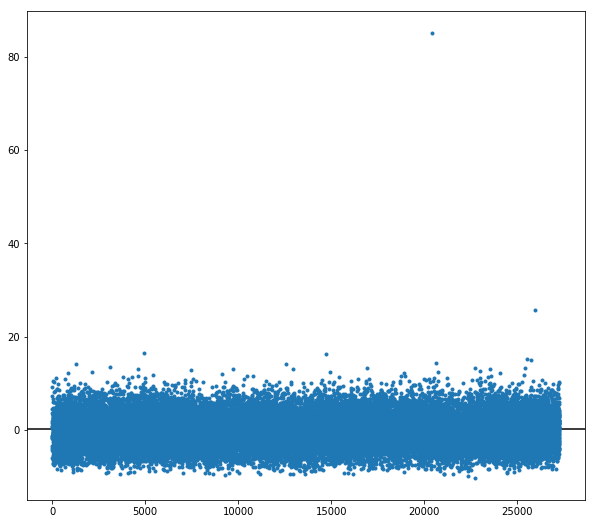

In [55]:
t_res_all2,  num_events2, noise_events2 = r2.res(gaus_peak, 500, 5)

# -----------------------------------------------------------
# sDOM5 MINOS

In [15]:
filename = '20190313_165315_UTC_SDOM5_FLASH_MINOS1_P2_violet_both_2500Hz_20V_30s_19072165325.hld_up.hdf5'
b = clean.clean(filename)

percentage of high jumps in the file - 0.0


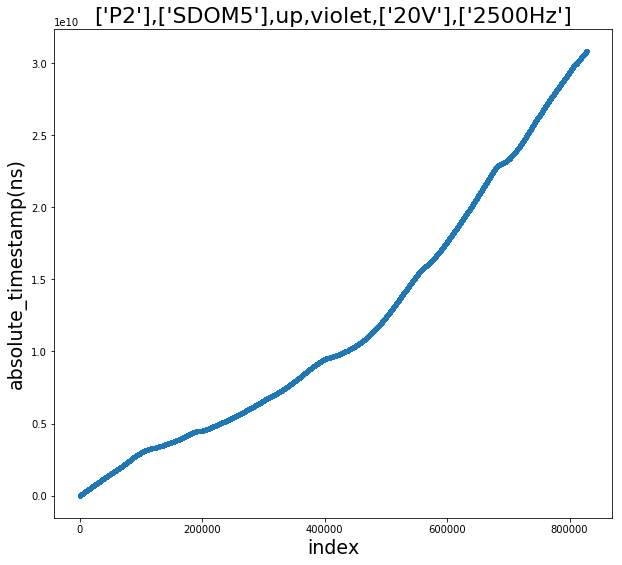

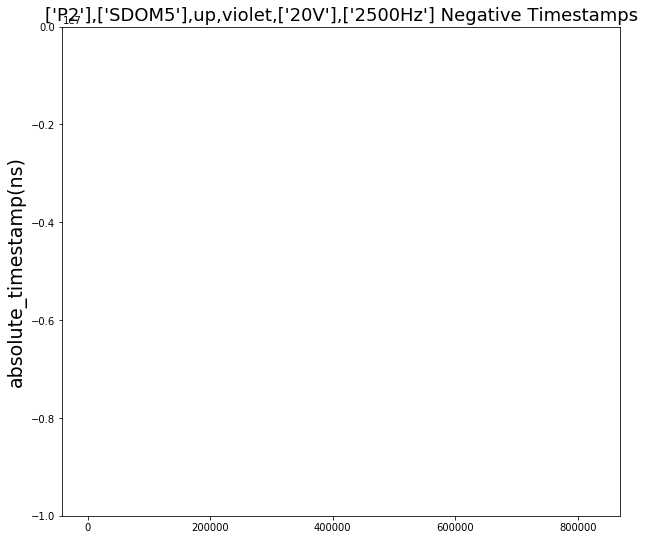

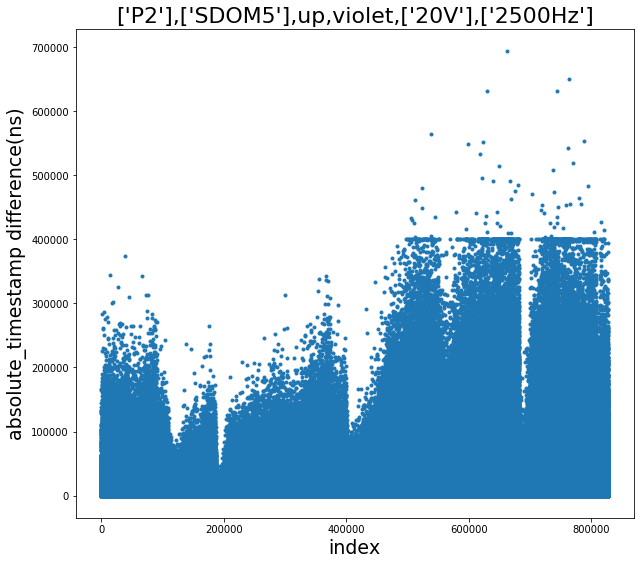

[]


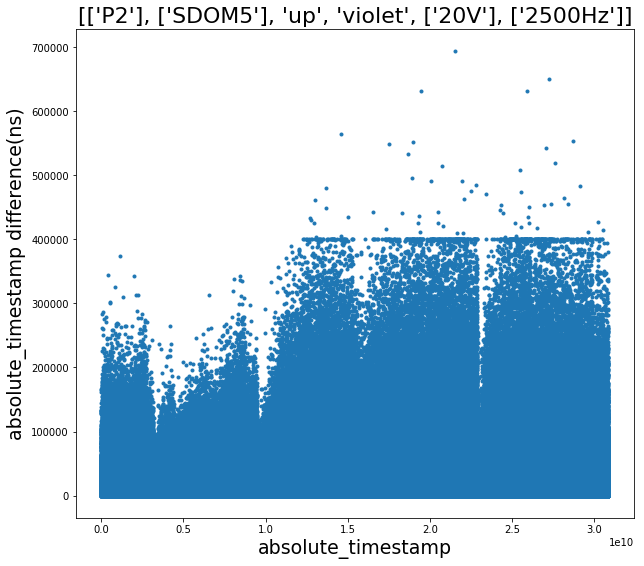

0.6833912347963076


In [16]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = b.P_S_used()

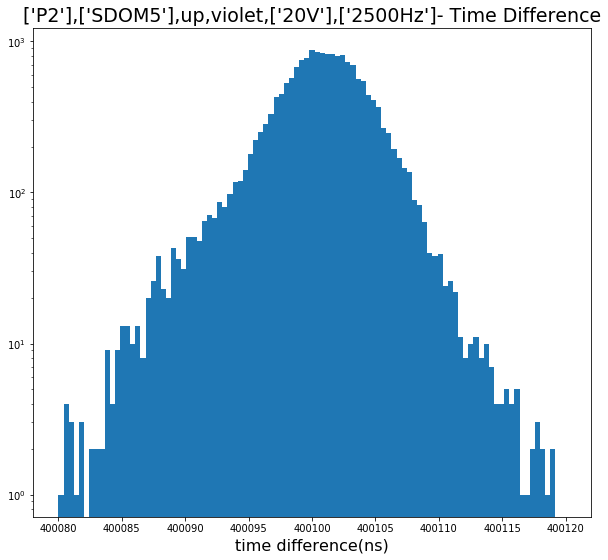

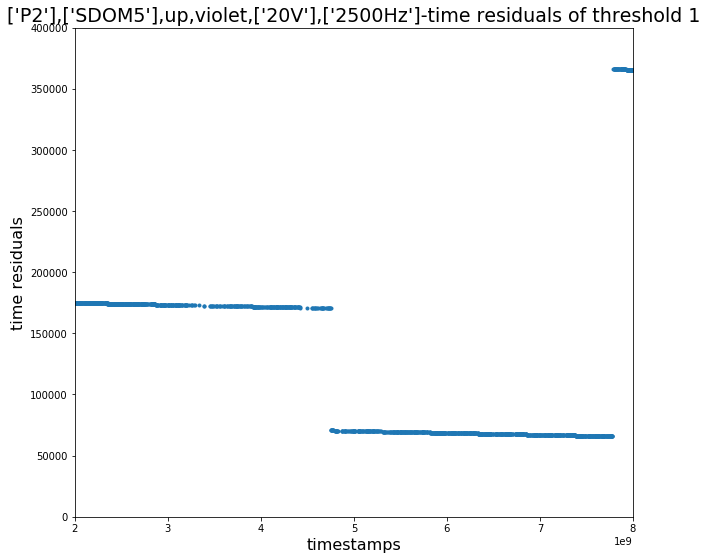

In [197]:
r2 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             0.2e10,.8e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

14565
jump_index [    0.  1464.  2296.  2464.  2942.  6156.  8658. 13639.]
jump_index size 8
index_p 0
Jump Indices 0 1465
1465
400100.7000308345


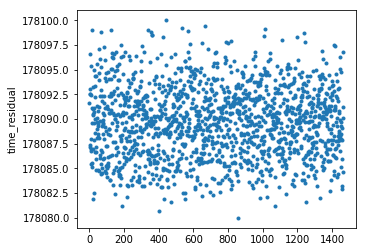

index_p 1
Jump Indices 1465 2297
832
400100.70006862405


/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


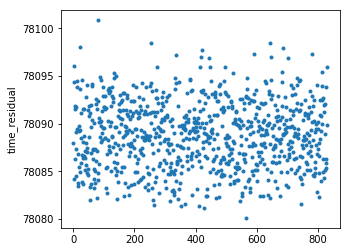

index_p 2
Jump Indices 2297 2465
168
400100.70073615335


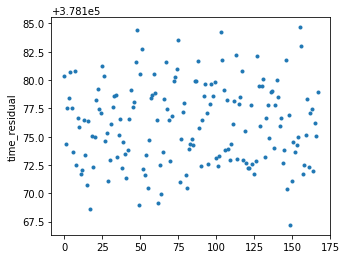

index_p 3
Jump Indices 2465 2943
478
400100.7003291288


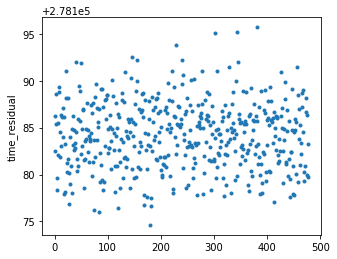

index_p 4
Jump Indices 2943 6157
3214
400100.70008466806


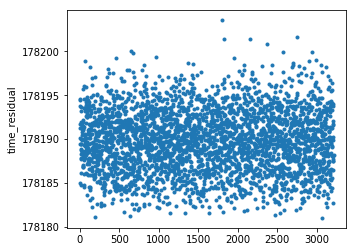

index_p 5
Jump Indices 6157 8659
2502
400100.70007867075


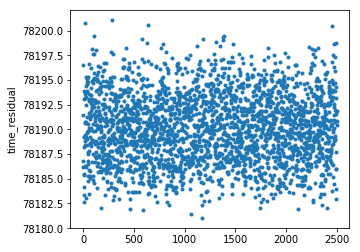

index_p 6
Jump Indices 8659 13640
4981
400100.7001942378


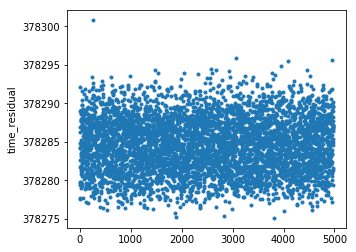

index_p 7
Jump Index size = 8 14564
[13640]
Jump Indices 13640 14564
400100.7004674227


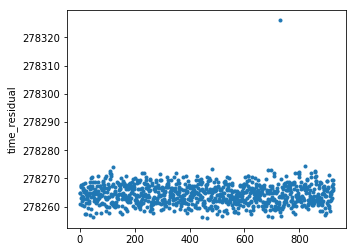

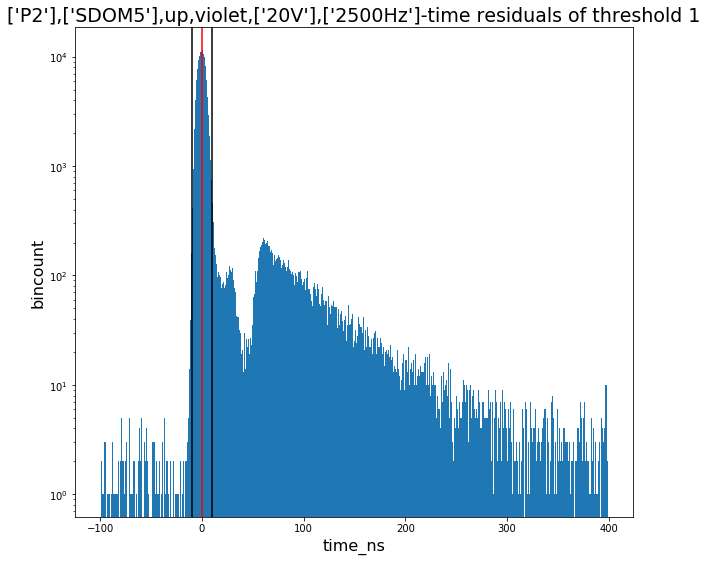

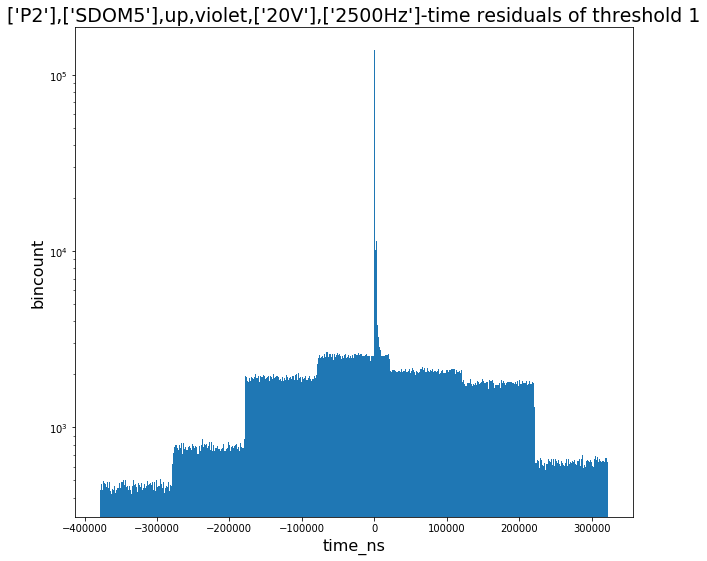

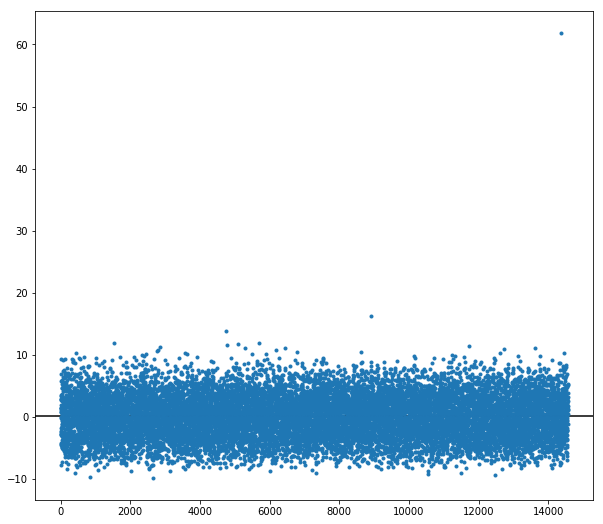

In [198]:
t_res_all2,  num_events2, noise_events2 = r2.res(gaus_peak, 500, 5)

In [199]:
sDOM5_MINOS_run = run.run()
run_time, err_run_time = sDOM5_MINOS_run.run_time(atstamp, p_jumps, dt_mean, b.f_0,
                                                    b.f_1-b.r_1,
                                                    b.f_2-b.r_2,
                                                    b.f_3-b.r_3)

print('dead_time_uncert: ', err_run_time/run_time*100, '%')

timestamp of the last event -  30859099264.8465
eliminating high jumps and summing -  30856399648.40729
run time -  30856399648.40729
dead_time_uncert:  0.0 %


# -----------------------------------------------------------
# sDOM5 HERA

In [159]:
filename = '20190607_162917_UTC_SDOM5_FLASH_HERA1_P2_violet_both_2500Hz_20V_60s_19158162927.hld_up.hdf5'
b = clean.clean(filename)

percentage of high jumps in the file - 5.085760773028307


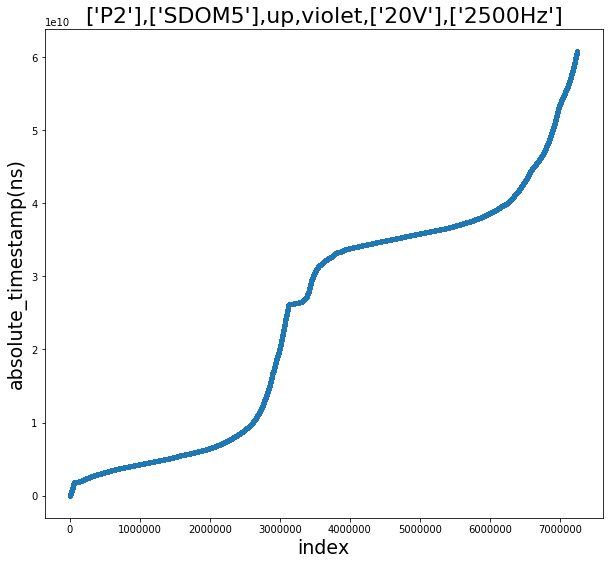

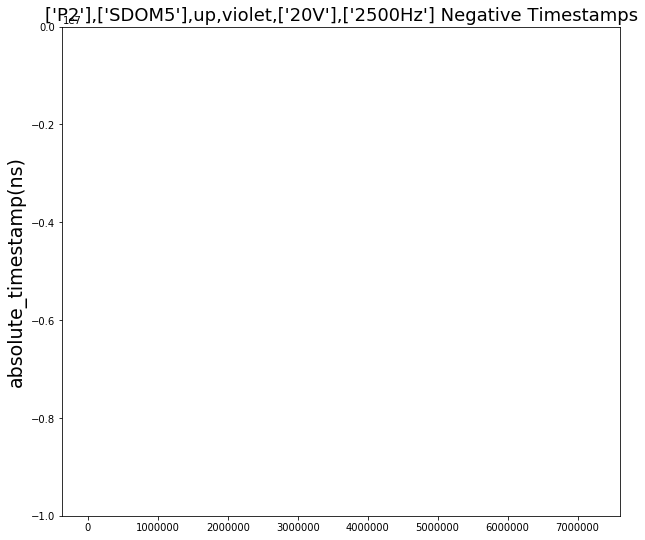

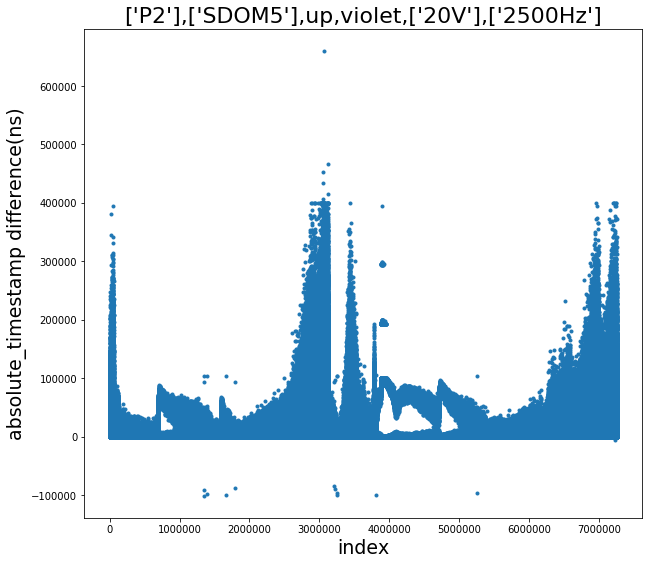

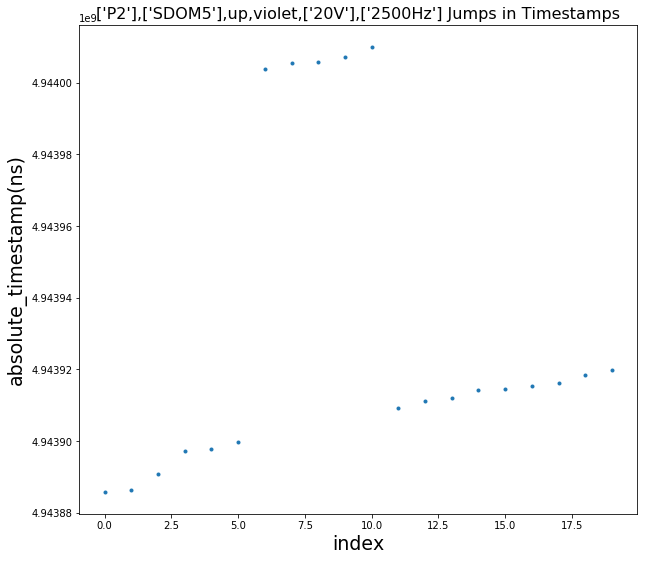

[1345424. 1345425. 1345426. 1345427. 1345428. 1345481. 1345482. 1345483.
 1345484. 1345485. 1345486. 1345487. 1393230. 1393231. 1393232. 1393233.
 1664144. 1664145. 1793915. 1793916. 1793917. 1793918. 1793919. 1793920.
 1793921. 3210232. 3210233. 3210234. 3210235. 3210236. 3210237. 3210238.
 3218313. 3218314. 3218315. 3218316. 3218317. 3218318. 3218319. 3218320.
 3218321. 3249889. 3249890. 3249891. 3249946. 3249947. 3249948. 3249949.
 3808286. 3808287. 5254483. 5254484. 5254485. 7226949. 7226950. 7226951.
 7226952. 7226953. 7226954. 7226955. 7226956. 7226957. 7226958.]


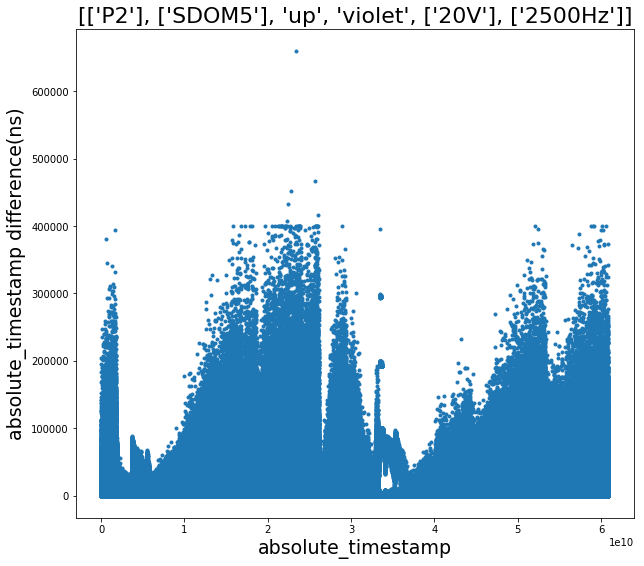

0.3502098837380687


In [160]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = b.P_S_used()

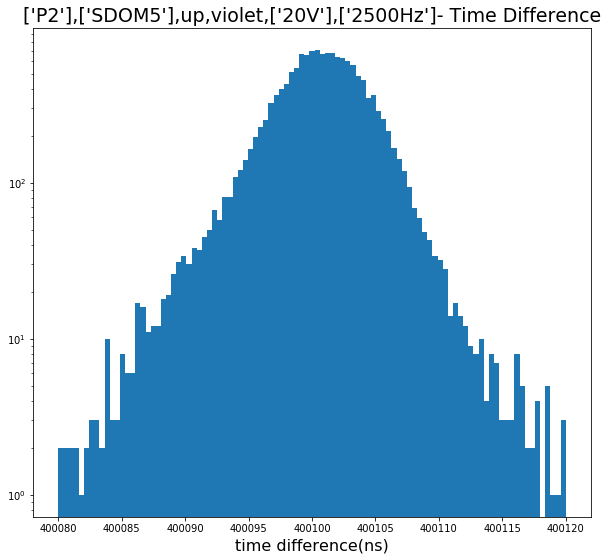

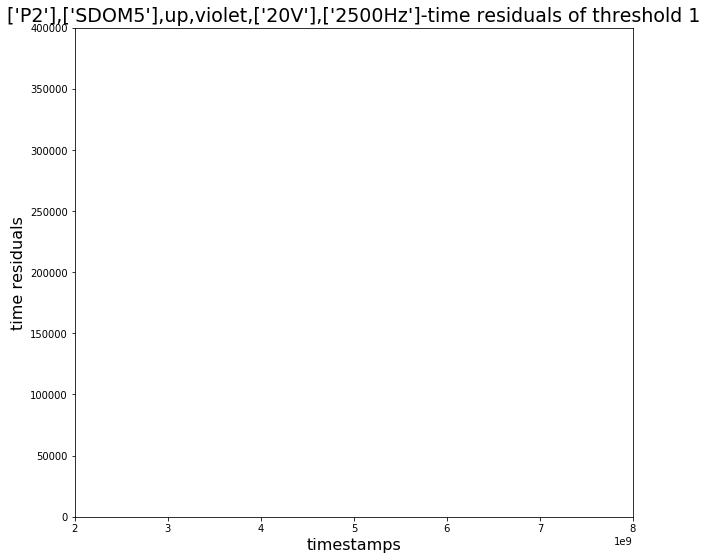

In [164]:
r2 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             0.2e10,.8e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3,falling_0_elim_3)

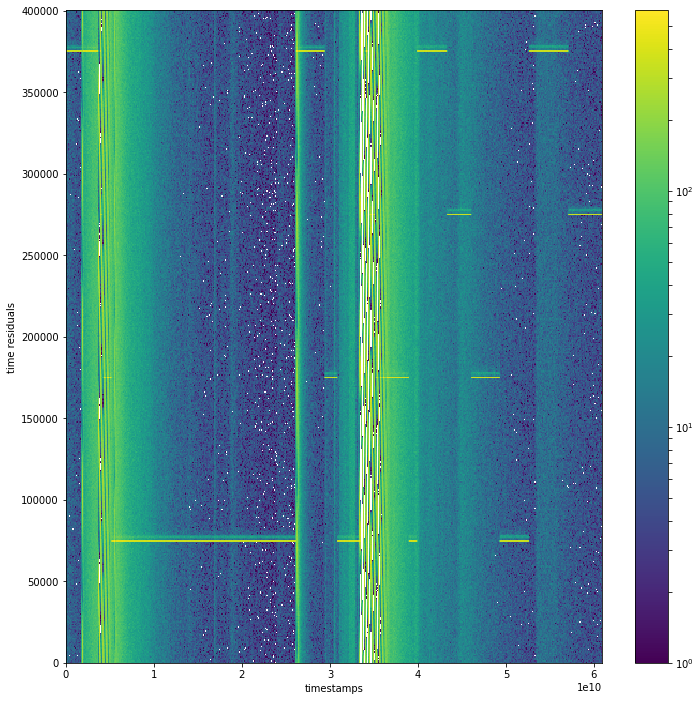

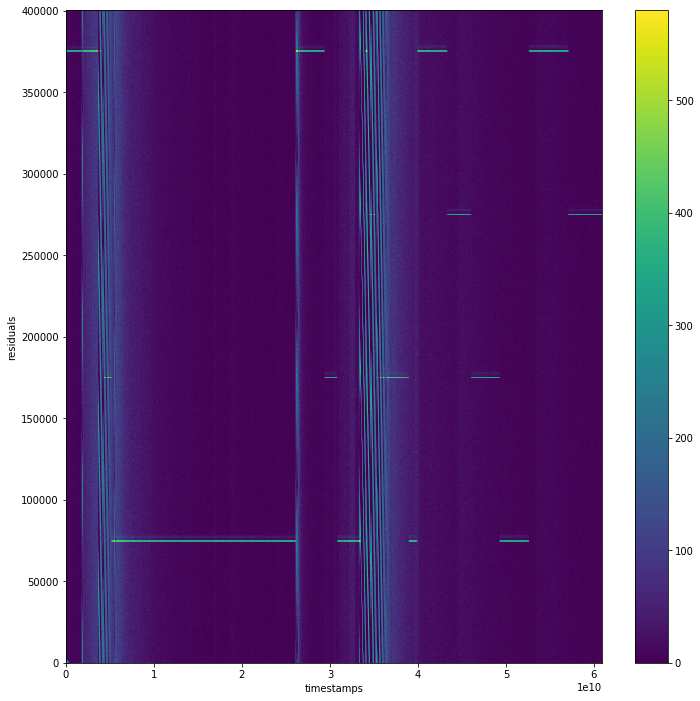

In [166]:
gaus_peak = 400100.7346796422#r2.GetGausPeak([.0e10,1e10])
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r2.HIST2D(500, gaus_peak, SDOM_num)

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


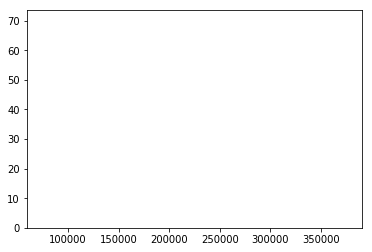

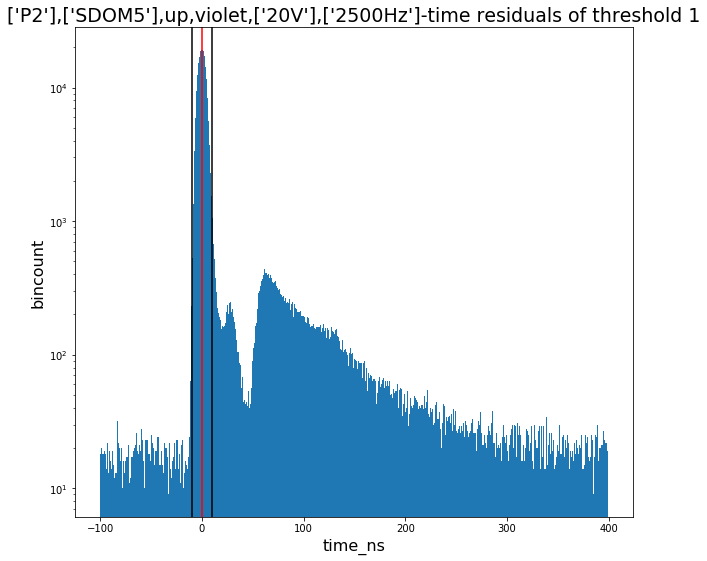

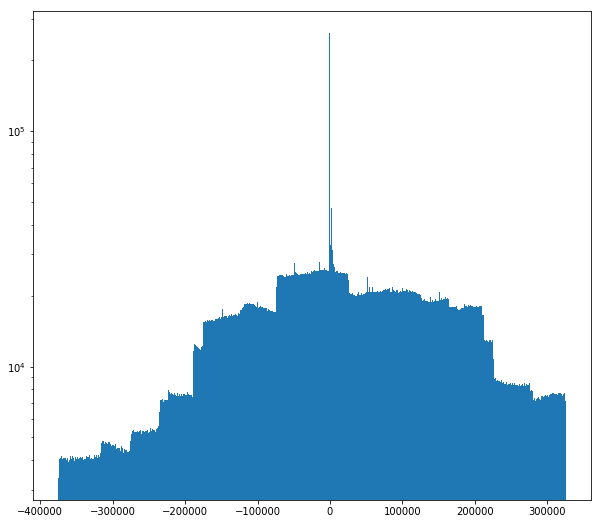

In [167]:
t_res_all1,num_events1, noise_events1 = r2.calc_res(BinsHist, 10, 2, 1)

In [169]:
sDOM5_MINOS_run = run.run()
run_time, err_run_time,dead_time_uncert = sDOM5_MINOS_run.run_time(atstamp, p_jumps, dt_mean, b.f_0,
                                                    b.f_1-b.r_1,
                                                    b.f_2-b.r_2,
                                                    b.f_3-b.r_3)

print('dead_time_uncert: ', err_run_time/run_time*100, '%')

time removed(small jumps) -  485374.690281868
timestamp of the last event -  60880696202.12085
eliminating high jumps and summing -  58360535619.13602
run time -  58360050244.44573
dead_time_uncert:  0.6438584934203984 %


# -----------------------------------------------------------
# sDOM2 POSEIDON

In [233]:
filename = '20190426_085558_UTC_SDOM2_FLASH_POSEIDON1_P2_violet_both_2500Hz_20V_60s_19116085608.hld_up.hdf5'
c = clean.clean(filename)

percentage of high jumps in the file - 3.9254107454720133


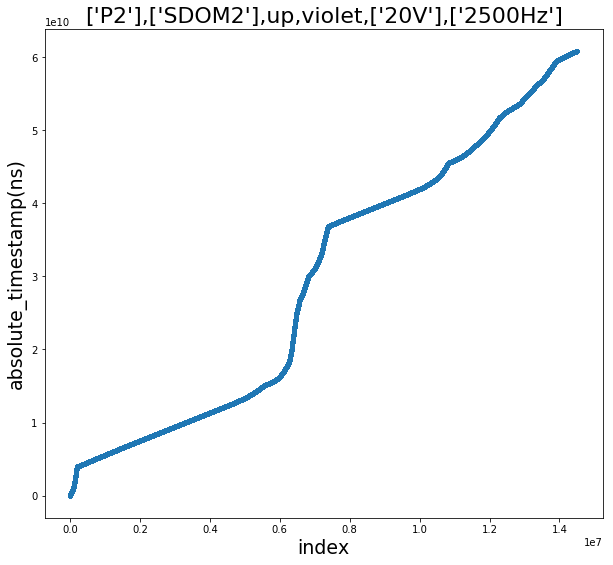

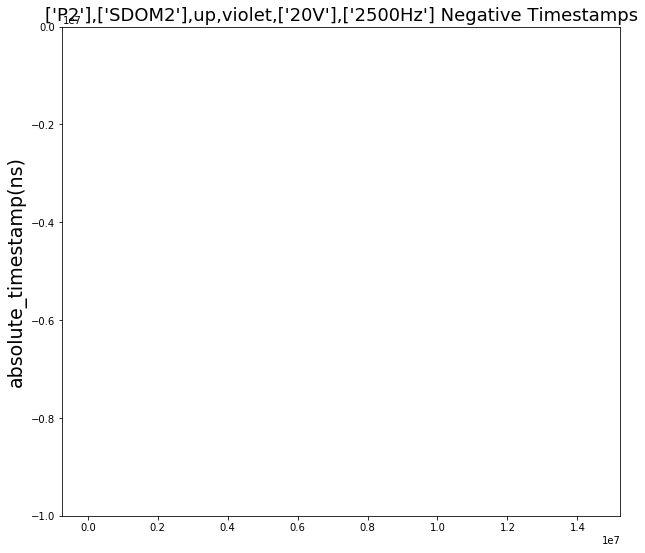

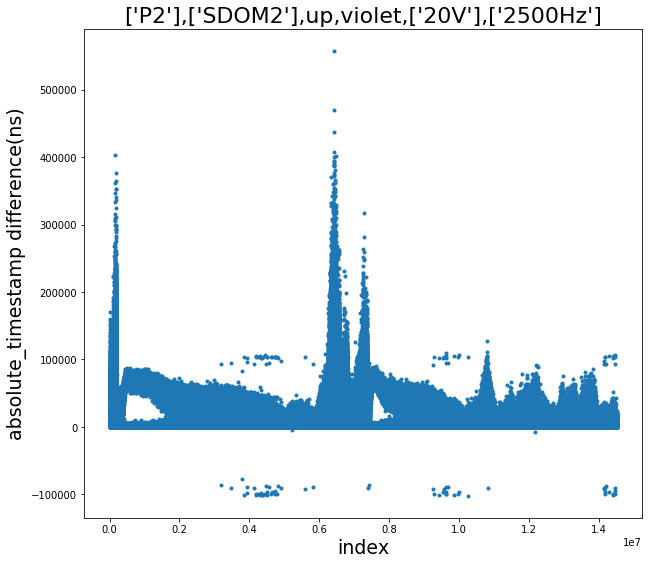

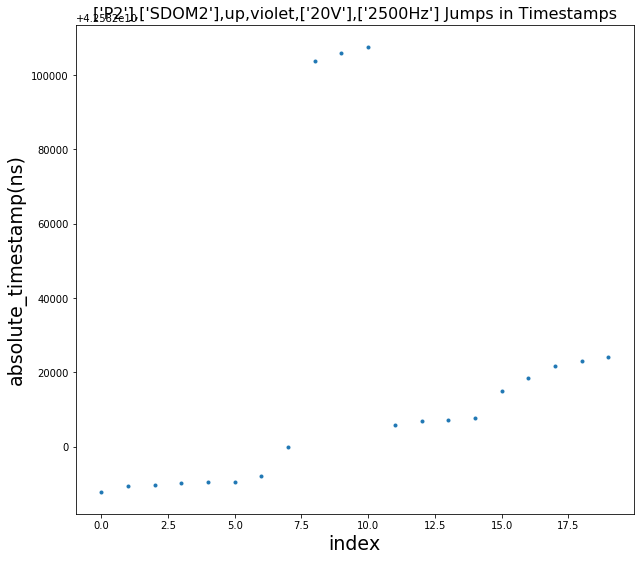

[ 3184767.  3184768.  3184769.  3184770.  3469711.  3469712.  3469713.
  3469714.  3469715.  3776833.  3776834.  3776835.  3776836.  3776837.
  3776838.  3776839.  3776840.  3776841.  3853962.  3919603.  3919604.
  3919605.  3919606.  3922032.  3922033.  3922034.  3922035.  3922036.
  4121928.  4121929.  4121930.  4121931.  4121932.  4121933.  4174042.
  4174043.  4174044.  4174045.  4174046.  4189792.  4247824.  4247825.
  4247826.  4247827.  4296996.  4296997.  4296998.  4296999.  4297000.
  4297001.  4331678.  4358262.  4358263.  4358264.  4358265.  4358266.
  4397512.  4397513.  4397514.  4397515.  4446191.  4476151.  4476152.
  4476153.  4476154.  4476155.  4476156.  4476157.  4476158.  4489727.
  4489728.  4497023.  4497024.  4559289.  4559290.  4559291.  4559292.
  4559293.  4559294.  4559295.  4614527.  4652291.  4652292.  4652293.
  4652294.  4717159.  4717216.  4717217.  4717218.  4717219.  4717220.
  4717221.  4724674.  4724675.  4781645.  4781646.  4802836.  4802837.
  4802

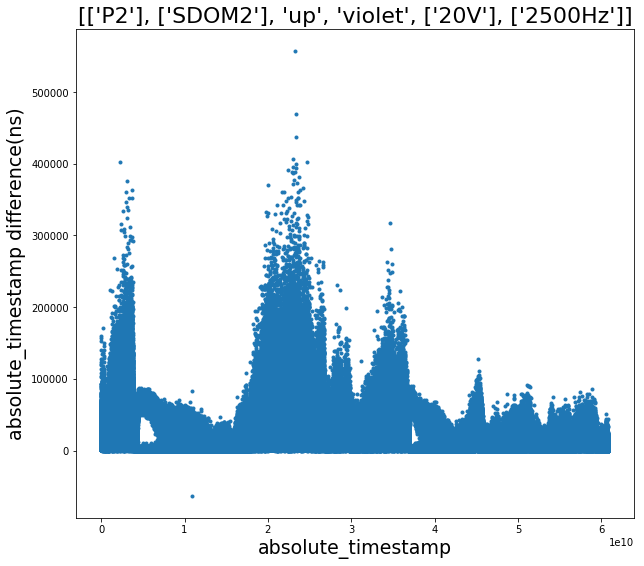

0.1397348937143665


In [234]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = c.P_S_used()

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:3285: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=1.0, top=1.0
  'bottom=%s, top=%s') % (bottom, top))


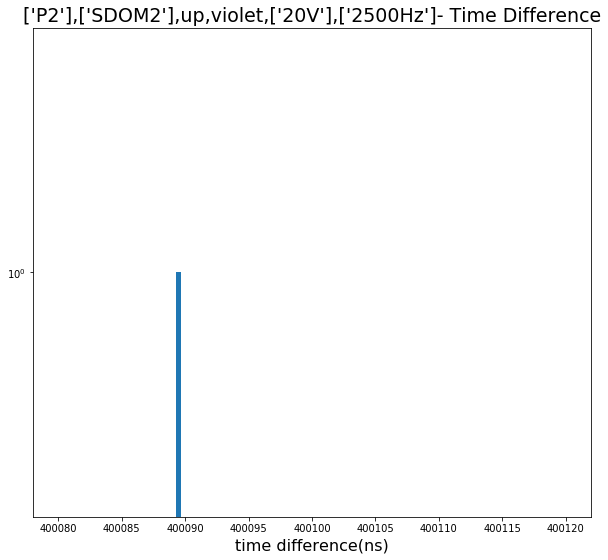

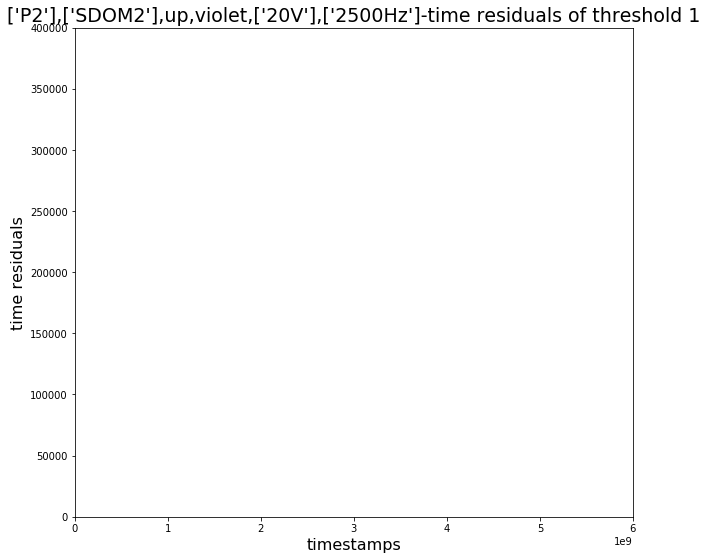

In [19]:
r3 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             0.0e10,0.6e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3, falling_0_elim_3)

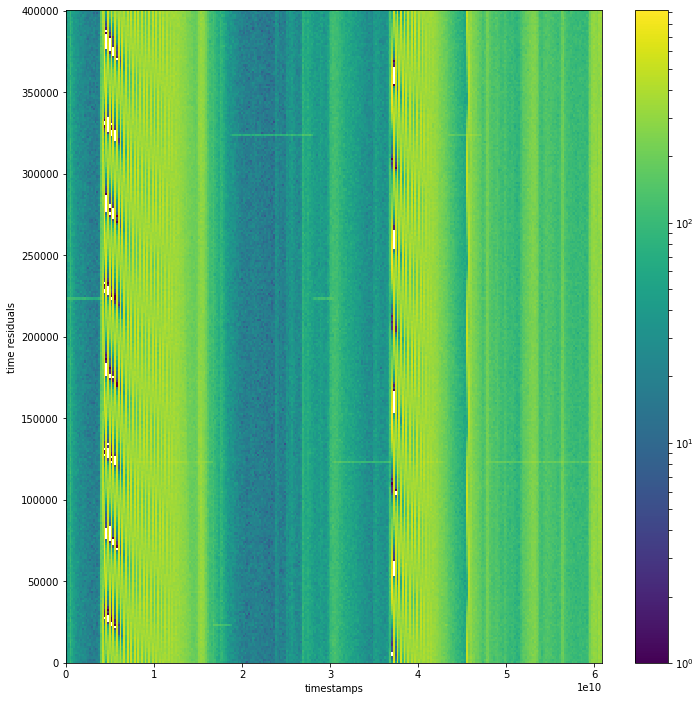

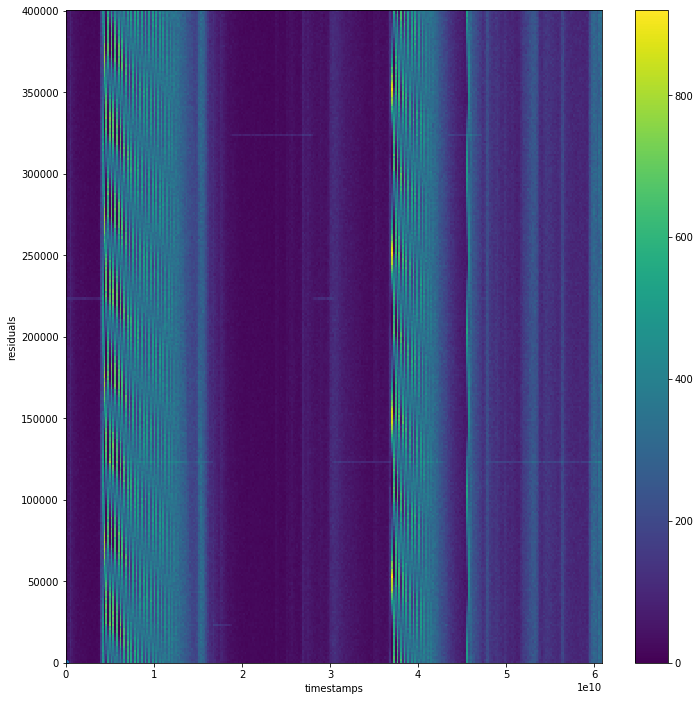

In [311]:
gaus_peak = 400100.7156722718
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r3.HIST2D(300, gaus_peak, SDOM_num)

In [17]:
time_window1 = (abs_elim_3>0.5e10) & (abs_elim_3<1.6e10)
time_window2 = (abs_elim_3>3.1e10) & (abs_elim_3<4.2e10)
time_window3 = (abs_elim_3>4.8e10) & (abs_elim_3<6.0e10) # not used
time_window4 = (abs_elim_3>1.9e10) & (abs_elim_3<2.8e10)
time_window5 = (abs_elim_3>0.0e10) & (abs_elim_3<0.4e10)

time_correction_3 = (abs_elim_3[-1]-abs_elim_3[0])/((1.6-0.5 + 4.2-3.1 + 2.8-1.9 + 0.4)*1e10)
print(time_correction_3)


0.57504120677826


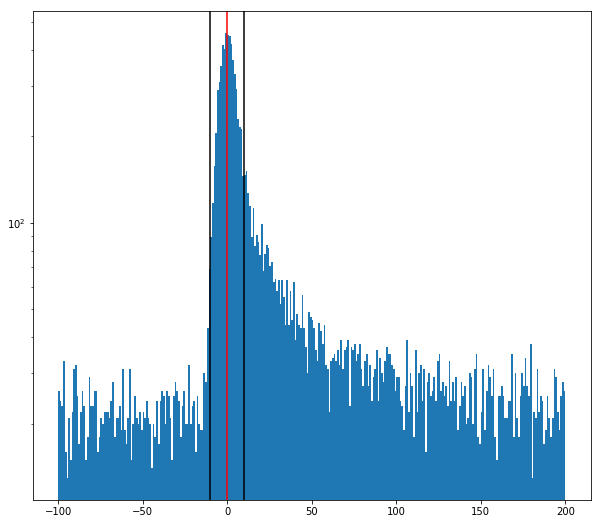

In [20]:
## Plotting POCAM residuals by eye

gaus_peak = 400100.7156722718
my_data_all = np.array([])
weights_all = np.array([])

my_slice = (abs_elim_3+rising_1_elim_3)[time_window1] 
weights = r3.weights[time_window1]
my_res = (my_slice%gaus_peak) - 223260+100000+198
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window2]
weights = r3.weights[time_window2]
my_res = (my_slice%gaus_peak) - 223260+100000+89
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window3] 
my_res = (my_slice%gaus_peak) - 223260+100000-42
#my_data_all = np.append(my_data_all, my_res)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window4]
weights = r3.weights[time_window4]
my_res = (my_slice%gaus_peak) - 223260-100000-46+142
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window5]
weights = r3.weights[time_window5]
my_res = (my_slice%gaus_peak) - 223260-46+240.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

fig, ax = plt.subplots(figsize=(10,9))
n,bins,patches = ax.hist(my_data_all,bins=300,log=True, range=(-100,200), weights=weights_all)
ax.axvline(color='r')
ax.axvline(-10,color='k')
ax.axvline(10,color='k')

total_time = (abs_elim_3[-1]-abs_elim_3[0])
time_used = ((1.6-0.5) + (4.2-3.1) + (2.8-1.9) + (0.4))*1e10
time_correction = time_used / total_time

# save to csv
path = 'Data/POSEIDON1/Measured_arrival_times/'
filename = "['P2'],['SDOM2'],up,violet,['20V'],['2500Hz'].csv"
with open(path+filename, 'w') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(bins[:-1])
    writer.writerow(n)
csvfile.close()

#fig, ax = plt.subplots(figsize=(10,9))
#_ = ax.hist(my_res,bins=300,log=True)



In [235]:
sDOM2_POSEIDON_run = run.run()
run_time, err_run_time, dead_time_uncert = sDOM2_POSEIDON_run.run_time(atstamp, p_jumps, dt_mean, c.f_0,
                                                    c.f_1-c.r_1,
                                                    c.f_2-c.r_2,
                                                    c.f_3-c.r_3)

print('dead_time_uncert: ',dead_time_uncert, '%')

time removed(small jumps) -  519412.3861026764
timestamp of the last event -  60867090759.27833
eliminating high jumps and summing -  56255123965.78507
run time -  56254604553.39897
0.7531461586286848 %


# -----------------------------------------------------------
# sDOM2 SANTACLAUS

In [56]:
filename = '20181205_092552_UTC_SDOM2_FLASH_SANTACLAUS_P2_violet_both_5000Hz_20V_60s_18339135919.hld_up.hdf5'
c = clean.clean(filename)

percentage of high jumps in the file - 0.0


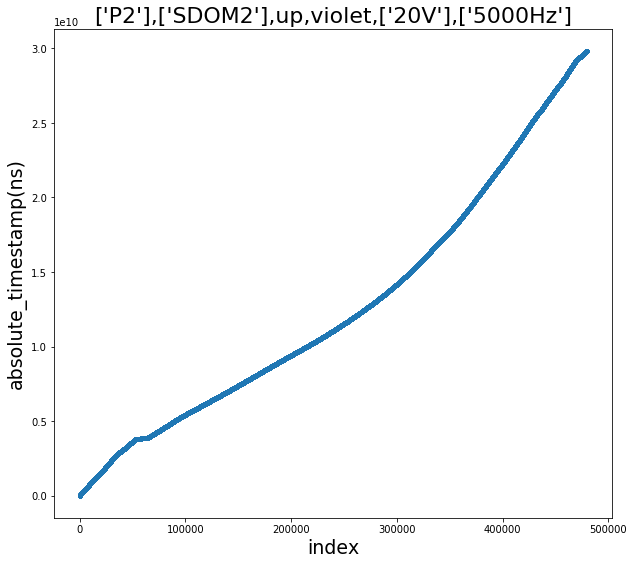

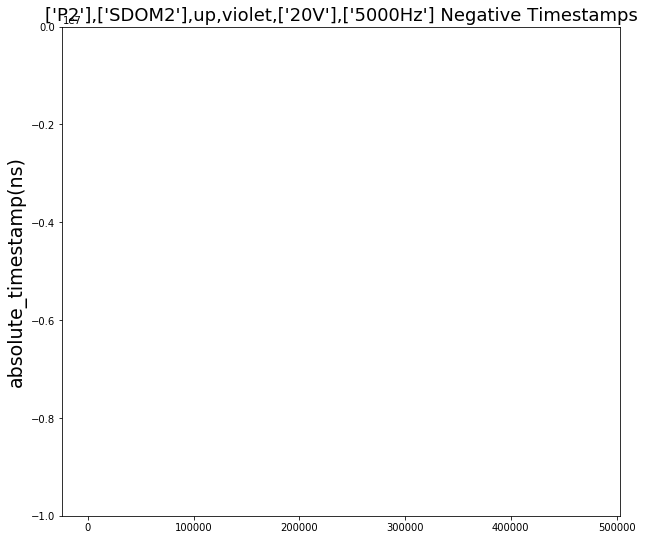

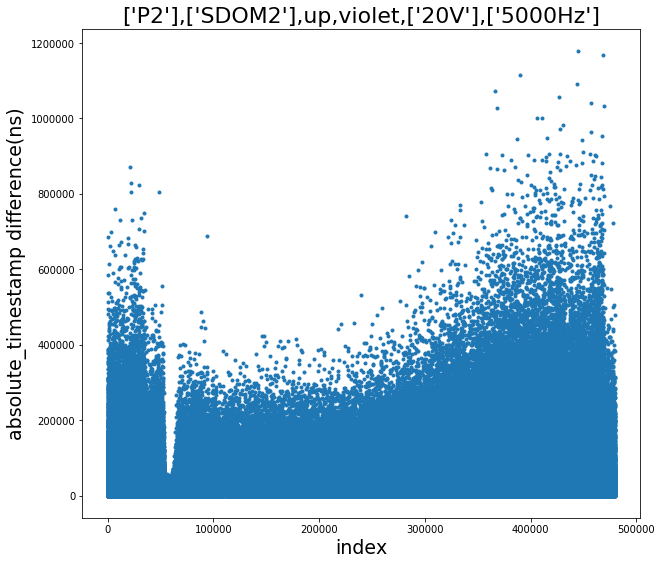

[]


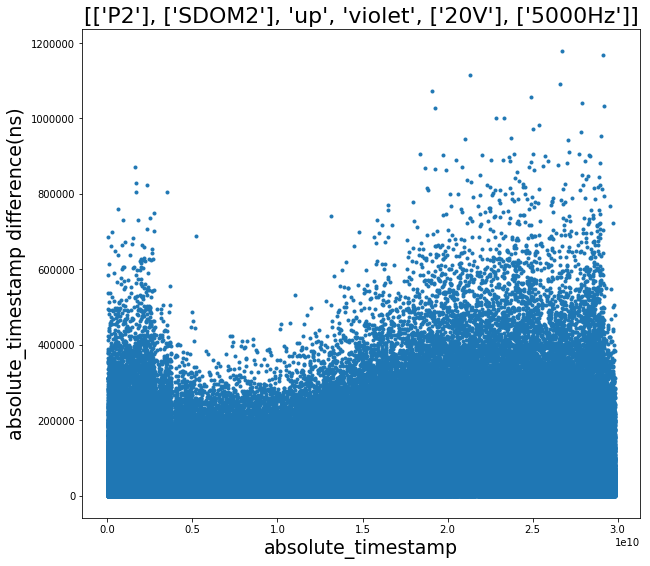

0.10371235992571108


In [57]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = c.P_S_used()

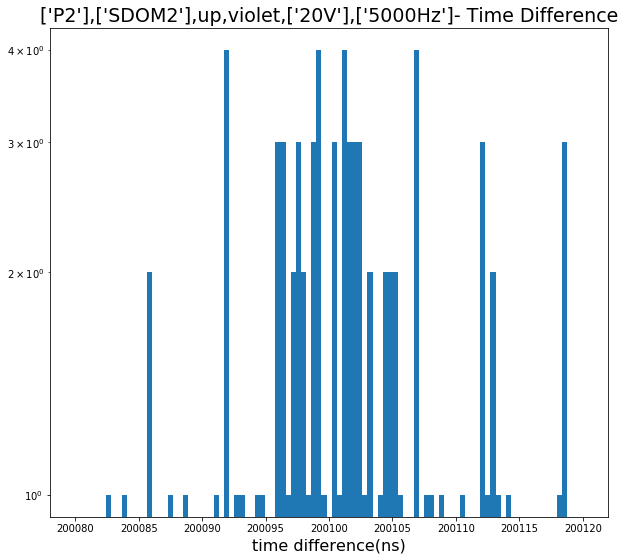

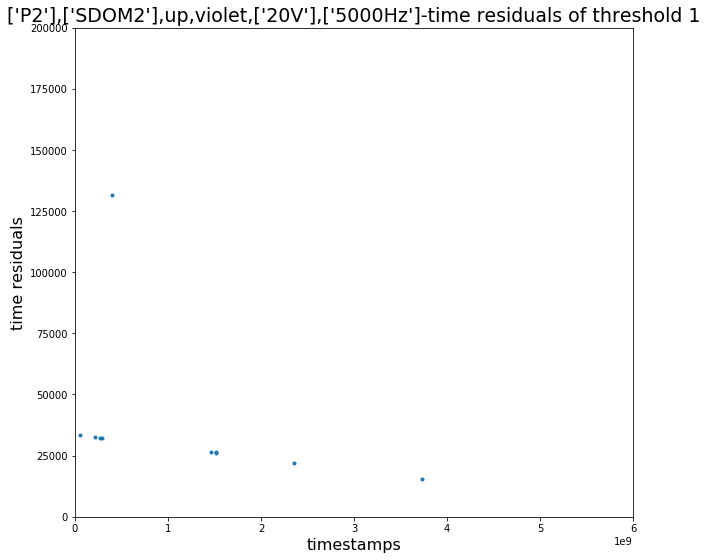

In [58]:
r3 = residual.residual(abs_elim_3,rising_1_elim_3,200080, 200120, 100, 
                                200095, 200105,
             0.0e10,0.6e10,0, 200000, file_path, values, POCAM_num, rising_0_elim_3, falling_0_elim_3)

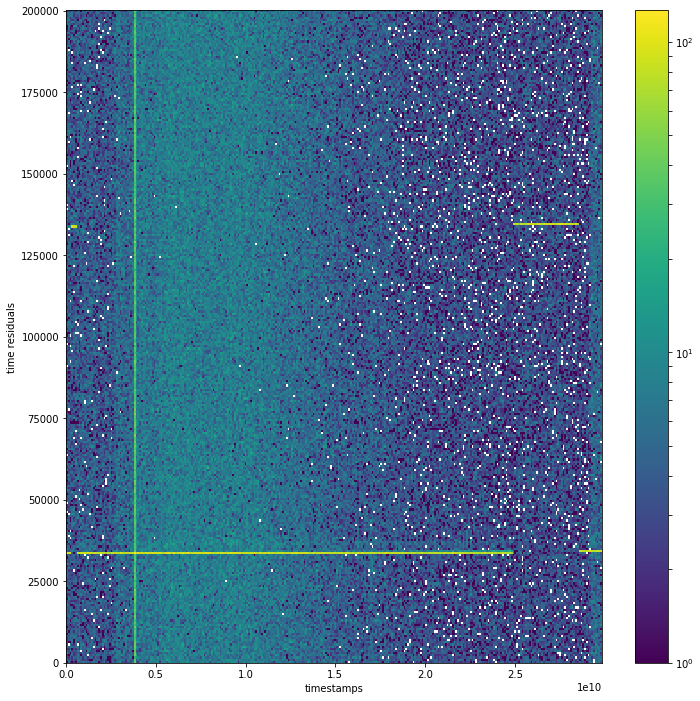

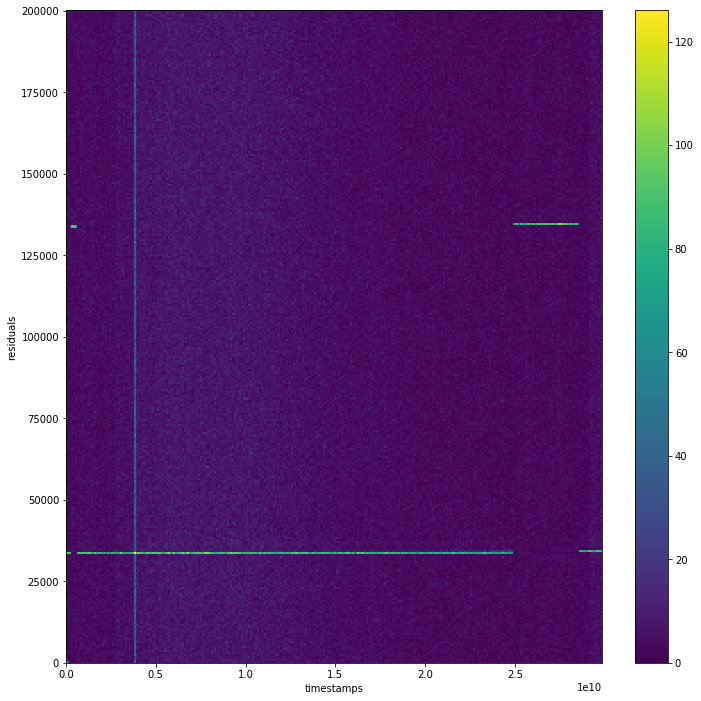

In [84]:
gaus_peak = 200100.34421150477 #200100.34361150477
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r3.HIST2D(300, gaus_peak, SDOM_num)

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


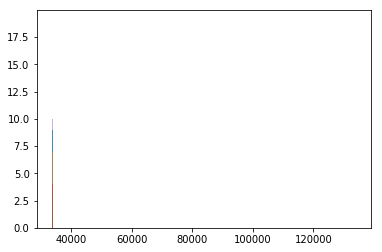

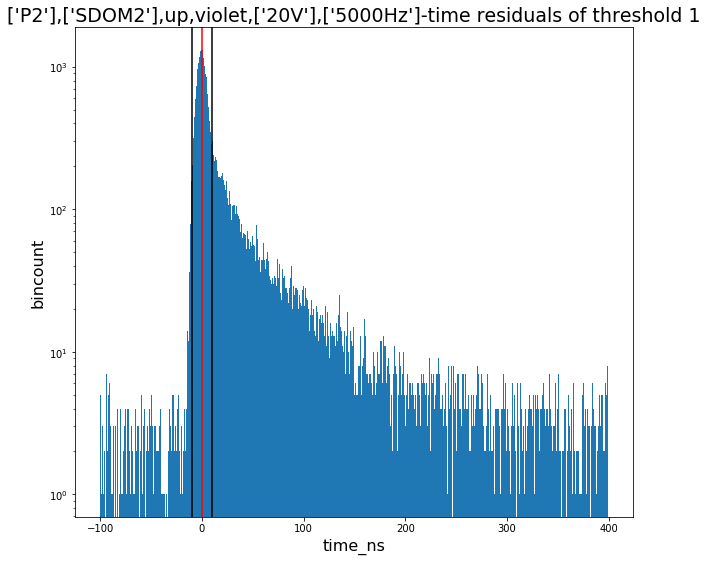

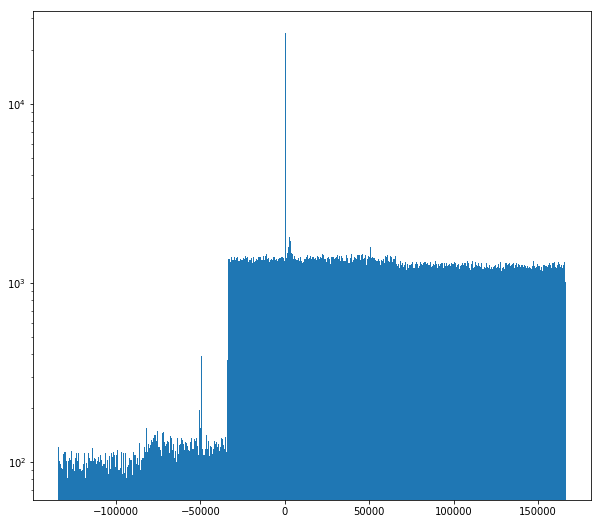

In [85]:
t_res_all1,num_events1, noise_events1 = r3.calc_res(BinsHist, 10, 2, 1)

# -----------------------------------------------------------
# sDOM2 MINOS

In [273]:
filename = '20190313_165314_UTC_SDOM2_FLASH_MINOS1_P2_violet_both_2500Hz_20V_30s_19072165324.hld_up.hdf5'
c = clean.clean(filename)

percentage of high jumps in the file - 1.9040256096719634


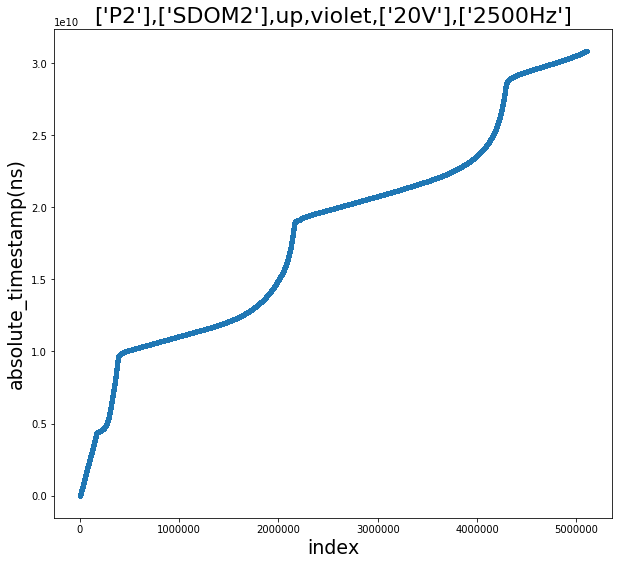

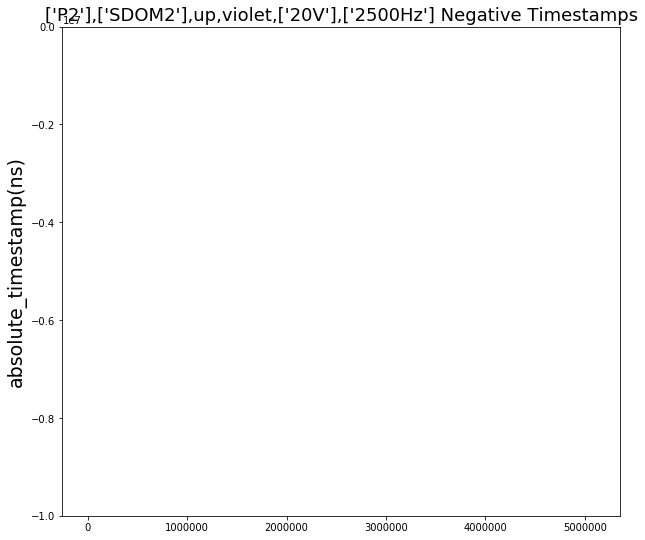

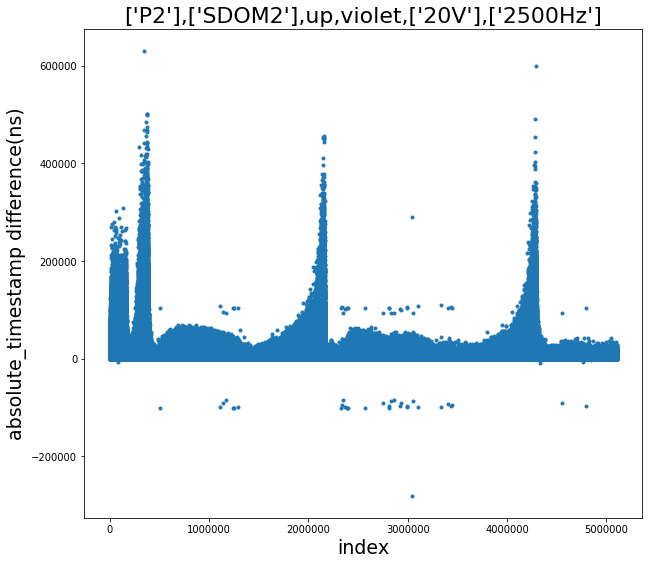

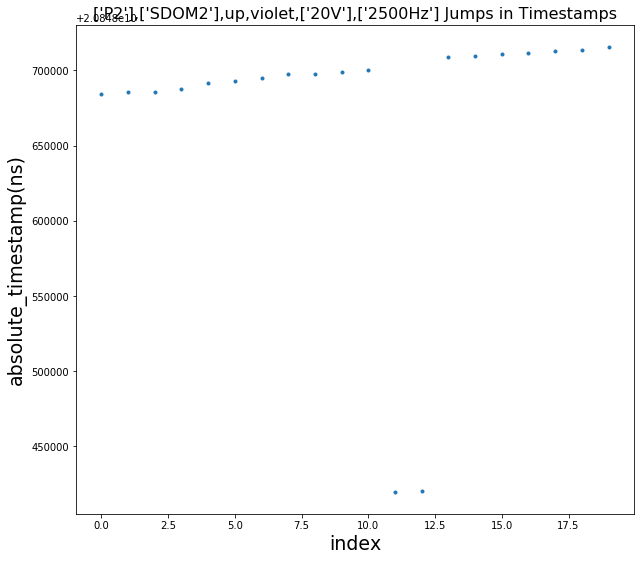

[  88406.   88407.   88408.   88409.   88410.   88411.   88412.   88413.
   88414.  511766.  511767. 1114409. 1143748. 1143749. 1143750. 1143751.
 1143752. 1143753. 1143754. 1143755. 1171416. 1171417. 1171418. 1240833.
 1240834. 1253094. 1253095. 1289297. 1289298. 1289299. 1289300. 1289301.
 2328272. 2328273. 2328274. 2328275. 2339795. 2350568. 2350569. 2350570.
 2367367. 2367368. 2367369. 2367370. 2387320. 2387321. 2390263. 2390264.
 2401237. 2401238. 2573188. 2573189. 2573190. 2754420. 2754421. 2754422.
 2754423. 2808465. 2808466. 2808522. 2808523. 2808524. 2808525. 2808526.
 2808527. 2828309. 2828310. 2828311. 2828312. 2860320. 2860321. 2860322.
 2860323. 2918230. 2933497. 2933498. 2989358. 2996655. 2996656. 3039383.
 3039384. 3039385. 3039386. 3039387. 3039388. 3039389. 3048634. 3048635.
 3048636. 3048637. 3048638. 3104222. 3333267. 3333268. 3333269. 3333270.
 3333271. 3404415. 3404416. 3404417. 3404418. 3404419. 3433188. 3442938.
 3442939. 4329718. 4329719. 4329720. 4329721. 43297

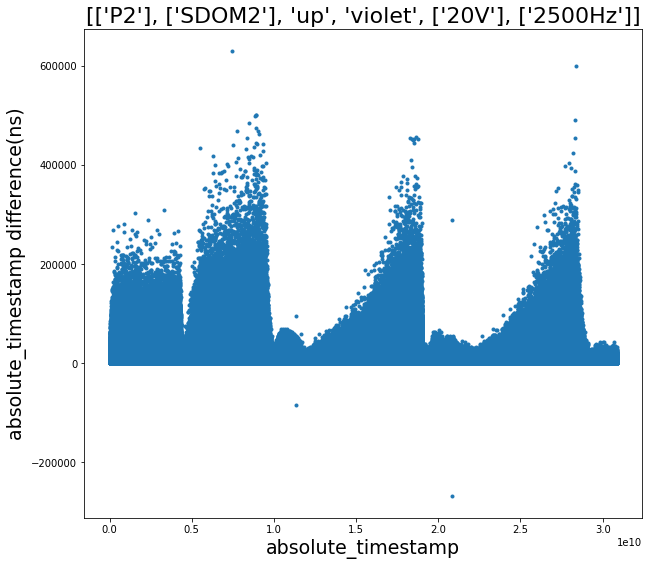

0.1147766503654534


In [274]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = c.P_S_used()

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:3285: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=1.0, top=1.0
  'bottom=%s, top=%s') % (bottom, top))


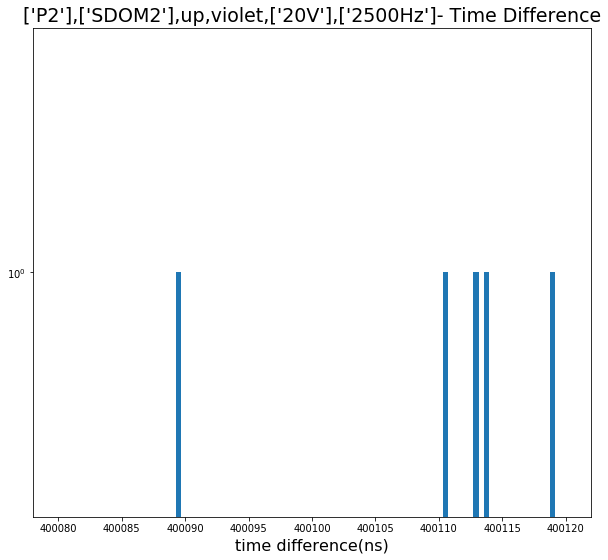

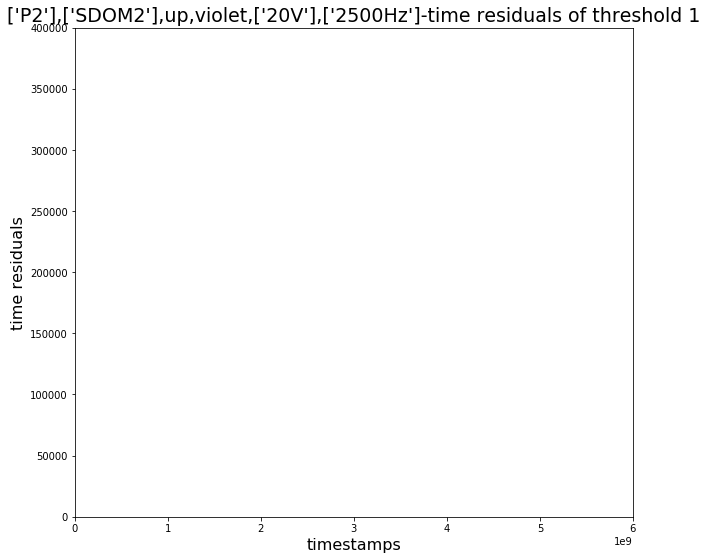

In [275]:
r3 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             0.0e10,0.6e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3, falling_0_elim_3)

400100.7064670303


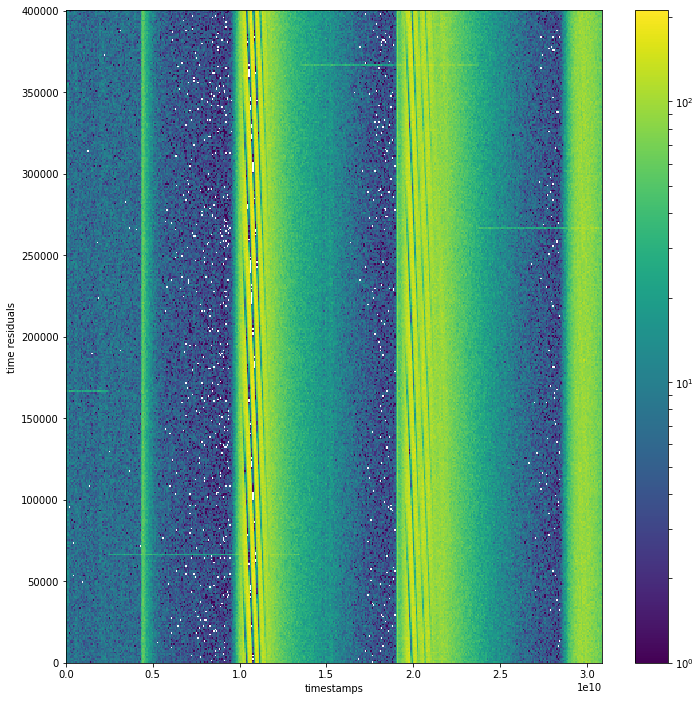

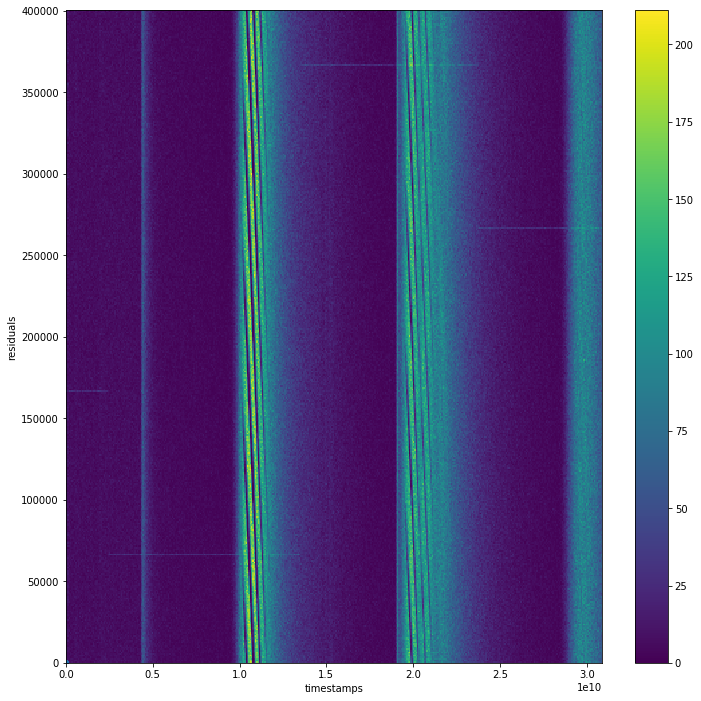

In [276]:
gaus_peak = r3.GetGausPeak([1.4e10,2.3e10])#400100.7064670303 #400100.7156722718
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r3.HIST2D(400, gaus_peak, SDOM_num)

In [277]:
time_window1 = (abs_elim_3<0.2e10)
time_window2 = (abs_elim_3>.25e10) & (abs_elim_3<.95e10)
time_window3 = (abs_elim_3>1.4e10) & (abs_elim_3<1.95e10)
time_window4 = (abs_elim_3>2.45e10) & (abs_elim_3<2.8e10)

time_correction_3 = 3/(.2 + .95-0.25 + 1.95-1.4 + 2.8-2.45)
print(time_correction_3)

0.6


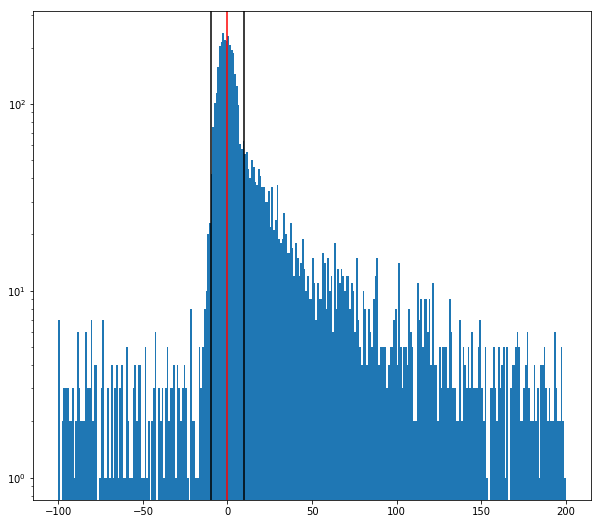

In [290]:
## Plotting POCAM residuals by eye

my_data_all = np.array([])
weights_all = np.array([])

#gaus_peak = 400100.7064670303-0.0004

my_slice = (abs_elim_3+rising_1_elim_3)[time_window1] 
weights = r3.weights[time_window1]
my_res = (my_slice%gaus_peak) - 223260+100000-45000+2000-221
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window2]
weights = r3.weights[time_window2]
my_res = (my_slice%gaus_peak) - 223260+100000+89+60000-3000-300-8
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window3]
weights = r3.weights[time_window3]
my_res = (my_slice%gaus_peak) - 223260-100000-40000-3400+64+17.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window4]
weights = r3.weights[time_window4]
my_res = (my_slice%gaus_peak) - 223260-100000+60000-3500+155+27.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

fig, ax = plt.subplots(figsize=(10,9))
n,bins,patches = ax.hist(my_data_all,bins=300,log=True,weights=weights_all,range=(-100,200))
ax.axvline(color='r')
ax.axvline(-10,color='k')
ax.axvline(10,color='k')

# save to csv
path = 'Data/MINOS1/violet/Measured_arrival_times/'
filename = "['P2'],['SDOM2'],up,violet,['20V'],['2500Hz'].csv"
with open(path+filename, 'w') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(bins[:-1])
    writer.writerow(n)
csvfile.close()



In [204]:
sDOM2_MINOS_run = run.run()
run_time, err_run_time,dead_time_uncert = sDOM2_MINOS_run.run_time(atstamp, p_jumps, dt_mean, c.f_0,
                                                    c.f_1-c.r_1,
                                                    c.f_2-c.r_2,
                                                    c.f_3-c.r_3)

print('dead_time_uncert: ', err_run_time/run_time*100, '%')

time removed(small jumps) -  169840.86118221283
timestamp of the last event -  30861099028.781487
eliminating high jumps and summing -  30175583786.87389
run time -  30175413946.012707
dead_time_uncert:  0.9344936471196127 %


# -----------------------------------------------------------
# sDOM3 HERA

In [170]:
filename = '20190607_162916_UTC_SDOM2_FLASH_HERA1_P2_violet_both_2500Hz_20V_60s_19158162926.hld_up.hdf5'
c = clean.clean(filename)

percentage of high jumps in the file - 1.300395146990141


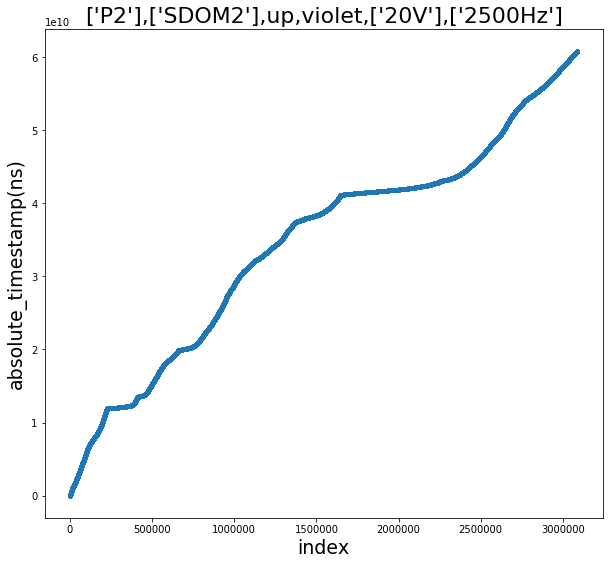

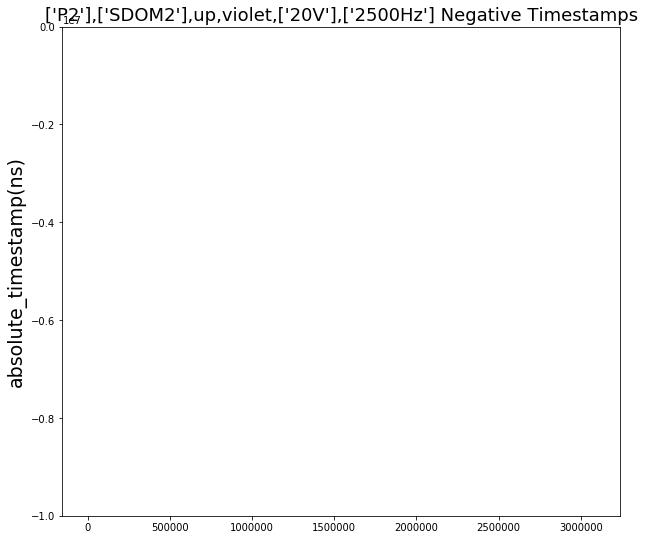

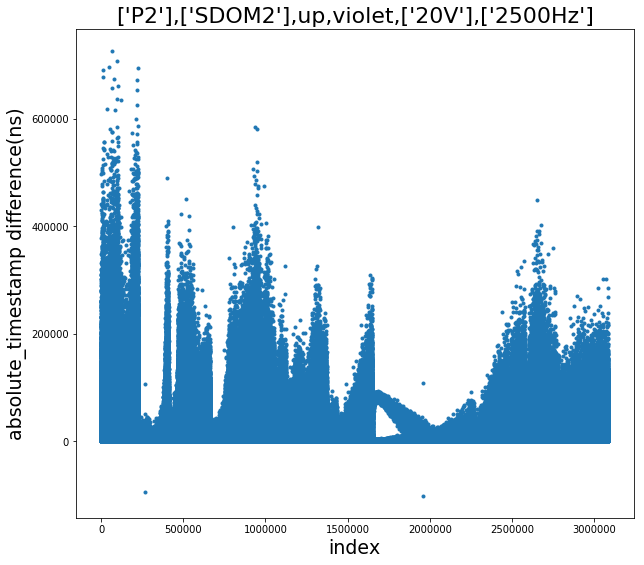

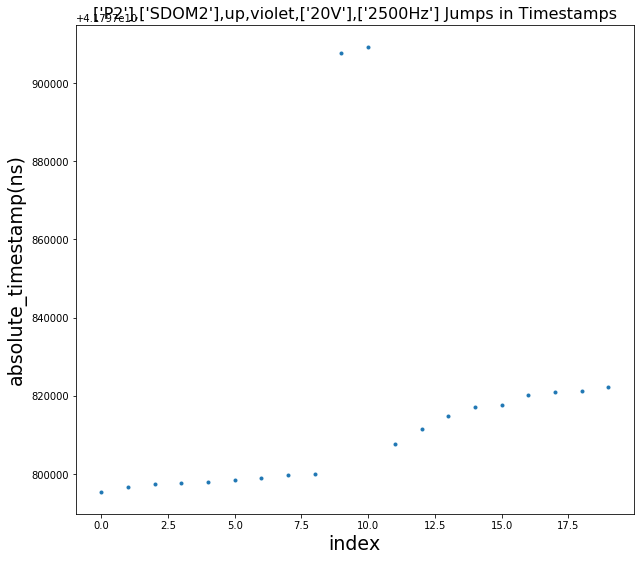

[ 267315. 1957783. 1957784.]


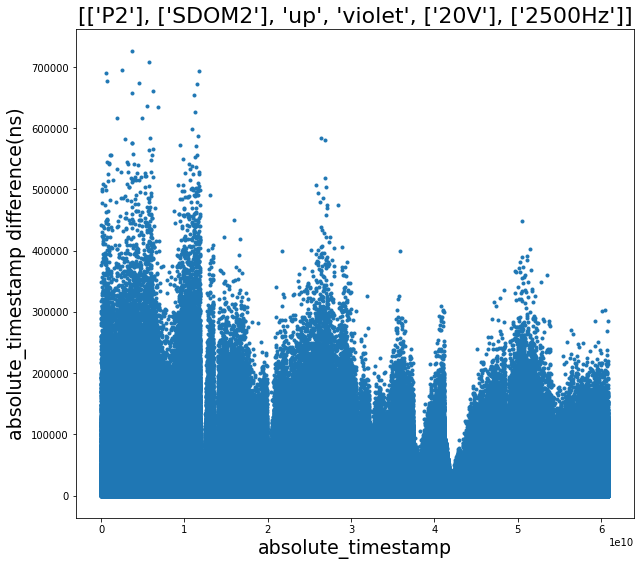

0.09716247952682489


In [171]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = c.P_S_used()

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:3285: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=1.0, top=1.0
  'bottom=%s, top=%s') % (bottom, top))


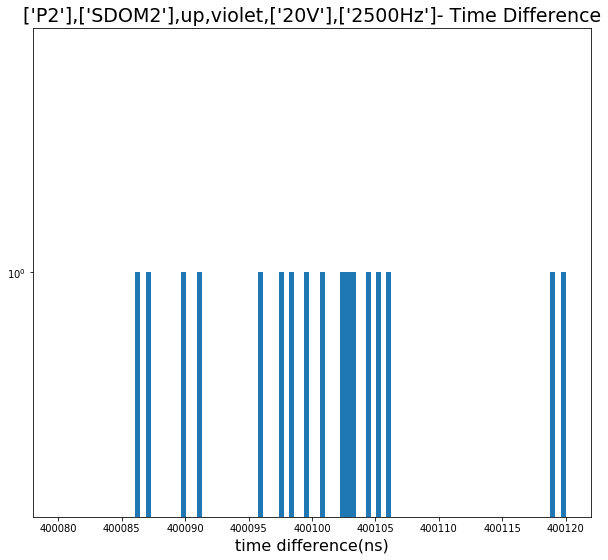

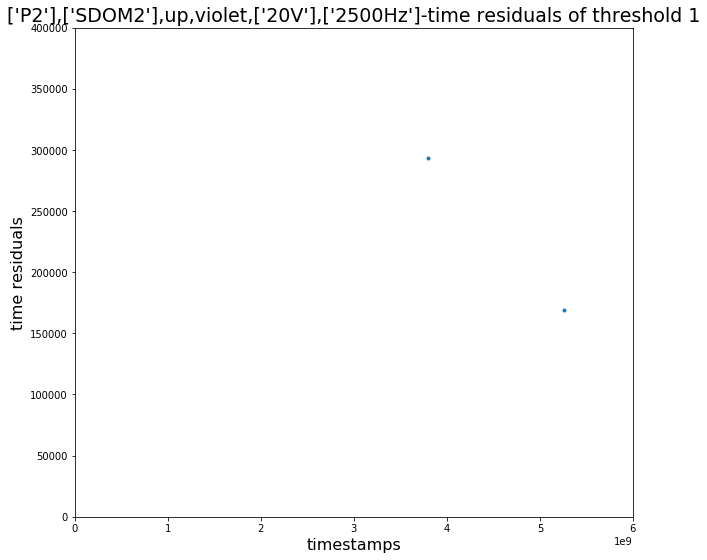

In [178]:
r3 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             0.0e10,0.6e10,0, 400000, file_path, values, POCAM_num, rising_0_elim_3, falling_0_elim_3)

400100.74138643965


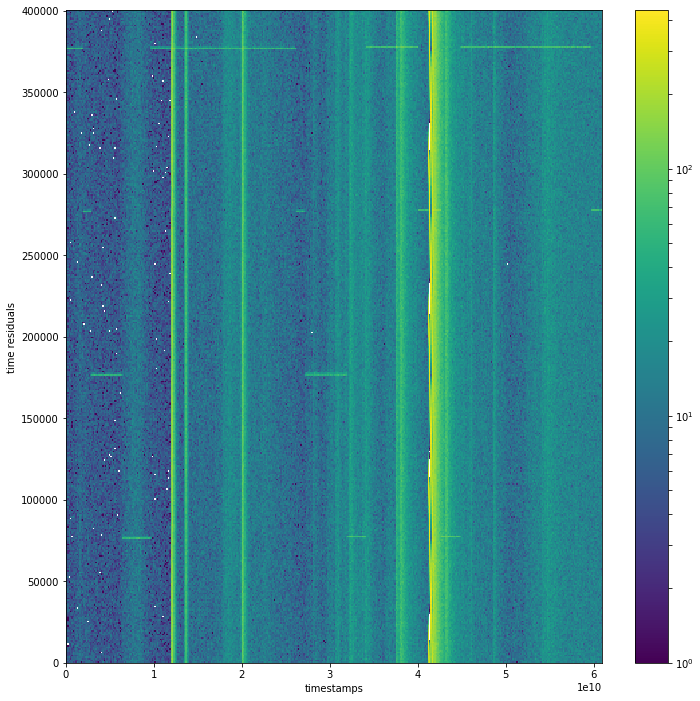

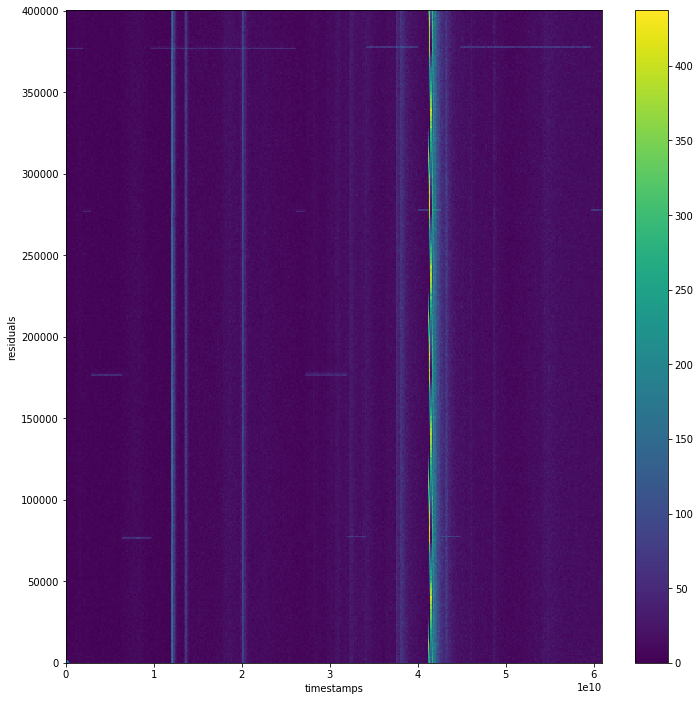

In [179]:
gaus_peak = r3.GetGausPeak([4.5e10,5.9e10])#400100.7064670303 #400100.7156722718
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r3.HIST2D(400, gaus_peak, SDOM_num)

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


T_RES_ALL.SIZE != ABS_ELIM.SIZE
T_RES_ALL.SIZE / ABS_ELIM.SIZE =  0.9981371517939235


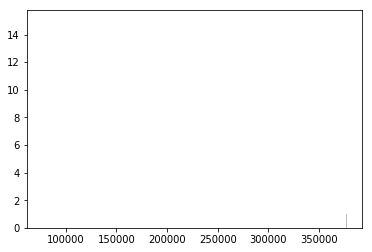

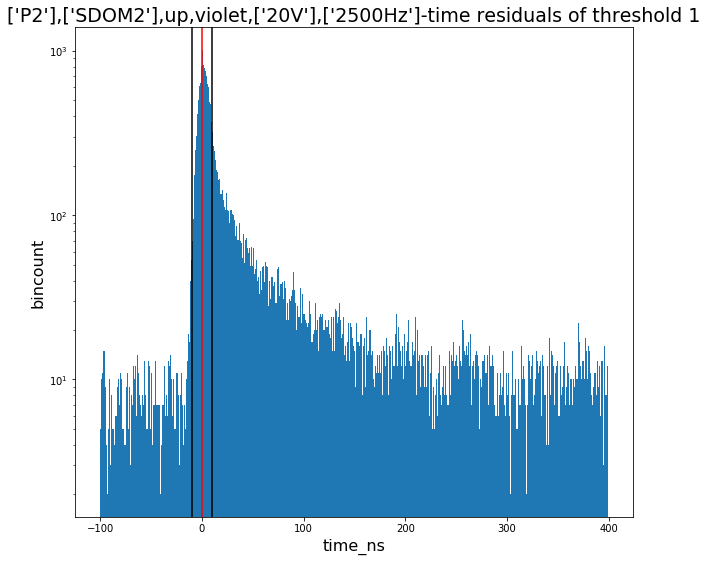

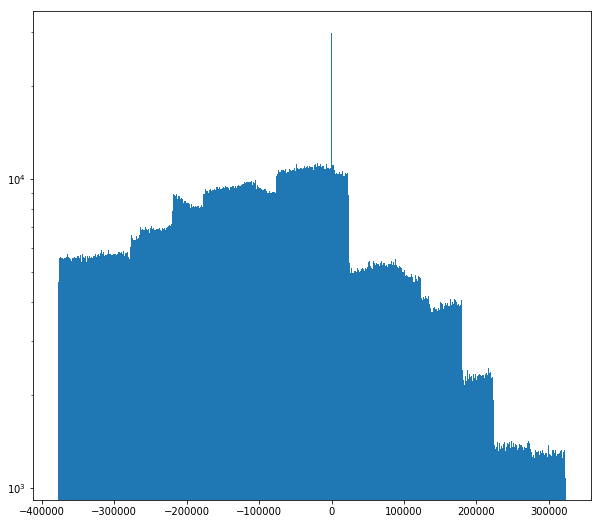

In [180]:
t_res_all1,num_events1, noise_events1 = r3.calc_res(BinsHist, 10, 2, 1)

In [181]:
sDOM2_HERA_run = run.run()
run_time, err_run_time,dead_time_uncert = sDOM2_HERA_run.run_time(atstamp, p_jumps, dt_mean, c.f_0,
                                                    c.f_1-c.r_1,
                                                    c.f_2-c.r_2,
                                                    c.f_3-c.r_3)

print('dead_time_uncert: ', err_run_time/run_time*100, '%')

time removed(small jumps) -  19118.70865058899
timestamp of the last event -  60881997141.74023
eliminating high jumps and summing -  60580263600.688736
run time -  60580244481.98009
dead_time_uncert:  0.1891301571131311 %
dead_time_uncert:  0.1881927613207941 %


# -----------------------------------------------------------
# sDOM3 POSEIDON

In [225]:
filename = '20190426_085559_UTC_SDOM3_FLASH_POSEIDON1_P2_violet_both_2500Hz_20V_60s_19116085609.hld_up.hdf5'
d = clean.clean(filename)

percentage of high jumps in the file - 15.30466833628788


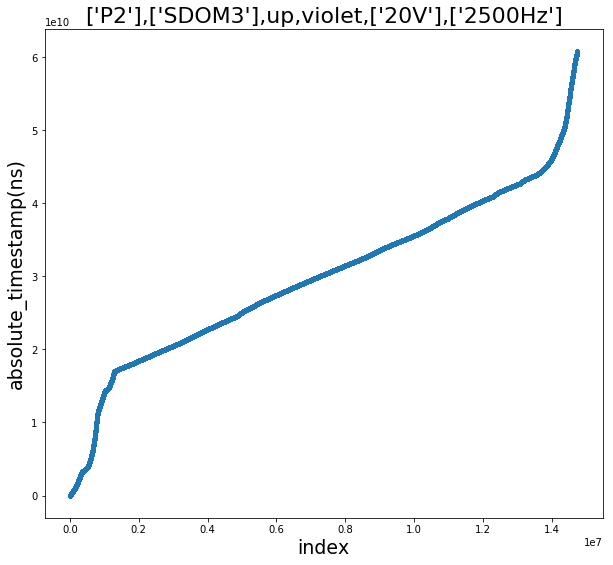

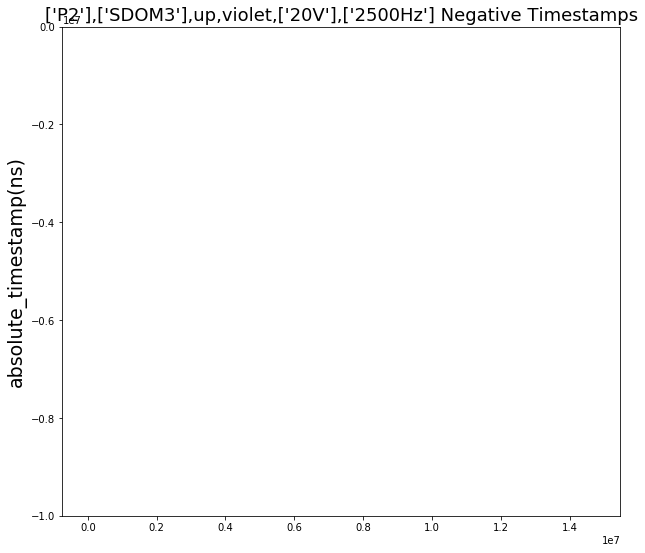

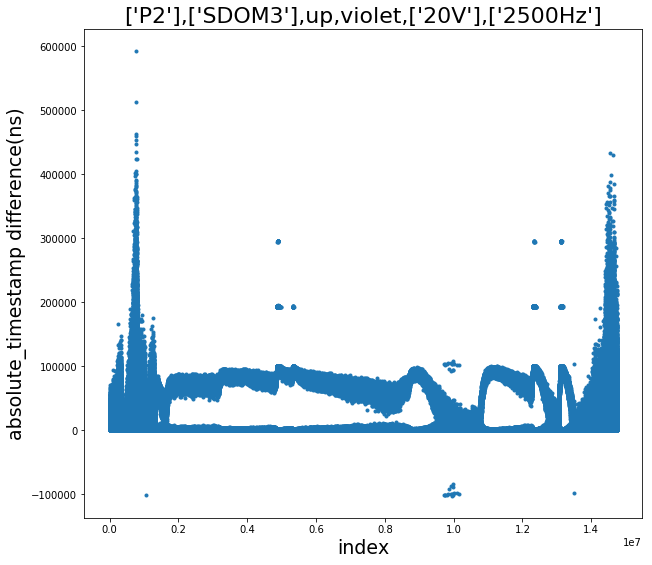

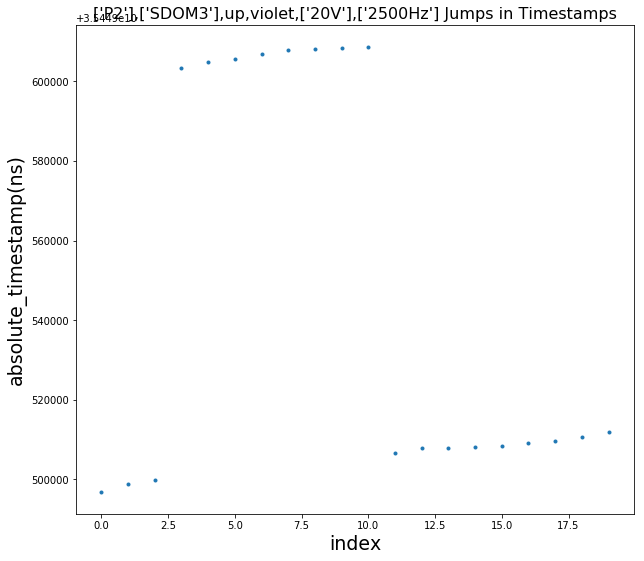

[ 1058160.  9721528.  9743292.  9743293.  9743294.  9743295.  9743296.
  9743297.  9748794.  9748795.  9748796.  9797811.  9797812.  9797813.
  9797814.  9797815.  9797816.  9846682.  9871238.  9871239.  9934396.
  9934397.  9934398.  9934399.  9934453.  9934454.  9934455.  9934456.
  9934457.  9934458.  9937254.  9937255.  9937256.  9937257.  9937258.
  9937259.  9937260.  9937261.  9944704.  9944705.  9944706.  9944707.
  9975294.  9977735.  9977792.  9977793.  9981291.  9981292.  9981293.
 10001037. 10105877. 10105878. 10105879. 10147169. 10147170. 13487617.
 13487618. 13487619.]


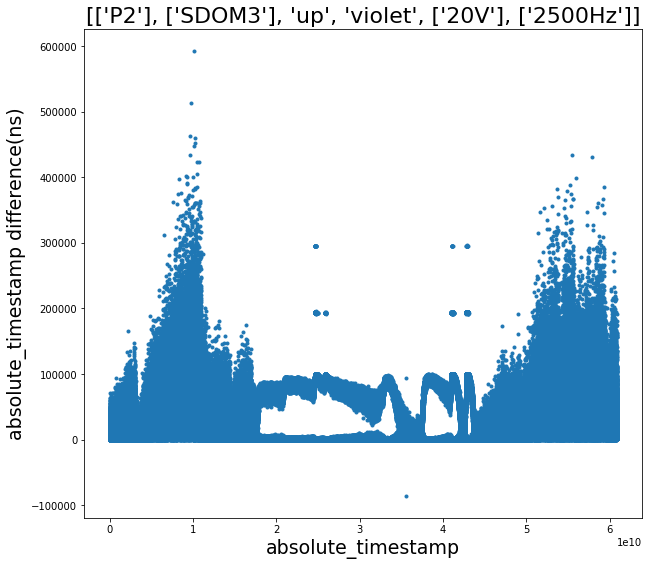

0.5402122957256188


In [226]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = d.P_S_used()

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/matplotlib/ticker.py:2206: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  "Data has no positive values, and therefore cannot be "


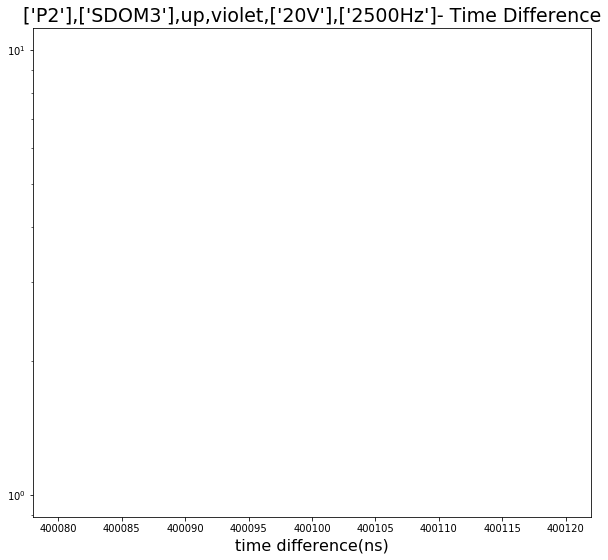

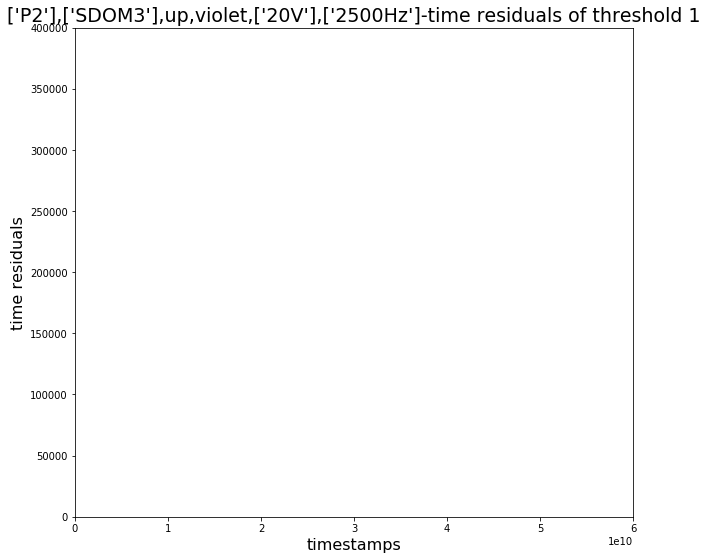

In [10]:
r4 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             0.0e10,6e10,0, 400000, file_path, values, POCAM_num,rising_0_elim_3,falling_0_elim_3)

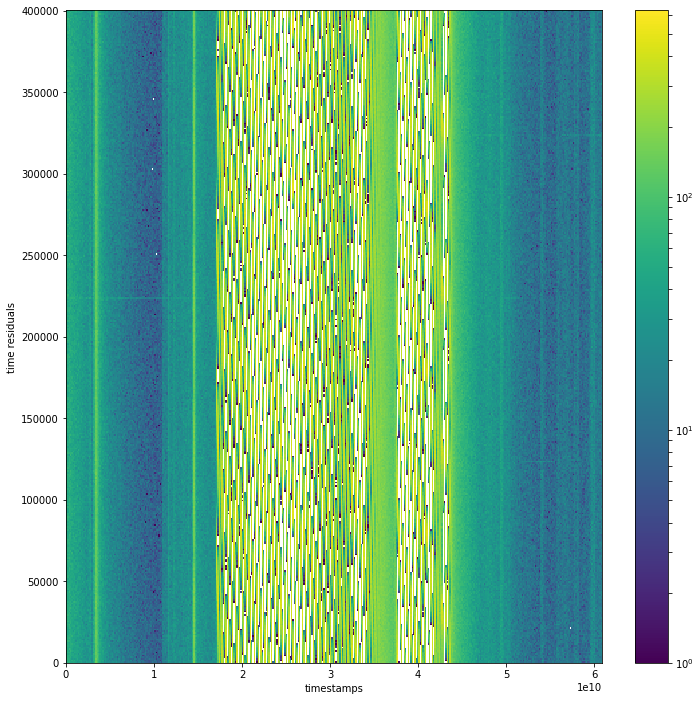

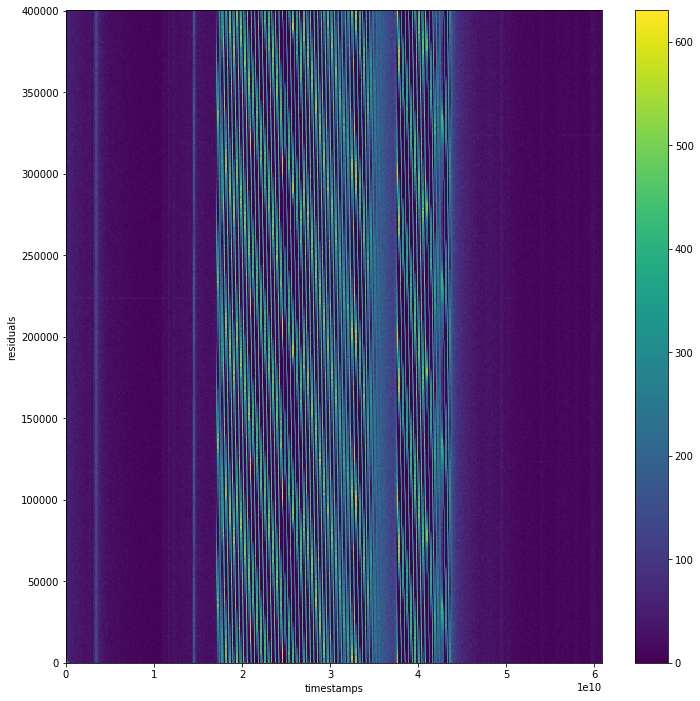

In [328]:
#gaus_peak = r4.minimizer(5.1e10,6e10)
#gaus_peak = r4.minimizer(4.5e10,5e10)
gaus_peak = 400100.7156722718
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r4.HIST2D(400, gaus_peak, SDOM_num)

In [55]:
#plt.plot(POCAM_bins, '.')
print(r4.JumpIndex) # bin 223


[ 32  42  45  46  48  49  50  64  72  73  82  84  93 100 112 280 290 291
 292 295 296 297 299 310 312 317 329 334 335 344 352 361 370 390]


0.3756827648418125


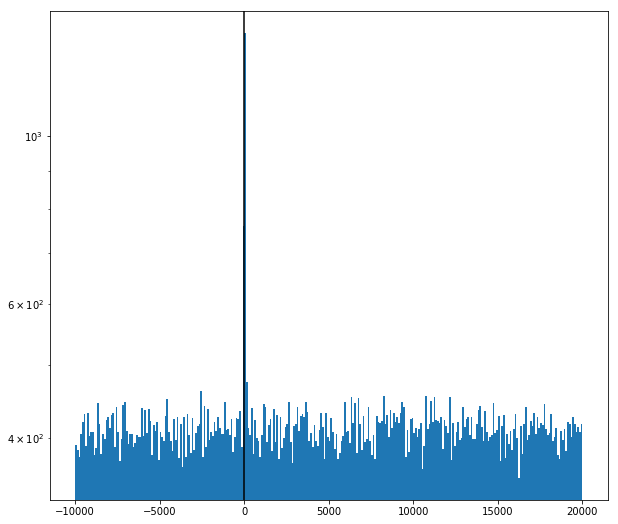

In [13]:
## POCAM signal (plot by eye)

gaus_peak = 400100.7156722718

time_window1 = (abs_elim_3>0.0e10) & (abs_elim_3<1.6e10)
time_window2 = (abs_elim_3>4.7e10) & (abs_elim_3<5.0e10)
time_window3 = abs_elim_3>5.7e10
time_window4 = (abs_elim_3>1.8e10) & (abs_elim_3<4.25e10)

my_data_all = np.array([])
weights_all = np.array([])

my_slice = (abs_elim_3+rising_1_elim_3)[time_window1] 
weights = r4.weights[time_window1]
my_res = (my_slice%gaus_peak) - 223260
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window2]
weights = r4.weights[time_window2]
my_res = (my_slice%gaus_peak) - 223260-100000+89-500-15
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window3]
weights = r4.weights[time_window3]
my_res = (my_slice%gaus_peak) - 223260-100000+89-500-15-123
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window4]
weights = r4.weights[time_window4]
my_res = (my_slice%gaus_peak) -100000+89-500-15-123
#my_data_all = np.append(my_data_all, my_res)
#weights_all = np.append(weights_all,weights)

fig, ax = plt.subplots(figsize=(10,9))
n,bins,patches = ax.hist(my_data_all,bins=300,log=True, weights=weights_all, range=(-10000,20000))
ax.axvline(color='k')

# save to csv
path = 'Data/POSEIDON1/Measured_arrival_times/'
filename = "['P2'],['SDOM3'],up,violet,['20V'],['2500Hz'].csv"
#with open(path+filename, 'w') as csvfile:
#    writer = csv.writer(csvfile)
#    writer.writerow(bins[:-1])
#    writer.writerow(n)
#csvfile.close()

#time_correction_4 = my_data_all.size/d.atstamp.size
time_correction_4 = (abs_elim_3[-1]-abs_elim_3[0])/(1.6e10 + (5.0-4.7)*1e10 + (abs_elim_3[-1]-5.7e10))
print(time_correction_4)




In [227]:
sDOM3_POSEIDON_run = run.run()
run_time, err_run_time, dead_time_uncert = sDOM3_POSEIDON_run.run_time(atstamp, p_jumps, dt_mean, d.f_0,
                                                    d.f_1-d.r_1,
                                                    d.f_2-d.r_2,
                                                    d.f_3-d.r_3)

print(dead_time_uncert, '%')

time removed(small jumps) -  34763.49954032898
timestamp of the last event -  60866087218.76758
eliminating high jumps and summing -  44251715304.20169
run time -  44251680540.70215
1.1424645215169166e-10 %


In [231]:
err_run_time*1e9/60866087218.76758 * 100/2

1.5592730733224076

14662754
128397


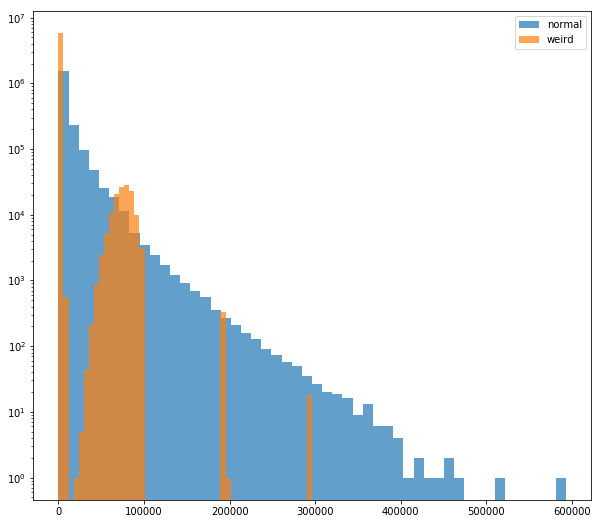

In [101]:
total_events = abs_elim_3.size
print(total_events)
weird_shape_slice = abs_elim_3[2000000:8000000]
normal_slice = abs_elim_3[0:2000000]

#print(weird_shape_slice.size/total_events)

diff = np.diff(weird_shape_slice)
diff_slice = diff[(diff<100000) & (diff>50000)]
print(diff_slice.size)

diff_normal = np.diff(normal_slice)

fig, ax = plt.subplots(figsize=(10,9))
ax.hist(diff_normal,bins=50,log=True,alpha=.7,label='normal')
n,bins,patches = ax.hist(diff,bins=50,log=True,alpha=.7,label='weird')
ax.legend()


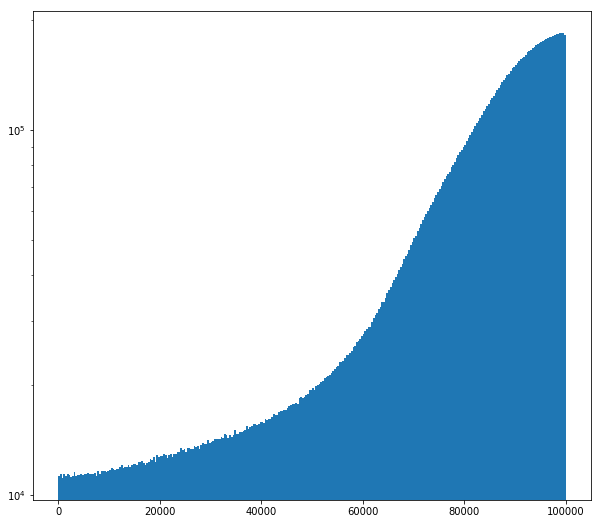

In [136]:
## other weird signal 

#my_slice = abs_elim_3[:1400000]
#my_slice = abs_elim_3[2000000:8000000]
my_slice = abs_elim_3
gaus_peak = 100000 # 10kHz
my_res = my_slice%gaus_peak

fig, ax = plt.subplots(figsize=(10,9))
_ = ax.hist(my_res,bins=300,log=True)

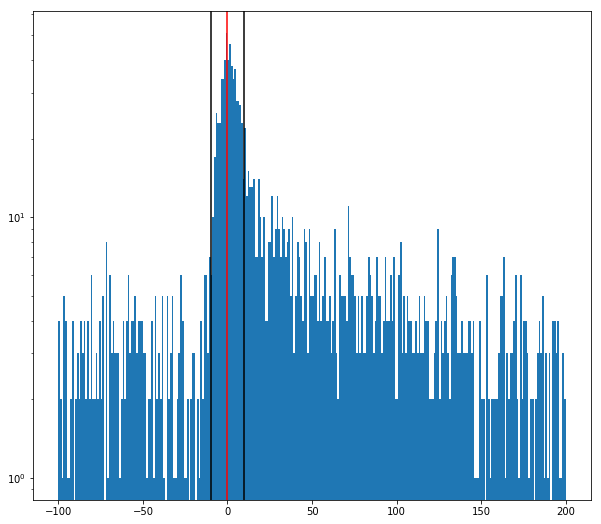

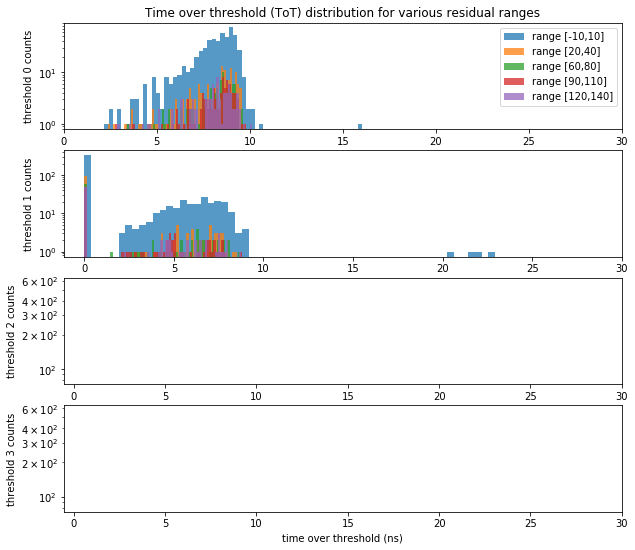

In [247]:
## ToT at various arrival time windows

# Slice a small time window
slice_range = [(abs_elim_3>0.0e10)&(abs_elim_3<1.5e10)]
my_slice = (abs_elim_3+rising_1_elim_3)[slice_range]
gaus_peak = 400100.7156722718
my_res = my_slice%gaus_peak
my_res = my_res - 223260

fig, ax = plt.subplots(figsize=(10,9))
n,bins,patches = ax.hist(my_res,bins=300,log=True, range=(-100,200) )
ax.axvline(color='r')
ax.axvline(-10,color='k')
ax.axvline(10,color='k')

# slice ToT within time window
ToT = np.array([[falling_0_elim_3 - rising_0_elim_3],
                [falling_1_elim_3 - rising_1_elim_3],
                [falling_2_elim_3 - rising_2_elim_3],
                [falling_3_elim_3 - rising_3_elim_3]])
ToT = ToT[:,slice_range]

# residue slice range list
res_slice_list = [(-10,10),(20,40),(60,80),(90,110),(120,140)]

fig, ax = plt.subplots(nrows=4,figsize=(10,9))

for slice_range in res_slice_list:
    lbound,ubound = slice_range
    res_slice = (my_res>lbound)&(my_res<ubound)
    ToT_slice = ToT[:,res_slice]
    for i in range(4):
        label = 'range [%d,%d]'%(lbound,ubound)
        ax[i].hist(ToT_slice[i,:],bins=60,alpha=.75,label=label,log=True)

# plot results
ax[3].set_xlabel('time over threshold (ns)')
ax[0].set_title('Time over threshold (ToT) distribution for various residual ranges')
ax[0].legend()
for i in range(4):
    ax[i].set_xticks([0,5,10,15,20,25,30])
    ax[i].set_ylabel('threshold %i counts'%i)

#plt.savefig('Data/POSEIDON1/testing/ToT_distribution.png',bbox_inches='tight')

# -----------------------------------------------------------
# sDOM3 SANTACLAUS

In [68]:
filename = '20181205_092552_UTC_SDOM3_FLASH_SANTACLAUS_P2_violet_both_5000Hz_20V_60s_18339135919.hld_up.hdf5'
d = clean.clean(filename)

percentage of high jumps in the file - 0.0


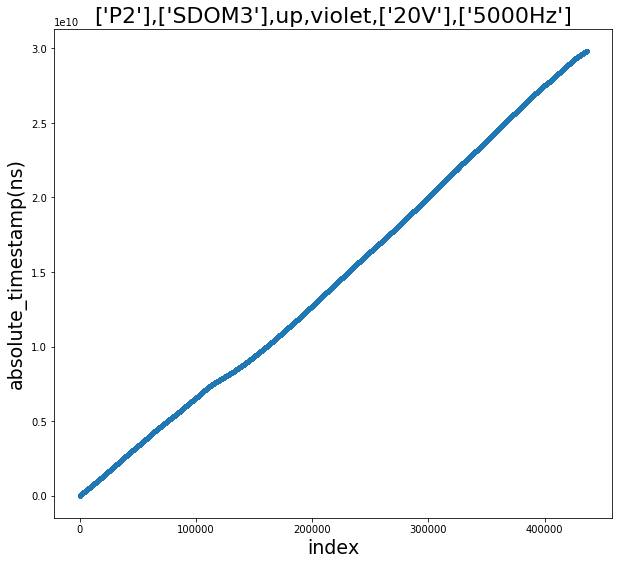

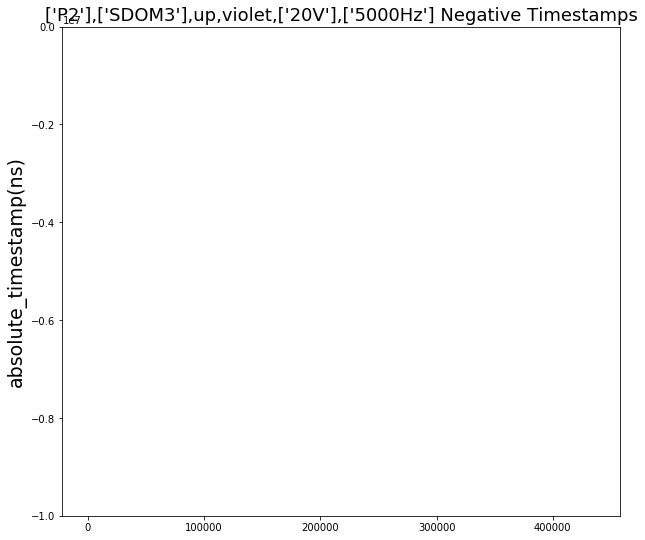

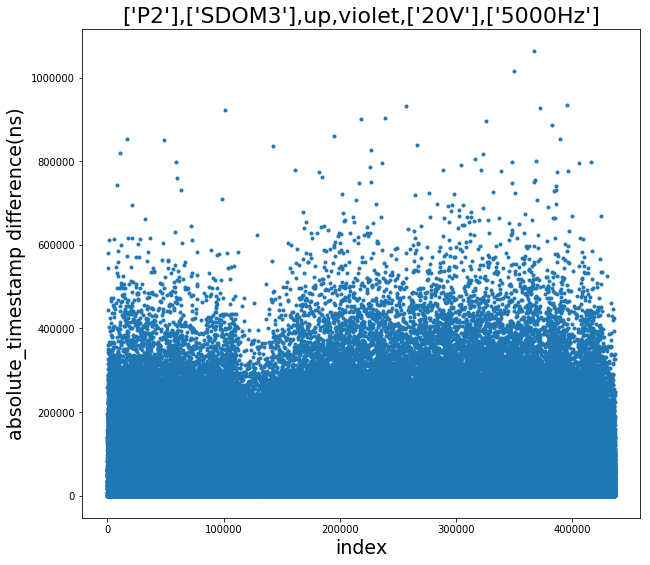

[]


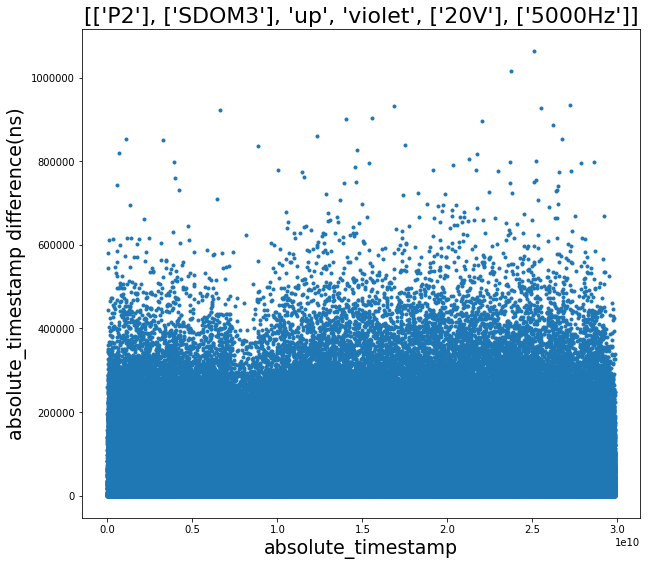

0.1284901716491025


In [69]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = d.P_S_used()

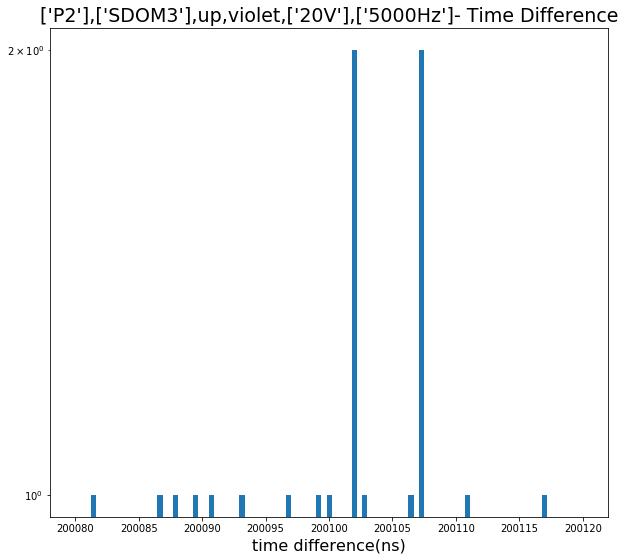

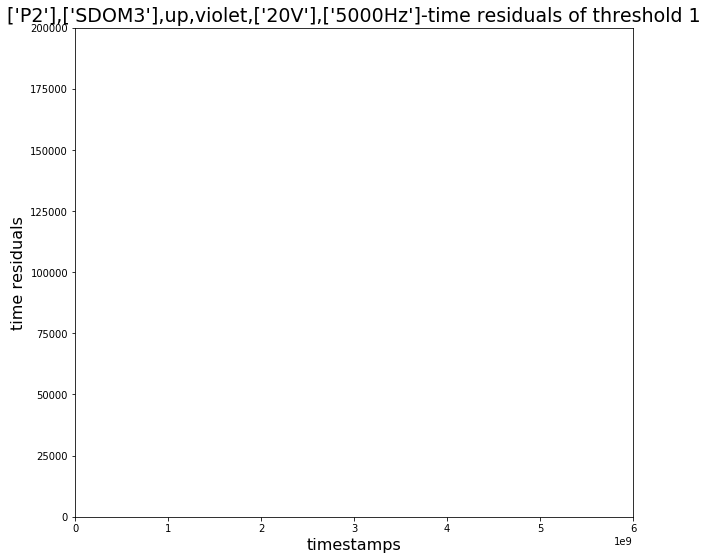

In [70]:
r4 = residual.residual(abs_elim_3,rising_1_elim_3,200080, 200120, 100, 
                                200095, 200105,
             0.0e10,0.6e10,0, 200000, file_path, values, POCAM_num, rising_0_elim_3, falling_0_elim_3)

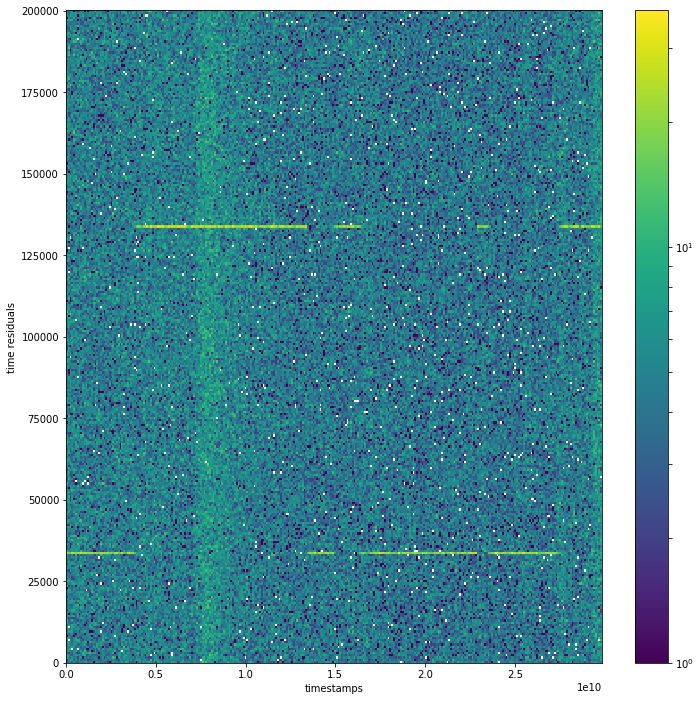

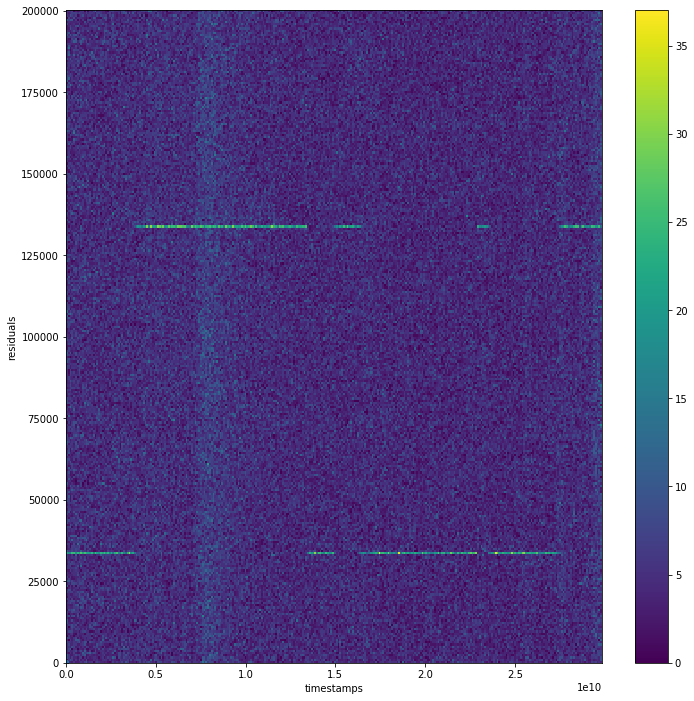

In [142]:
gaus_peak = 200100.35102879315 # up to 200100.34362879315, 200100.35362879315
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r4.HIST2D(300, gaus_peak, SDOM_num)

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:719: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


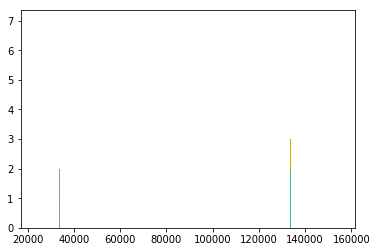

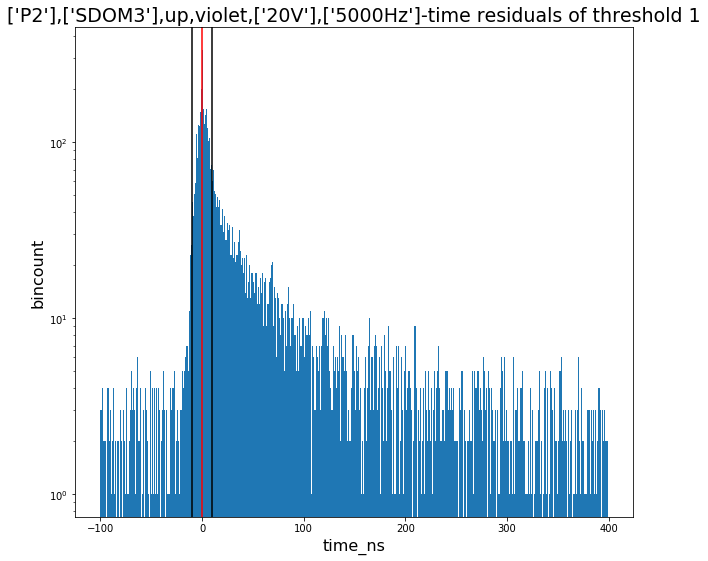

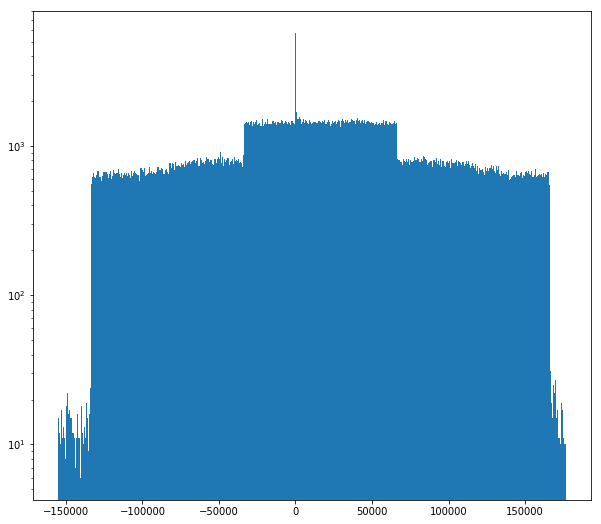

In [143]:
t_res_all1,num_events1, noise_events1 = r4.calc_res(BinsHist, 10, 2, 1)

# -----------------------------------------------------------
# sDOM3 MINOS

In [231]:
filename = '20190313_165314_UTC_SDOM3_FLASH_MINOS1_P2_violet_both_2500Hz_20V_30s_19072165324.hld_up.hdf5'
d = clean.clean(filename)

percentage of high jumps in the file - 0.0


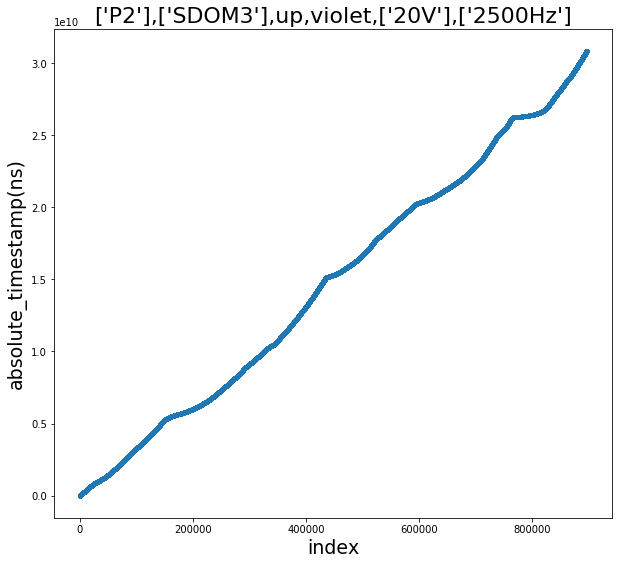

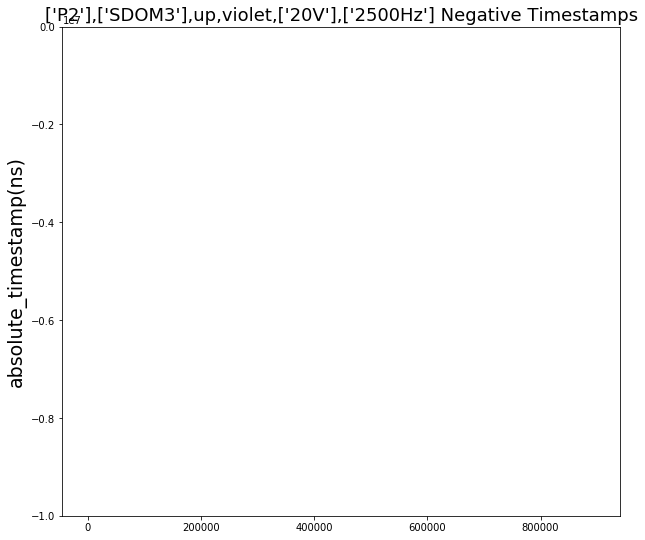

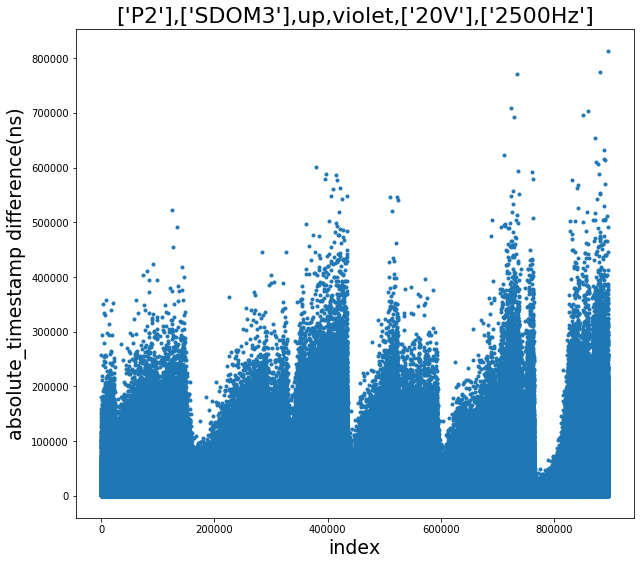

[]


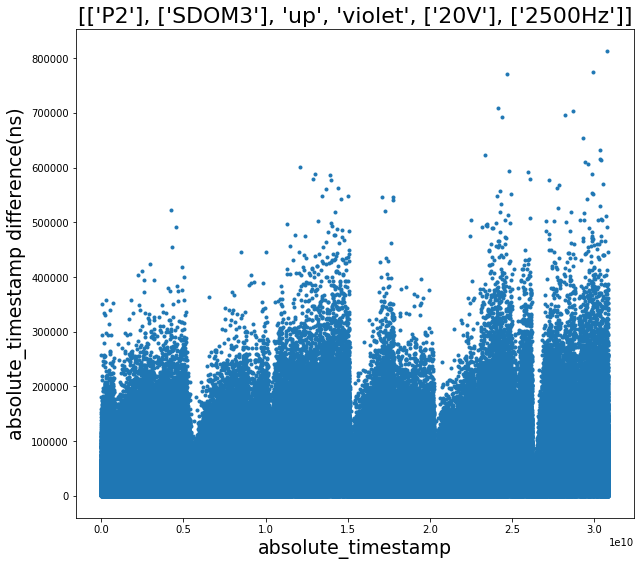

0.11213830092603452


In [232]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = d.P_S_used()

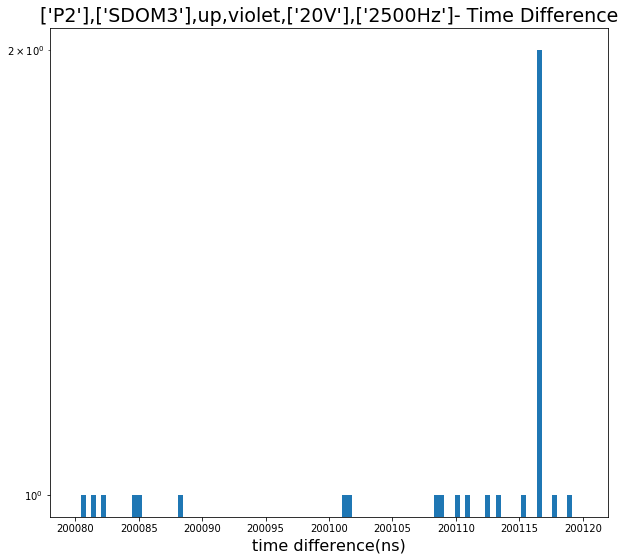

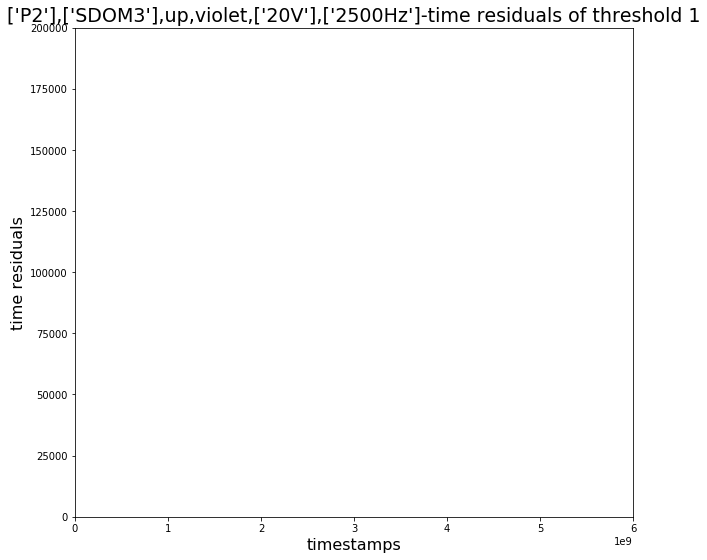

In [233]:
r4 = residual.residual(abs_elim_3,rising_1_elim_3,200080, 200120, 100, 
                                200095, 200105,
             0.0e10,0.6e10,0, 200000, file_path, values, POCAM_num, rising_0_elim_3, falling_0_elim_3)

400100.7063353919


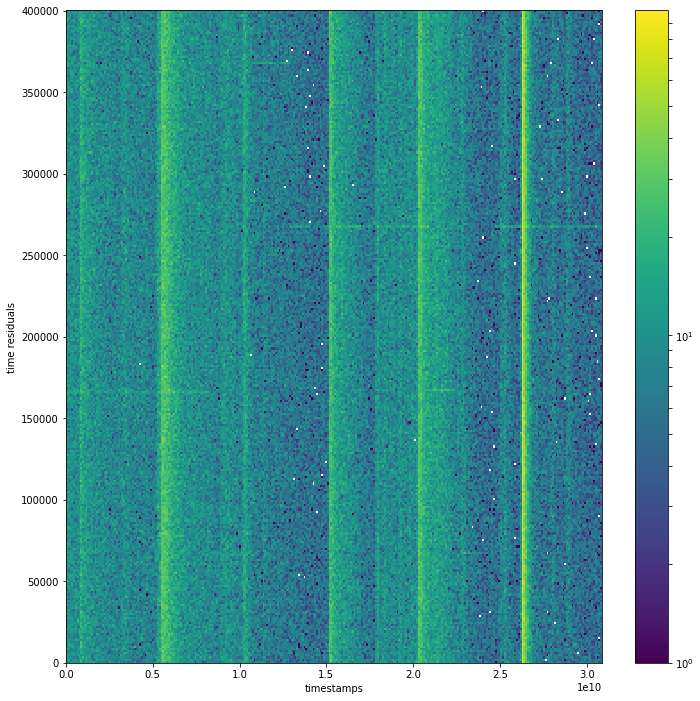

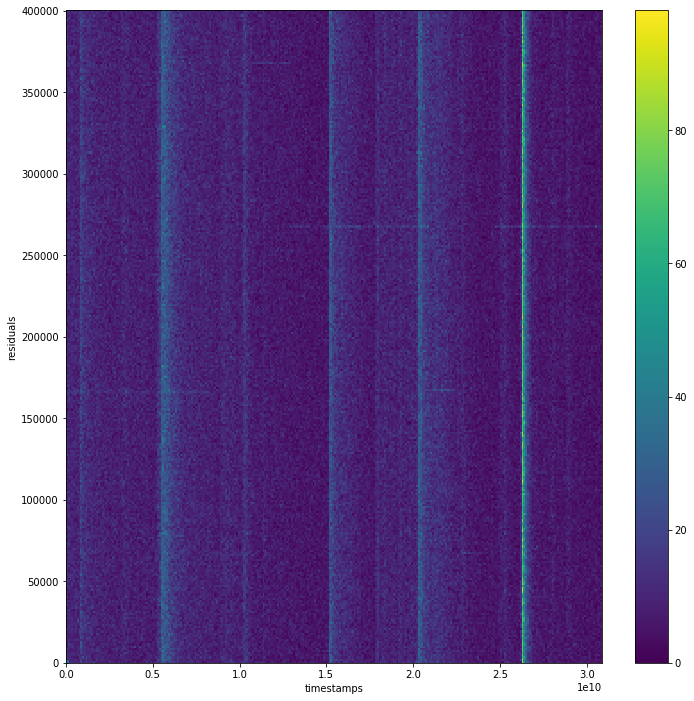

In [86]:
gaus_peak = r4.GetGausPeak([1.3e10,2e10])
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r4.HIST2D(300, gaus_peak, SDOM_num)

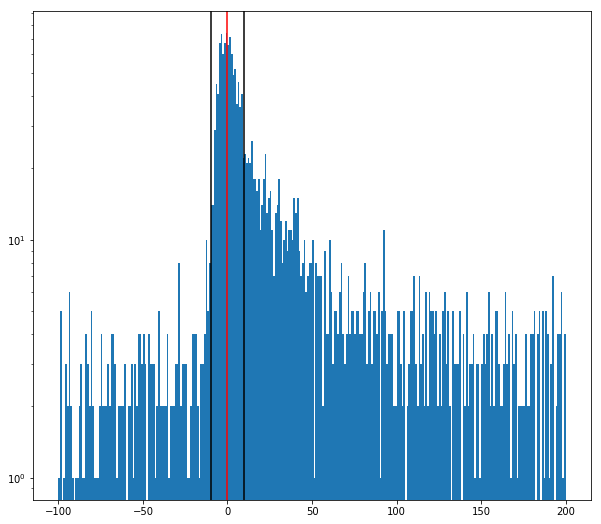

In [234]:
## POCAM signal (plot by eye)
gaus_peak = 400100.7063353919

time_window1 = (abs_elim_3<.8e10)
time_window2 = (abs_elim_3>.8e10) & (abs_elim_3<1.05e10)
time_window3 = (abs_elim_3>1.05e10) & (abs_elim_3<1.3e10)
time_window4 = (abs_elim_3>1.3e10) & (abs_elim_3<2.05e10)
time_window5 = (abs_elim_3>2.05e10) & (abs_elim_3<2.25e10)
time_window6 = (abs_elim_3>2.25e10) & (abs_elim_3<2.49e10)
time_window7 = abs_elim_3>2.49e10

my_data_all = np.array([])
weights_all = np.array([])

my_slice = (abs_elim_3+rising_1_elim_3)[time_window1] 
weights = r4.weights[time_window1]
my_res = (my_slice%gaus_peak) - 223260+55000+1600-16.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window2]
weights = r4.weights[time_window2]
my_res = (my_slice%gaus_peak) - 223260+160000-3000-417
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window3]
weights = r4.weights[time_window3]
my_res = (my_slice%gaus_peak) - 223260-100000-45000+1500-20
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window4]
weights = r4.weights[time_window4]
my_res = (my_slice%gaus_peak) -270000+3221
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window5]
weights = r4.weights[time_window5]
my_res = (my_slice%gaus_peak) -166800+20
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window6]
weights = r4.weights[time_window6]
my_res = (my_slice%gaus_peak) -100000+33219
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window7]
weights = r4.weights[time_window7]
my_res = (my_slice%gaus_peak) -266900+15
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)


fig, ax = plt.subplots(figsize=(10,9))
n,bins,patches = ax.hist(my_data_all,bins=300,log=True, weights=weights_all, range=(-100,200))
ax.axvline(color='r')
ax.axvline(10,color='k')
ax.axvline(-10,color='k')

# save to csv
path = 'Data/MINOS1/uv/Measured_arrival_times/'
filename = "['P2'],['SDOM3'],up,violet,['20V'],['2500Hz'].csv"
with open(path+filename, 'w') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(bins[:-1])
    writer.writerow(n)
csvfile.close()

#time_correction_4 = (abs_elim_3[-1]-abs_elim_3[0])/(1.6e10 + (5.0-4.7)*1e10 + (abs_elim_3[-1]-5.7e10))
#print(time_correction_4)



In [141]:
sDOM3_MINOS_run = run.run()
run_time, err_run_time, dead_time_uncert = sDOM3_MINOS_run.run_time(atstamp, p_jumps, dt_mean, d.f_0,
                                                    d.f_1-d.r_1,
                                                    d.f_2-d.r_2,
                                                    d.f_3-d.r_3)

print(dead_time_uncert, '%')

timestamp of the last event -  30859671358.62695
eliminating high jumps and summing -  30856692124.91406
run time -  30856692124.91406
0.0 %


# -----------------------------------------------------------
# sDOM3 HERA

In [182]:
filename = '20190607_162916_UTC_SDOM3_FLASH_HERA1_P2_violet_both_2500Hz_20V_60s_19158162926.hld_up.hdf5'
d = clean.clean(filename)

percentage of high jumps in the file - 3.4786390813485437


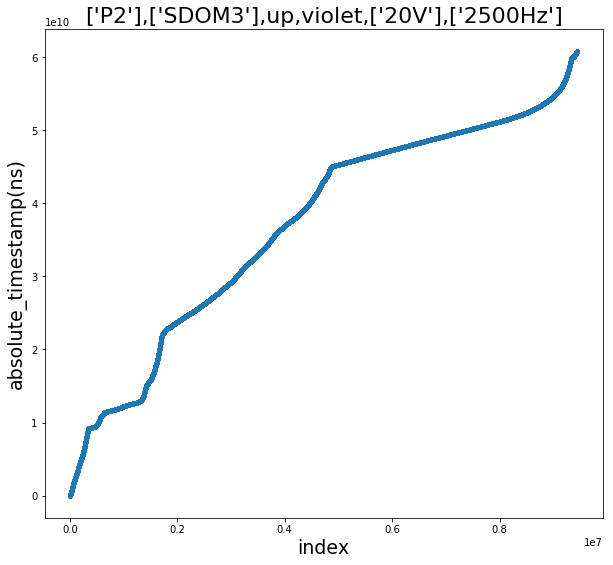

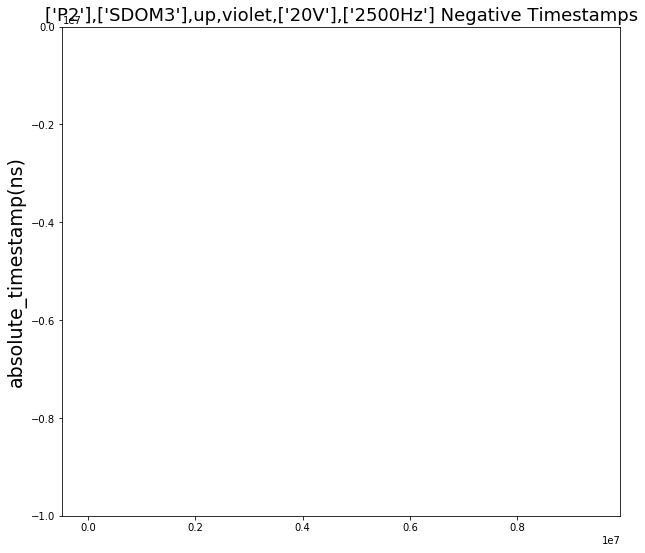

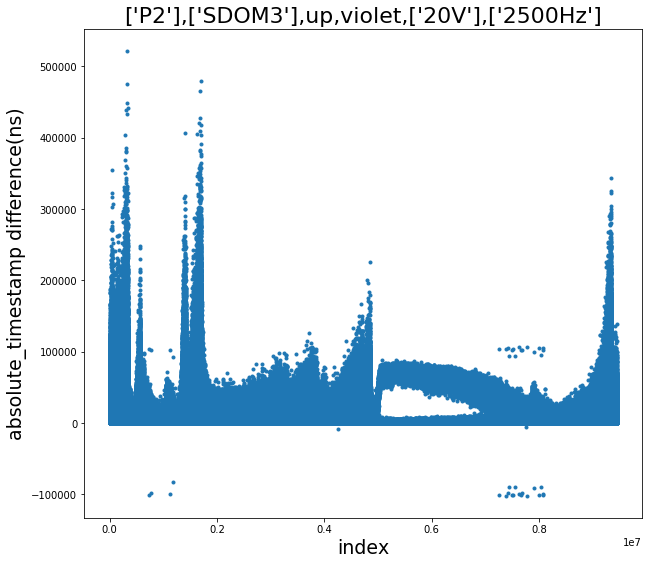

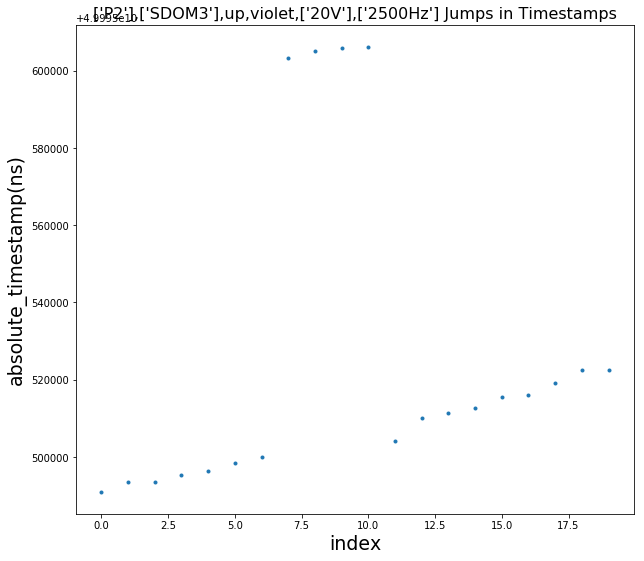

[ 727739.  727740.  727741.  764123. 1131648. 1131649. 1131650. 1131651.
 1131652. 1131653. 1174206. 1174207. 1174208. 1174209. 1174210. 1174211.
 1174212. 1174213. 1174214. 4259341. 4259342. 4259343. 4259344. 4259345.
 7244631. 7383847. 7383848. 7383849. 7383850. 7425619. 7442943. 7442944.
 7442945. 7442946. 7492399. 7512226. 7552920. 7552921. 7552922. 7552923.
 7552924. 7552925. 7552926. 7552927. 7633466. 7666891. 7666892. 7666893.
 7666894. 7666895. 7671901. 7671902. 7671903. 7754082. 7754083. 7754084.
 7754085. 7754086. 7754087. 7754088. 7782725. 7782726. 7782727. 7907285.
 7907286. 7907287. 7907288. 7989007. 8031224. 8031225. 8031226. 8031227.
 8031228. 8066312. 8066313. 8066314. 8066315. 8077632.]


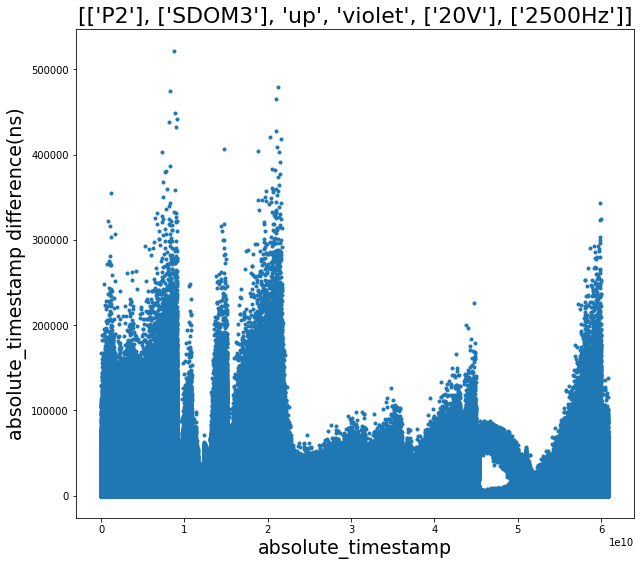

0.20448361999013542


In [183]:
(abs_elim_3, rising_0_elim_3, rising_1_elim_3, rising_2_elim_3, rising_3_elim_3,
 falling_0_elim_3, falling_1_elim_3, falling_2_elim_3, falling_3_elim_3, POCAM_num, values,
atstamp, p_jumps, dt_mean, f_r, file_path, SDOM_num, PMT,sub_time_elim_3,sub_id_elim_3) = d.P_S_used()

/Users/MatthewMan/anaconda3/lib/python3.6/site-packages/matplotlib/ticker.py:2206: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  "Data has no positive values, and therefore cannot be "


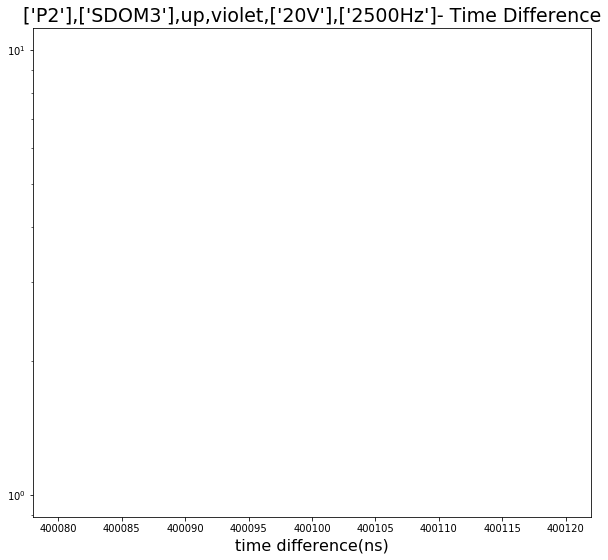

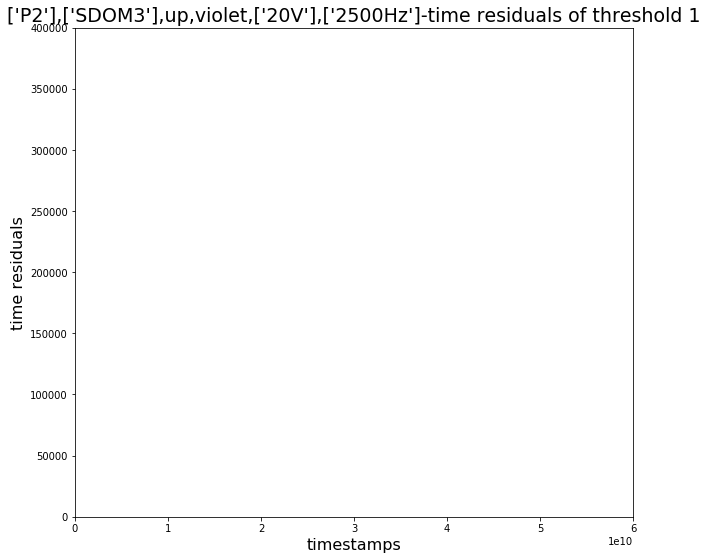

In [184]:
r4 = residual.residual(abs_elim_3,rising_1_elim_3,400080, 400120, 100, 
                                400095, 400105,
             0.0e10,6e10,0, 400000, file_path, values, POCAM_num,rising_0_elim_3,falling_0_elim_3)

400100.74050929694


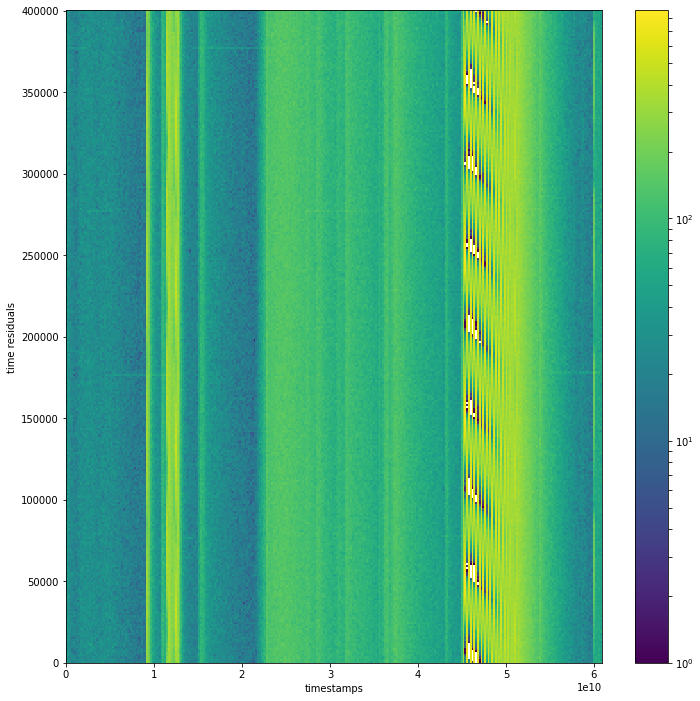

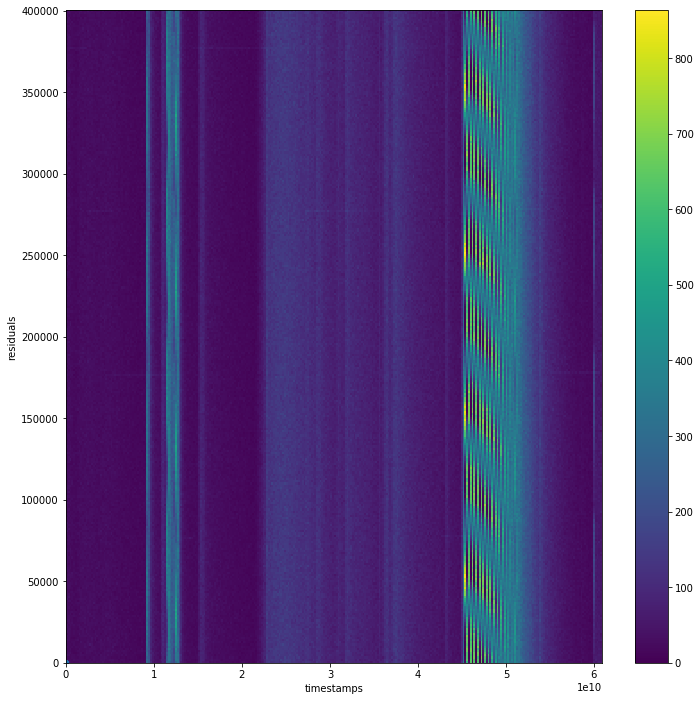

In [186]:
gaus_peak = r4.GetGausPeak([1.5e10,2.1e10])
abs_elim, BinsHist, JumpIndex, xedges, yedges, POCAM_bins, POCAM_diff = r4.HIST2D(300, gaus_peak, SDOM_num)

0.5401133276607534


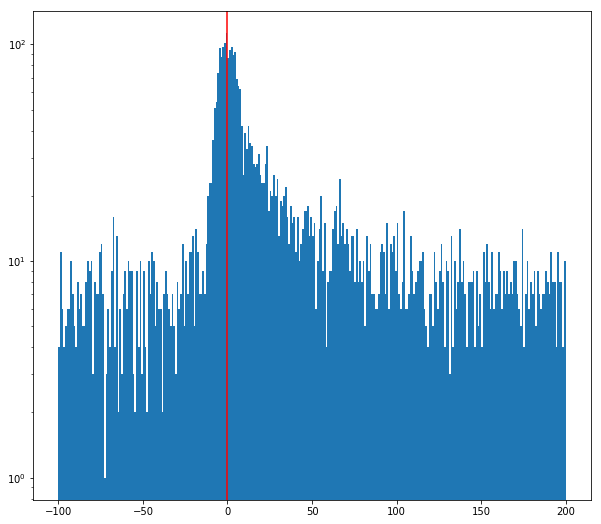

In [228]:
## POCAM signal (plot by eye)
#gaus_peak = 400100.7063353919

time_window1 = (abs_elim_3<.2e10)
time_window2 = (abs_elim_3>.2e10) & (abs_elim_3<.45e10)
time_window3 = (abs_elim_3>.45e10) & (abs_elim_3<1.2e10)
time_window4 = (abs_elim_3>1.4e10) & (abs_elim_3<2.2e10)
time_window5 = (abs_elim_3>2.8e10) & (abs_elim_3<3.5e10)
time_window6 = abs_elim_3>5.5e10

my_data_all = np.array([])
weights_all = np.array([])

my_slice = (abs_elim_3+rising_1_elim_3)[time_window1] 
weights = r4.weights[time_window1]
my_res = (my_slice%gaus_peak) - 380200+3005
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window2]
weights = r4.weights[time_window2]
my_res = (my_slice%gaus_peak) - 278000+805.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window3]
weights = r4.weights[time_window3]
my_res = (my_slice%gaus_peak) - 177200+6
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window4]
weights = r4.weights[time_window4]
my_res = (my_slice%gaus_peak) -380000+2706
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window5]
weights = r4.weights[time_window5]
my_res = (my_slice%gaus_peak) -276400-900+3.5
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)

my_slice = (abs_elim_3+rising_1_elim_3)[time_window6]
weights = r4.weights[time_window6]
my_res = (my_slice%gaus_peak) -100000+33219-110750
my_data_all = np.append(my_data_all, my_res)
weights_all = np.append(weights_all,weights)


fig, ax = plt.subplots(figsize=(10,9))
n,bins,patches = ax.hist(my_data_all,bins=300,log=True, weights=weights_all, range=(-100,200))
ax.axvline(color='r')
#ax.axvline(10,color='k')
#ax.axvline(-10,color='k')

# save to csv
path = 'Data/HERA1/violet/Measured_arrival_times/'
filename = "['P2'],['SDOM3'],up,violet,['20V'],['2500Hz'].csv"
with open(path+filename, 'w') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(bins[:-1])
    writer.writerow(n)
csvfile.close()

time_correction_4 = (abs_elim_3[-1]-abs_elim_3[0])/((1.2 + .8 + .7 + (abs_elim_3[-1]/1e10-5.5))*1e10)
print(time_correction_4)


In [226]:
sDOM3_HERA_run = run.run()
run_time, err_run_time, dead_time_uncert = sDOM3_HERA_run.run_time(atstamp, p_jumps, dt_mean, d.f_0,
                                                    d.f_1-d.r_1,
                                                    d.f_2-d.r_2,
                                                    d.f_3-d.r_3)

print(dead_time_uncert, '%')

time removed(small jumps) -  211413.0722026825
timestamp of the last event -  60882088829.19042
eliminating high jumps and summing -  58115647426.34129
run time -  58115436013.26909
0.5859162783496578 %
